<a href="https://colab.research.google.com/github/machiwao/CCADMACL_PROJECT_COM222/blob/judiciary/CCADMACL_Project_Implementation_extracted%20outliers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multidimensinal Poverty Measures
Dataset Reference: https://www.kaggle.com/datasets/grosvenpaul/family-income-and-expenditure/data

1.   How do income and spending patterns vary across different regions in the Philippines?
2.   Can we identify clusters of regions with similar economic characteristics?
3. What are the distinguishing characteristics of each cluster in terms of spending habits?


In [607]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, normalize
from imblearn.under_sampling import TomekLinks
from sklearn.model_selection import train_test_split

# Data Loading

In [608]:
df = pd.read_csv('https://raw.githubusercontent.com/machiwao/CCADMACL_PROJECT_COM222/refs/heads/main/Family%20Income%20and%20Expenditure.csv')
df.head()

,Total Household Income,Region,Total Food Expenditure,Main Source of Income,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,...,Number of Refrigerator/Freezer,Number of Washing Machine,Number of Airconditioner,"Number of Car, Jeep, Van",Number of Landline/wireless telephones,Number of Cellular phone,Number of Personal Computer,Number of Stove with Oven/Gas Range,Number of Motorized Banca,Number of Motorcycle/Tricycle
0,480332,CAR,117848,Wage/Salaries,0,42140,38300,24676,16806,3325,...,1,1,0,0,0,2,1,0,0,1
1,198235,CAR,67766,Wage/Salaries,0,17329,13008,17434,11073,2035,...,0,1,0,0,0,3,1,0,0,2
2,82785,CAR,61609,Wage/Salaries,1,34182,32001,7783,2590,1730,...,0,0,0,0,0,0,0,0,0,0
3,107589,CAR,78189,Wage/Salaries,0,34030,28659,10914,10812,690,...,0,0,0,0,0,1,0,0,0,0
4,189322,CAR,94625,Wage/Salaries,0,34820,30167,18391,11309,1395,...,1,0,0,0,0,3,0,0,0,1


In [609]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 60 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [610]:
# Return array of columns of df
df.columns

Index(['Total Household Income', 'Region', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Compl

In [611]:
df.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Main Source of Income,0
Agricultural Household indicator,0
Bread and Cereals Expenditure,0
Total Rice Expenditure,0
Meat Expenditure,0
Total Fish and marine products Expenditure,0
Fruit Expenditure,0


In [612]:
df.duplicated().sum()

0

# Exploratory Data Analysis

In [613]:
df['Region'].value_counts()

,count
Region,
IVA - CALABARZON,4162
NCR,4130
III - Central Luzon,3237
VI - Western Visayas,2851
VII - Central Visayas,2541
V - Bicol Region,2472
XI - Davao Region,2446
I - Ilocos Region,2348
VIII - Eastern Visayas,2337


In [614]:
# Extract Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(include=['object']).columns

expenditure_columns = df.filter(like='Expenditure').columns
income_columns = df.filter(like='Income').columns

In [615]:
# Remove Agricultural Household indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [616]:
# Include Crop Farming and Gardening expenses in expenditure_columns
expenditure_columns = np.append(expenditure_columns, 'Crop Farming and Gardening expenses')
expenditure_columns = np.append(expenditure_columns, 'Imputed House Rental Value')

In [617]:
# Remove 'Main Source of Income' from income_columns
income_columns = np.delete(income_columns, np.where(income_columns == 'Main Source of Income'))

In [618]:
# Count number of columns for both numerical and categorical
num_cols = len(numerical_columns)
cat_cols = len(categorical_columns)

print(f"Number of numerical columns: {num_cols}")
print(f"Number of categorical columns: {cat_cols}")

Number of numerical columns: 44
Number of categorical columns: 15


In [619]:
# Count Expenditure Columns and Income Columns
exp_cols = len(expenditure_columns)
inc_cols = len(income_columns)

print(f"Number of expenditure columns: {exp_cols}")
print(f"Number of income columns: {inc_cols}")

Number of expenditure columns: 20
Number of income columns: 2


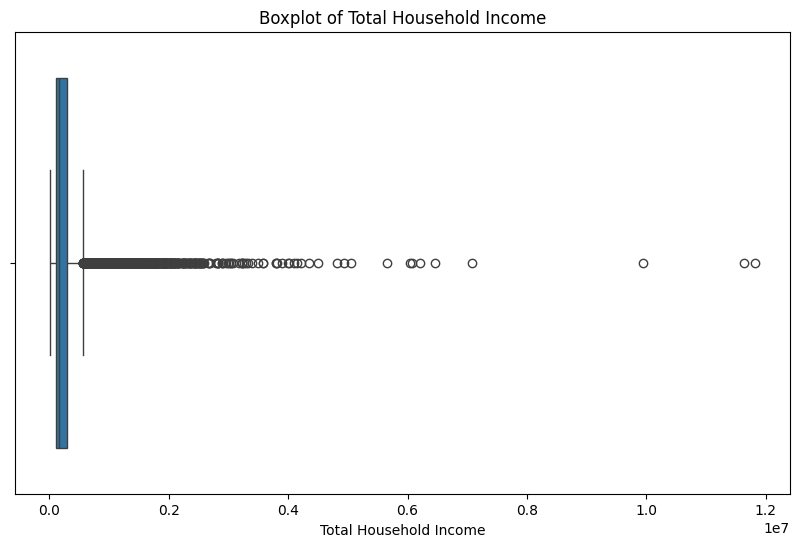

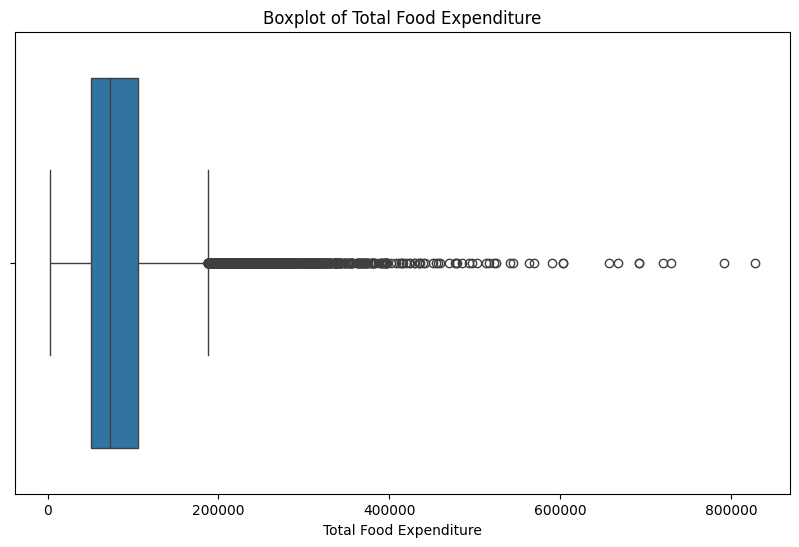

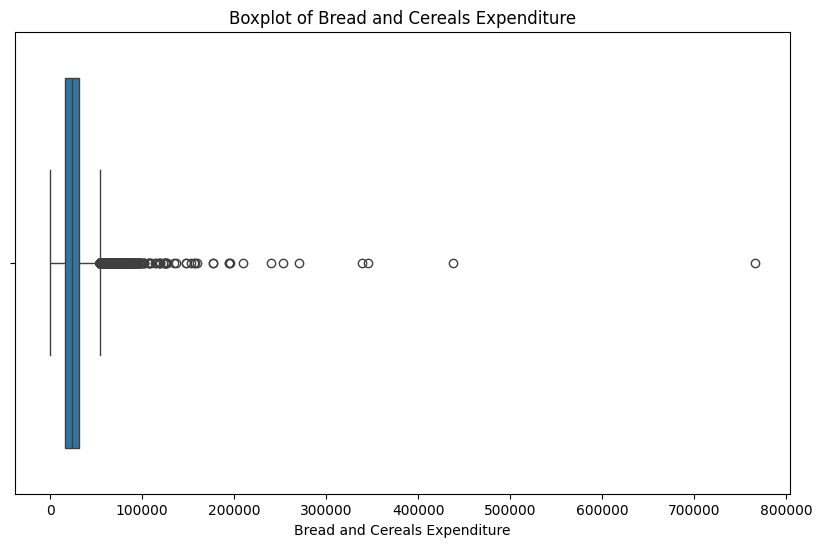

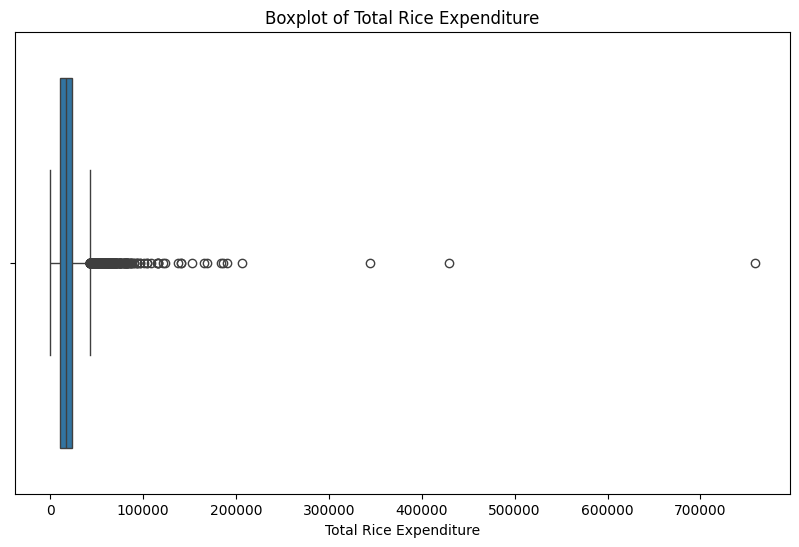

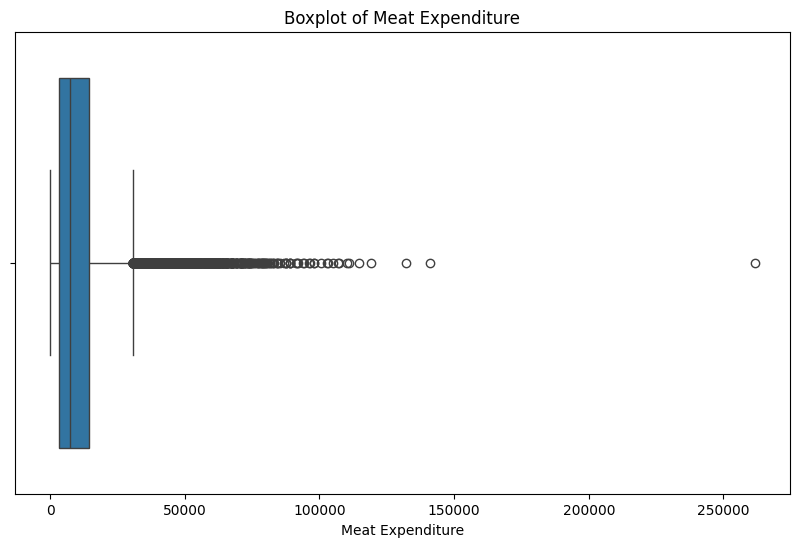

...

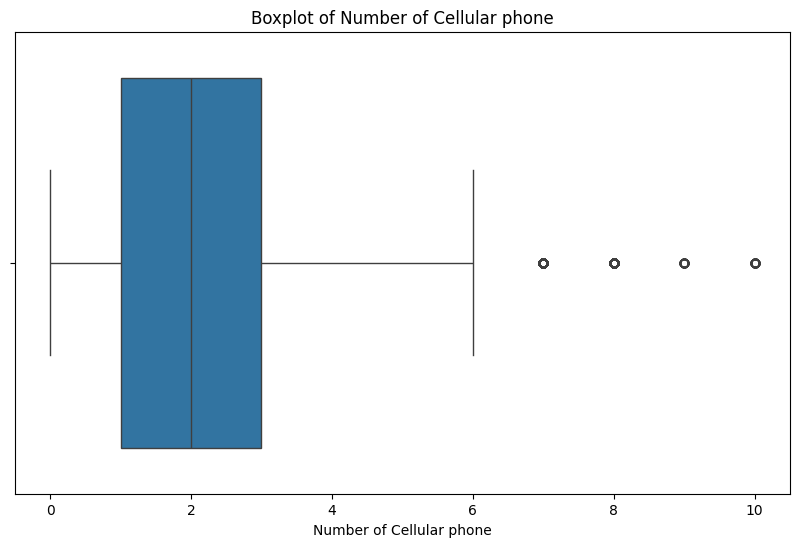

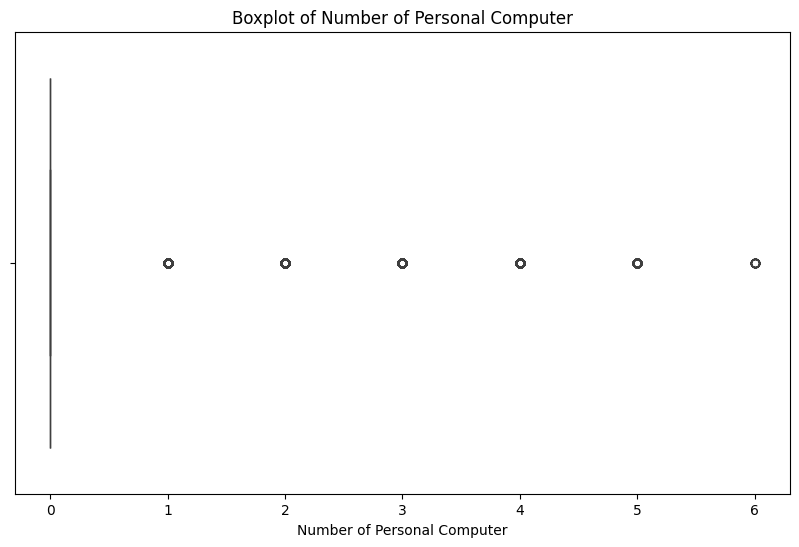

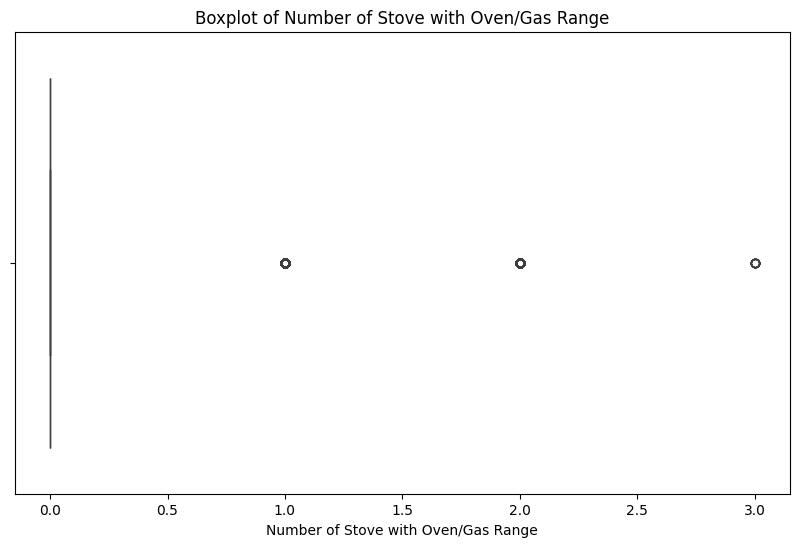

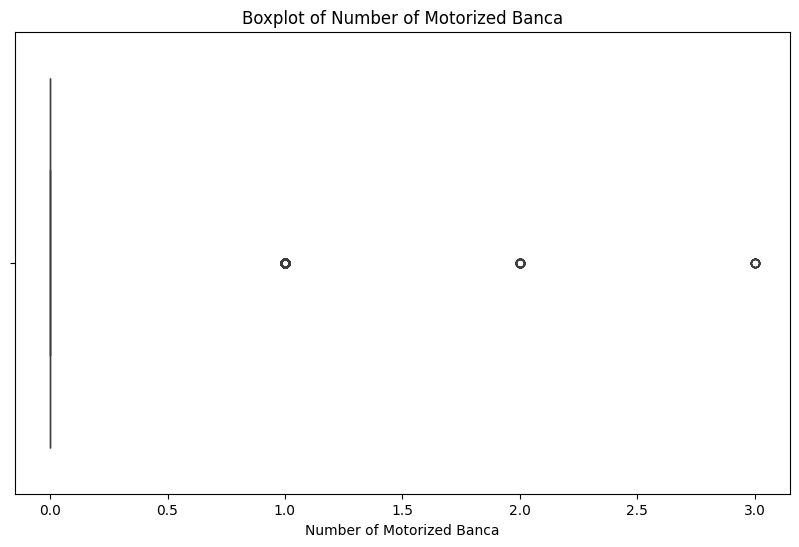

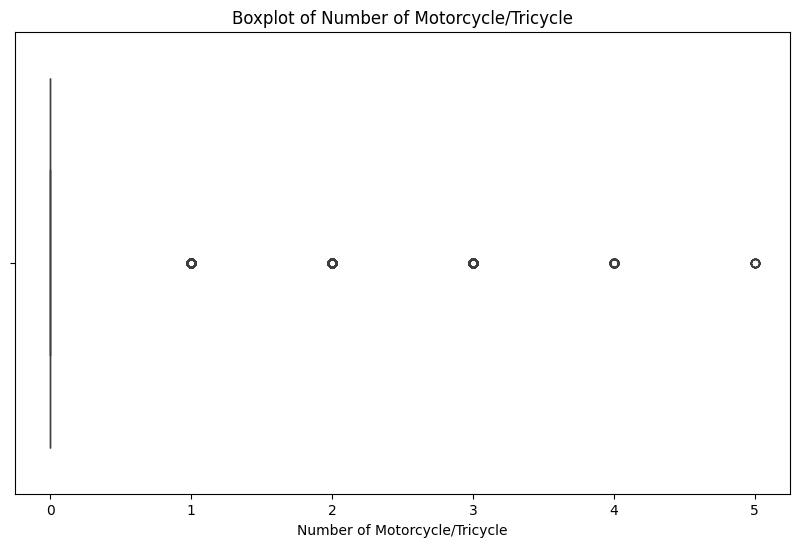

In [620]:
# Boxplot for Numerical Columns
for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot of {col}')
    plt.show()

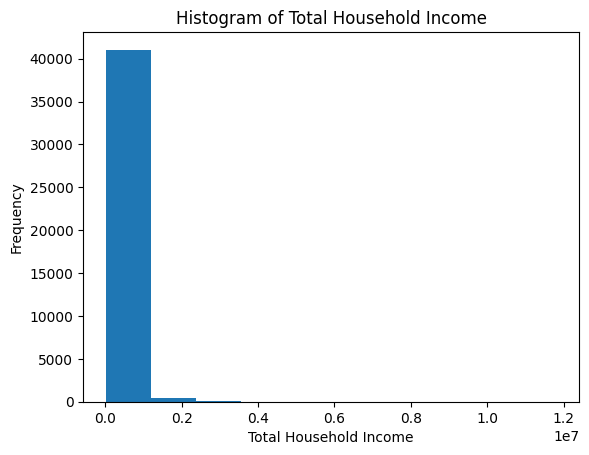

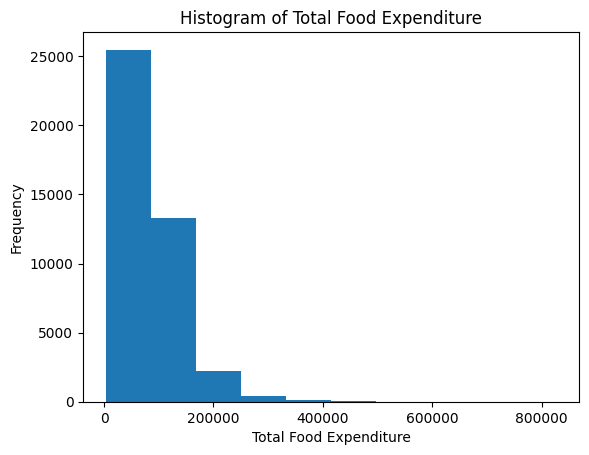

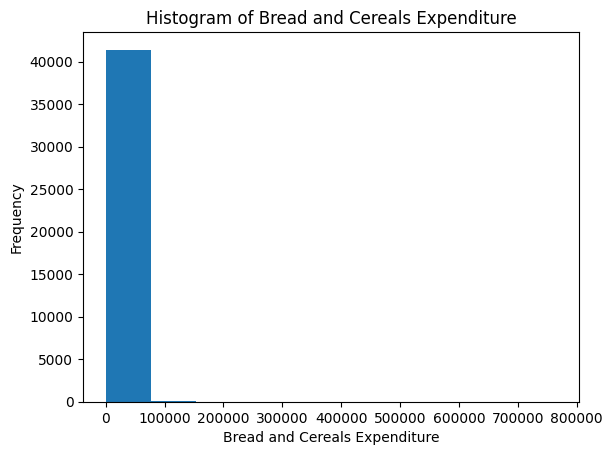

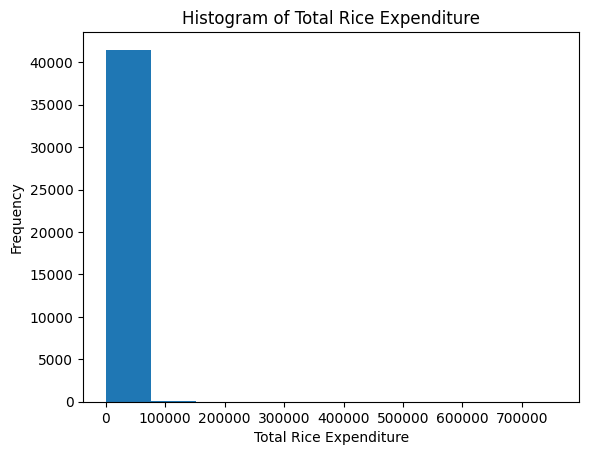

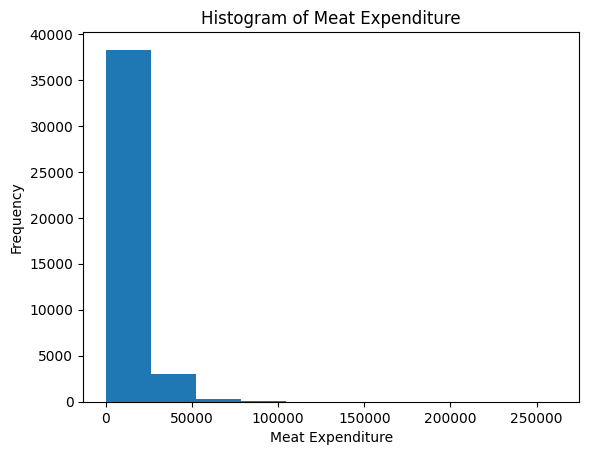

...

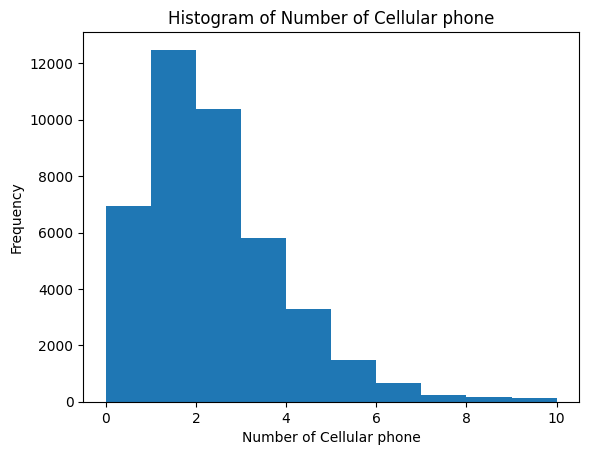

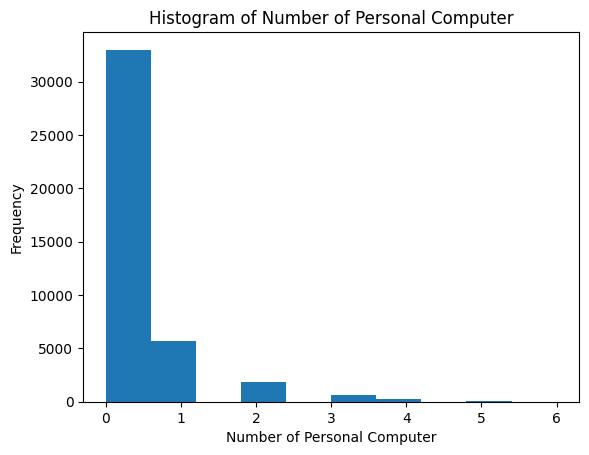

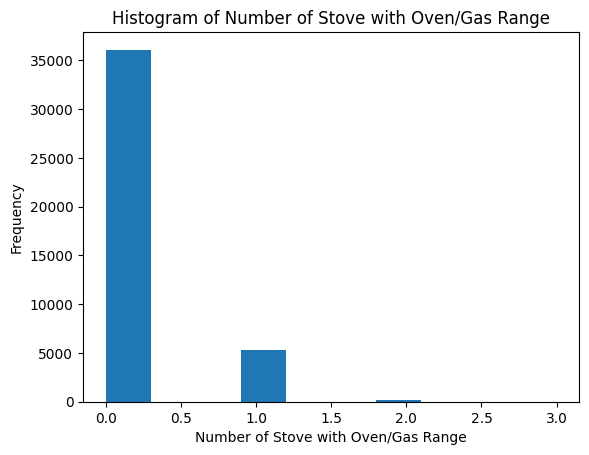

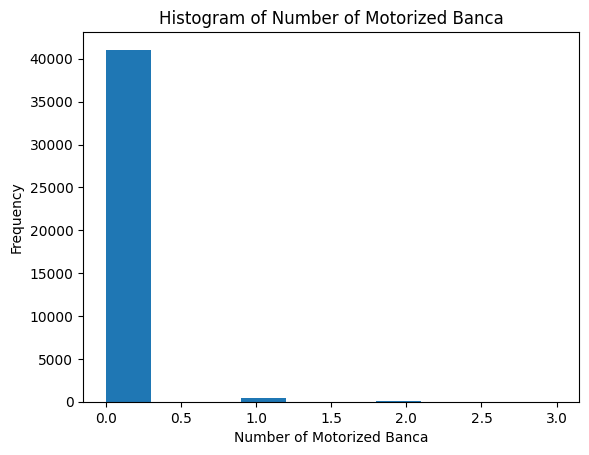

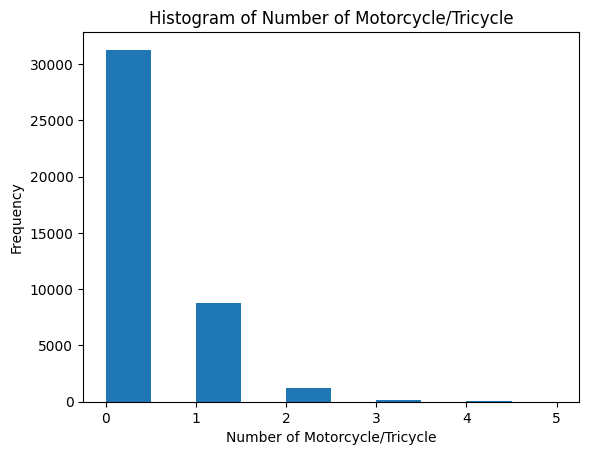

In [621]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [622]:
# Average Total Household Income per Region
average_income_per_region = df.groupby('Region')['Total Household Income'].mean().sort_values(ascending=False)
average_income_per_region

,Total Household Income
Region,
NCR,420861.861501
IVA - CALABARZON,303360.536040
III - Central Luzon,292965.181650
CAR,269540.484638
XI - Davao Region,238115.891251
I - Ilocos Region,238110.084327
II - Cagayan Valley,236778.221721
VII - Central Visayas,234909.314050
VI - Western Visayas,220481.260260


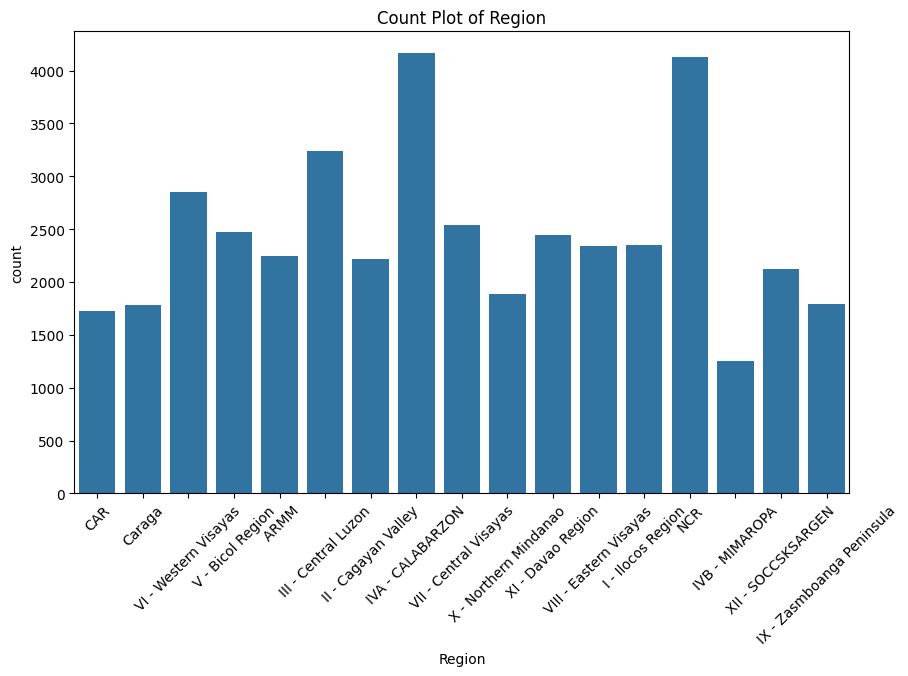

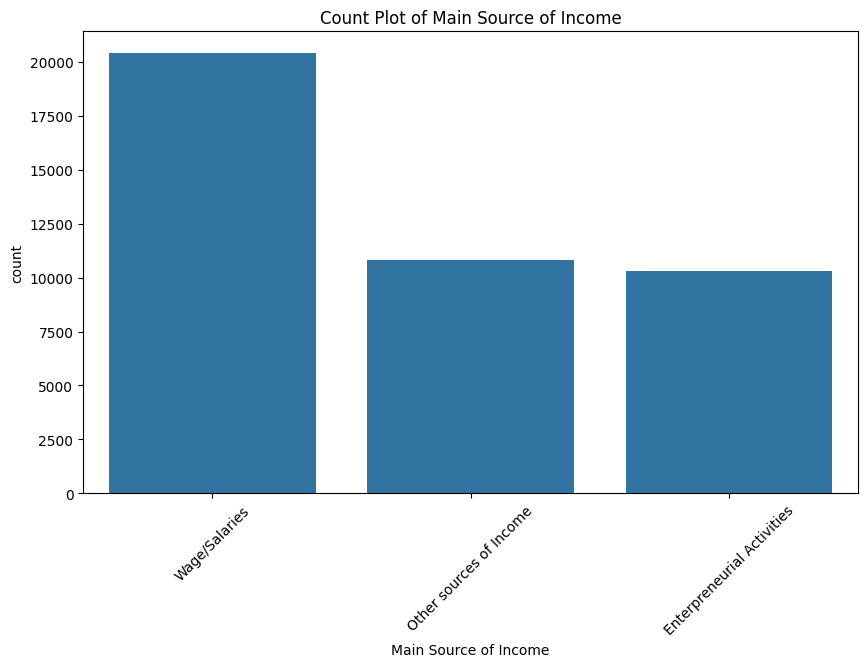

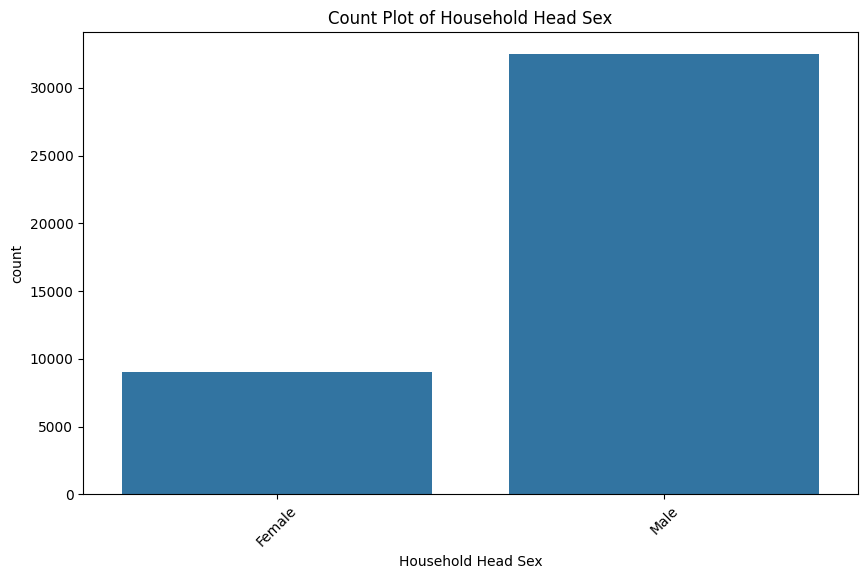

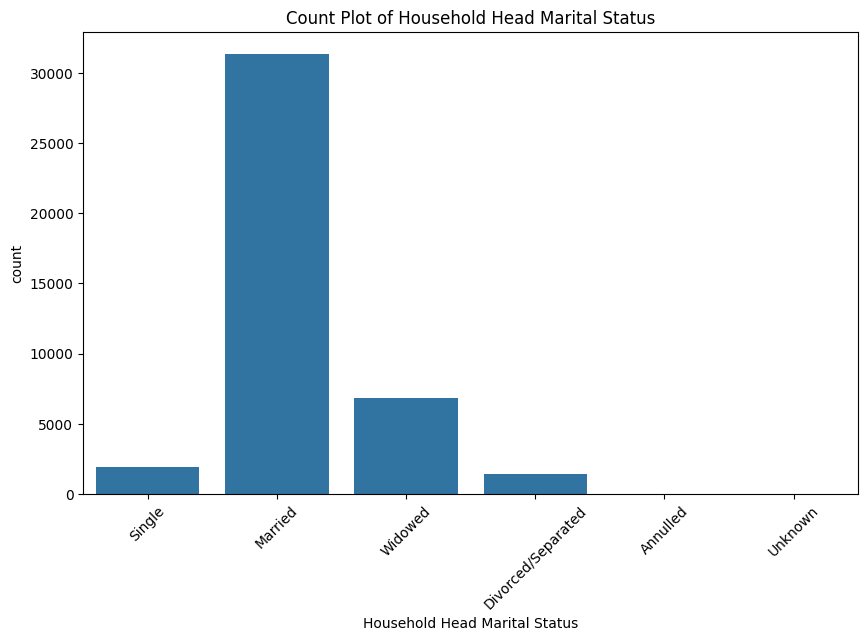

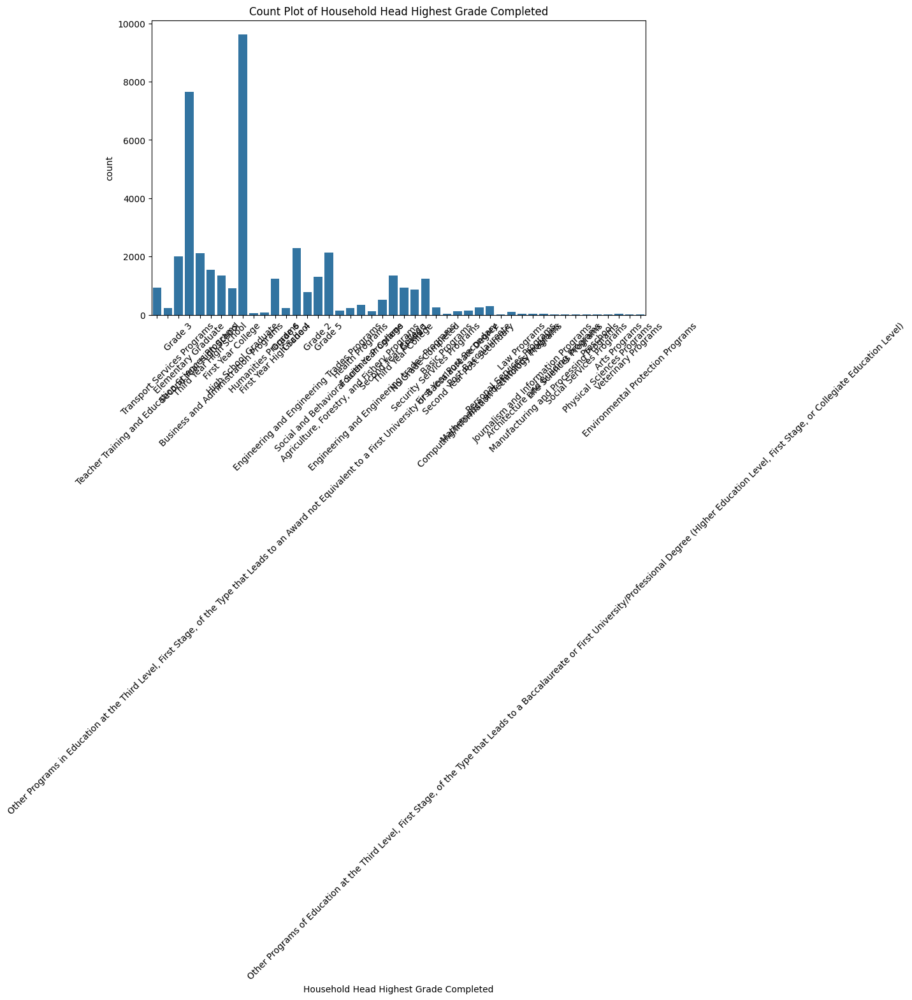

...

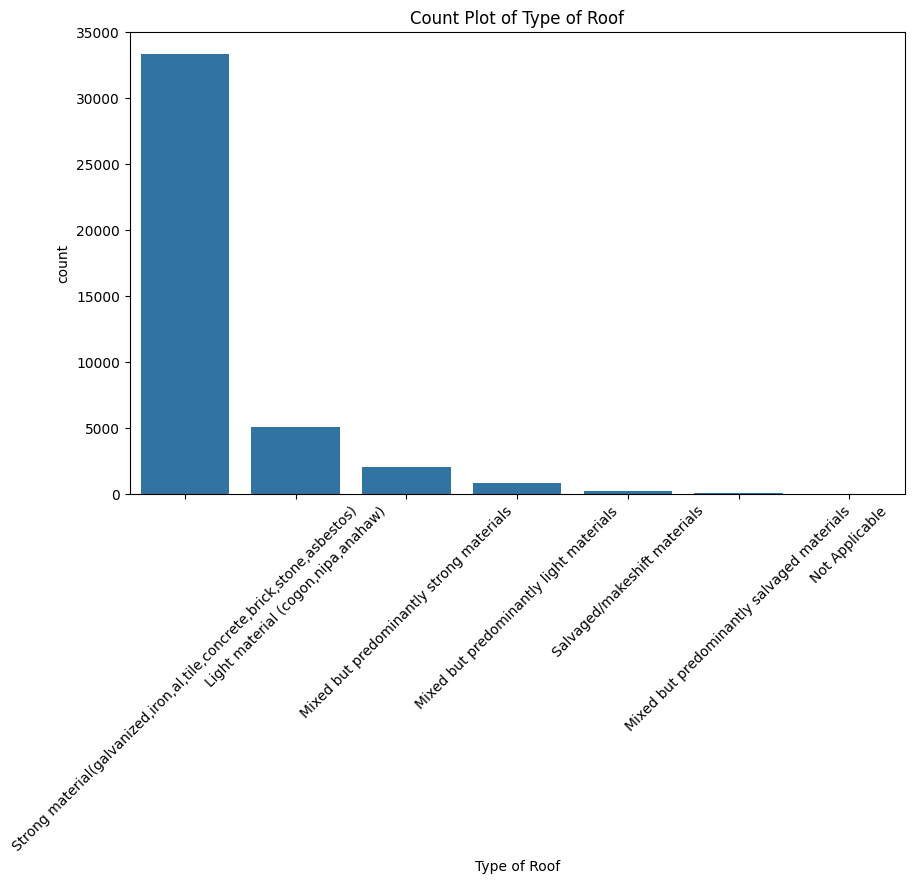

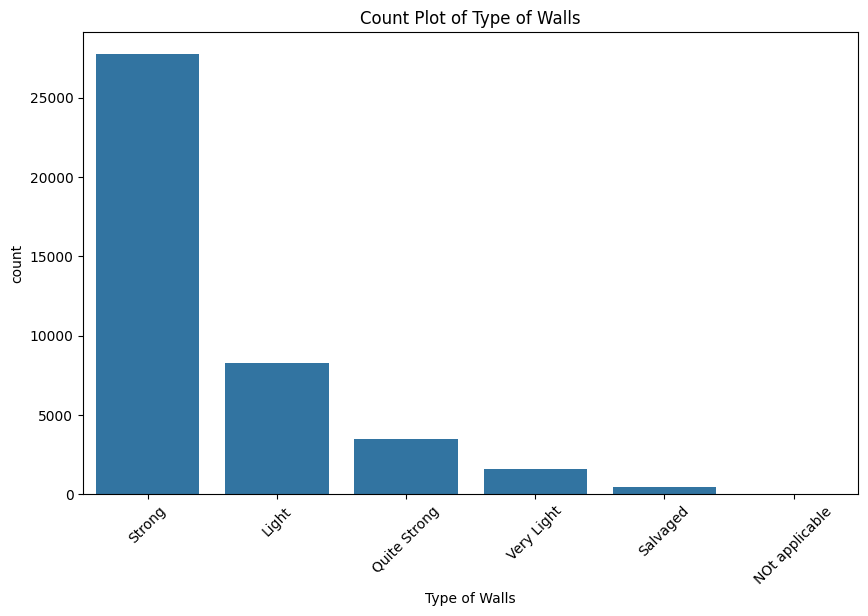

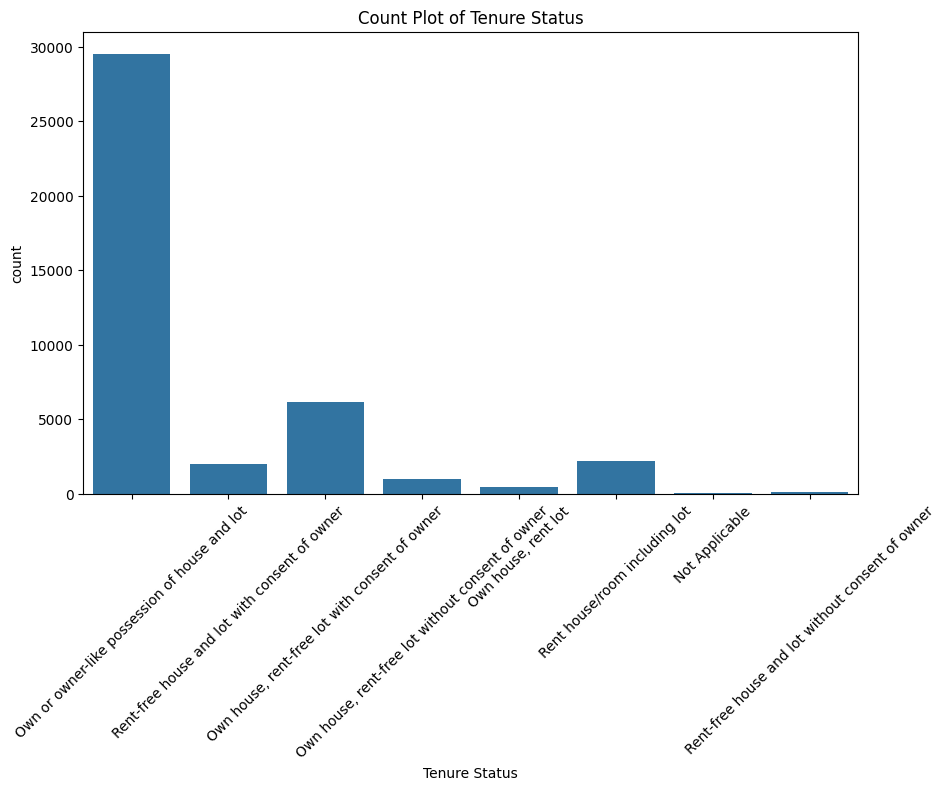

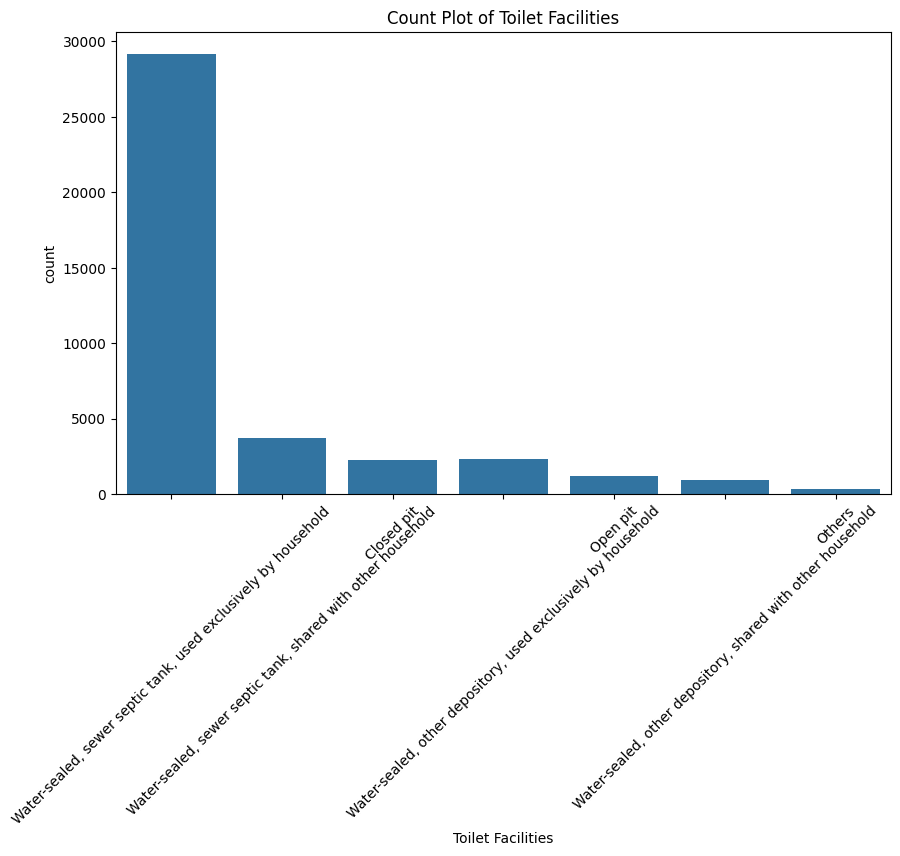

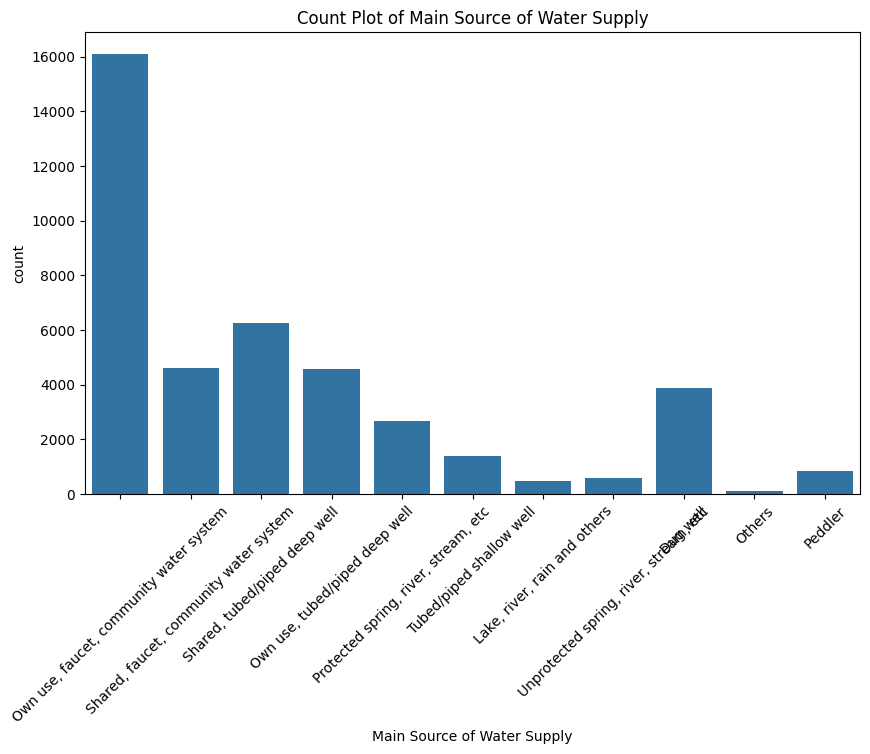

In [623]:
# Plot categorical columns. Tilt x values
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Count Plot of {col}')

In [624]:
# Unique Values of Null Columns : Household Head Occupation, Household Head Class of Worker, Toilet Facilities
null_columns = df.columns[df.isna().any()]
null_columns

Index(['Household Head Occupation', 'Household Head Class of Worker',
       'Toilet Facilities'],
      dtype='object')

In [625]:
# Print unique values for each null column
for column in null_columns:
    unique_values = df[column].unique()
    print(f"Unique values for {column}: {unique_values}")

Unique values for Household Head Occupation: ['General elementary education teaching professionals'
 'Transport conductors' 'Farmhands and laborers' 'Rice farmers'
 'General managers/managing proprietors in transportation, storage and communications'
 'Heavy truck and lorry drivers' nan 'Hog raising farmers'
 'Vegetable farmers'
 'General managers/managing proprietors in wholesale and retail trade'
 'Stocks clerks' 'Justices' 'Other social science professionals'
 'Protective services workers n. e. c.' 'Secretaries'
 'Electronics mechanics and servicers' 'Foresters and related scientists'
 'Shop salespersons and demonstrators'
 'College, university and higher education teaching professionals'
 'General managers/managing proprietors of restaurants and hotels'
 'Welders and flamecutters' 'Car, taxi and van drivers'
 'Motor vehicle mechanics and related trades workers'
 'Traditional chiefs and heads of villages' 'Motorcycle drivers'
 'Statistical, mathematical and related associate profess

In [626]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
Farmhands and laborers,3478
Rice farmers,2849
General managers/managing proprietors in wholesale and retail trade,2028
"General managers/managing proprietors in transportation, storage and communications",1932
Corn farmers,1724
...,...
Petroleum and natural gas refining plant operators,1
Builders (traditional materials),1
"Personal care and related workers, n. e. c.",1


In [627]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
High School Graduate,9628
Elementary Graduate,7640
Grade 4,2282
Grade 5,2123
Second Year High School,2104
Grade 3,1994
Third Year High School,1545
Business and Administration Programs,1344
Second Year College,1343


In [628]:
df['Household Head Class of Worker'].value_counts()

,count
Household Head Class of Worker,
Self-employed wihout any employee,13766
Worked for private establishment,13731
Worked for government/government corporation,2820
Employer in own family-operated farm or business,2581
Worked for private household,811
Worked without pay in own family-operated farm or business,285
Worked with pay in own family-operated farm or business,14


In [629]:
# Regions of Rows with Null Columns
df[df['Household Head Occupation'].isna()]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [630]:
df[df['Household Head Class of Worker'].isna()]['Region'].value_counts() #7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [631]:
# Regions of Rows with Null 'Household Head Occupation' and 'Household Head Class of Worker'
df[(df['Household Head Occupation'].isna()) & (df['Household Head Class of Worker'].isna())]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [632]:
df[df['Toilet Facilities'].isna()]['Region'].value_counts() # 1580 Null Values

,count
Region,
V - Bicol Region,277
VI - Western Visayas,224
VIII - Eastern Visayas,210
VII - Central Visayas,193
ARMM,144
IVA - CALABARZON,112
XII - SOCCSKSARGEN,86
IVB - MIMAROPA,76
Caraga,74


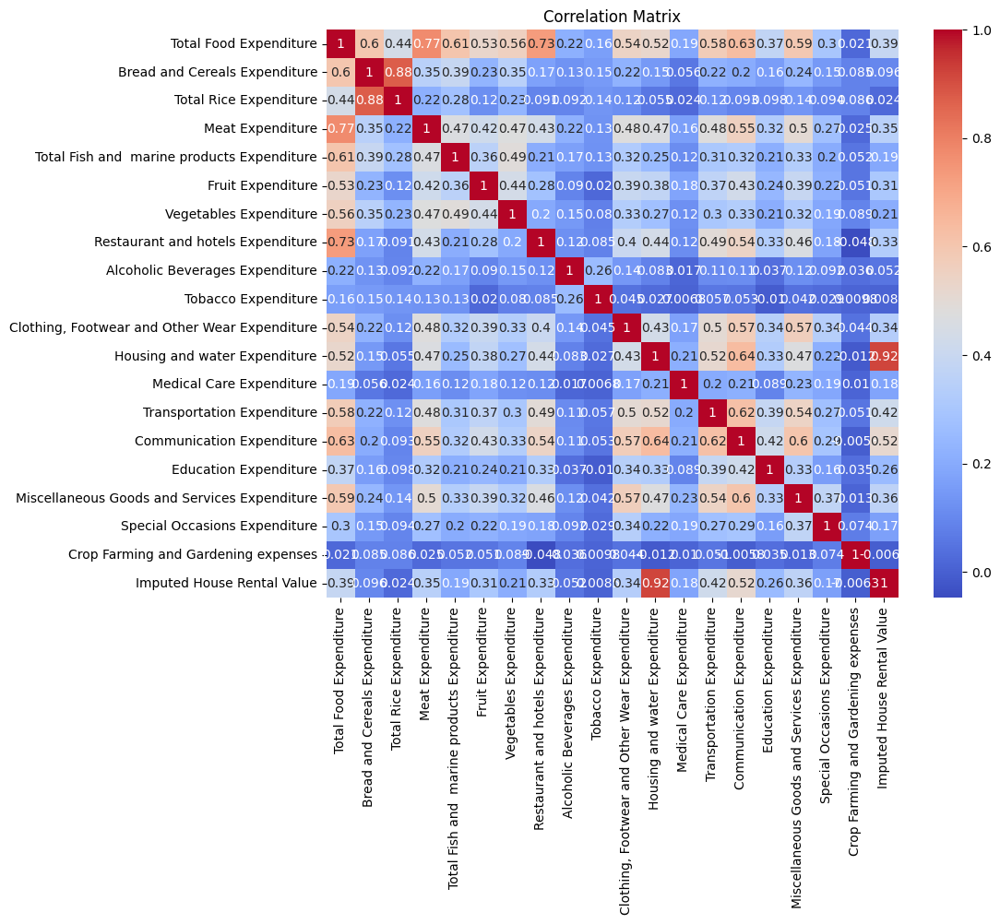

In [633]:
# Plot Correlation Matrix for Numerical Values
plt.figure(figsize=(10, 8))
sns.heatmap(df[expenditure_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Feature Engineering

In [634]:
# Get Unaccounted Bread and Cereals Expenditure by Subtracting Total Rice Expenditure from Bread and Cereals Expenditure
df['Other Bread and Cereals Expenditure'] = df['Bread and Cereals Expenditure'] - df['Total Rice Expenditure']

In [635]:
# Get Unaccounted Housing and water Expenditure
df['Unaccounted Housing and water Expenditure'] = df['Housing and water Expenditure'] - df['Imputed House Rental Value']

In [636]:
# Include Other Bread and Cereals Expenditure
expenditure_columns = np.append(expenditure_columns, 'Other Bread and Cereals Expenditure')

In [637]:
# Include Unaccounted Housing and water Expenditure
expenditure_columns = np.append(expenditure_columns, 'Unaccounted Housing and water Expenditure')

In [638]:
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure',
       'Unaccounted Housing and water Expenditure'], dtype=object)

In [639]:
# Aggregate Essential Spending
essential_cols = ['Total Food Expenditure', 'Housing and water Expenditure',
                  'Medical Care Expenditure', 'Education Expenditure',
                  'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses']

df['Total_Essential_Spending'] = df[essential_cols].sum(axis=1)

In [640]:
# Aggregate Non-Essential Spending
non_essential_cols = [
    'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
    'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
    'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure'
]

df['Total_NonEssential_Spending'] = df[non_essential_cols].sum(axis=1)

In [641]:
df['Total Expenditure'] = df['Total_Essential_Spending'] + df['Total_NonEssential_Spending']

In [642]:
# Create Ratios to Normalize and Understand Expenditure Distribution per Household
ratio_list = []

In [643]:
# Food Ratios
df['Meat Ratio'] = df['Meat Expenditure'] / df['Total Food Expenditure']
df['Fish Ratio'] = df['Total Fish and  marine products Expenditure'] / df['Total Food Expenditure']
df['Fruit Ratio'] = df['Fruit Expenditure'] / df['Total Food Expenditure']
df['Vegetables Ratio'] = df['Vegetables Expenditure'] / df['Total Food Expenditure']
df['Bread and Cereals Ratio'] = df['Bread and Cereals Expenditure'] / df['Total Food Expenditure']
df['Rice Ratio'] = df['Total Rice Expenditure'] / df['Total Food Expenditure']
df['Other Bread and Cereals Ratio'] = df['Other Bread and Cereals Expenditure'] / df['Total Food Expenditure']

In [644]:
ratio_list.append('Meat Ratio')
ratio_list.append('Fish Ratio')
ratio_list.append('Fruit Ratio')
ratio_list.append('Vegetables Ratio')
ratio_list.append('Bread and Cereals Ratio')
ratio_list.append('Rice Ratio')
ratio_list.append('Other Food Ratio')

In [645]:
# Non-Food Ratios to Total Expenditure
df['Food Ratio'] = df['Total Food Expenditure'] / df['Total Expenditure']
df['Housing and water Ratio'] = df['Housing and water Expenditure'] / df['Total Expenditure']
df['Alcoholic Beverages Ratio'] = df['Alcoholic Beverages Expenditure'] / df['Total Expenditure']
df['Tobacco Ratio'] = df['Tobacco Expenditure'] / df['Total Expenditure']
df['Clothing and Footwear Ratio'] = df['Clothing, Footwear and Other Wear Expenditure'] / df['Total Expenditure']
df['Miscellaneous Goods and Services Ratio'] = df['Miscellaneous Goods and Services Expenditure'] / df['Total Expenditure']
df['Special Occasions Ratio'] = df['Special Occasions Expenditure'] / df['Total Expenditure']
df['Restaurant and hotels Ratio'] = df['Restaurant and hotels Expenditure'] / df['Total Expenditure']
df['Crop Farming and Gardening Ratio'] = df['Crop Farming and Gardening expenses'] / df['Total Expenditure']
df['Medical Care Ratio'] = df['Medical Care Expenditure'] / df['Total Expenditure']
df['Education Ratio'] = df['Education Expenditure'] / df['Total Expenditure']
df['Communication Ratio'] = df['Communication Expenditure'] / df['Total Expenditure']
df['Transportation Ratio'] = df['Transportation Expenditure'] / df['Total Expenditure']
df['House Rental Ratio'] = df['Imputed House Rental Value'] / df['Total Expenditure']
df['Unaccounted Housing and water Expenditure Ratio'] = df['Unaccounted Housing and water Expenditure'] / df['Total Expenditure']

In [646]:
ratio_list.append('Food Ratio')
ratio_list.append('Housing and water Ratio')
ratio_list.append('Alcoholic Beverages Ratio')
ratio_list.append('Tobacco Ratio')
ratio_list.append('Clothing and Footwear Ratio')
ratio_list.append('Miscellaneous Goods and Services Ratio')
ratio_list.append('Special Occasions Ratio')
ratio_list.append('Restaurant and hotels Ratio')
ratio_list.append('Crop Farming and Gardening Ratio')
ratio_list.append('Medical Care Ratio')
ratio_list.append('Education Ratio')
ratio_list.append('Communication Ratio')
ratio_list.append('Transportation Ratio')
ratio_list.append('House Rental Ratio')
ratio_list.append('Unaccounted Housing and water Expenditure Ratio')

In [647]:
# Aggregate Non-Food Spending
non_food_expenditure_cols = ['Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                             'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                             'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure',
                             'Restaurant and hotels Expenditure', 'Crop Farming and Gardening expenses',
                             'Medical Care Expenditure', 'Education Expenditure',
                             'Communication Expenditure', 'Transportation Expenditure']

df['Total_NonFood_Spending'] = df[non_food_expenditure_cols].sum(axis=1)

In [648]:
specific_food_expenditure_cols = ['Bread and Cereals Expenditure', 'Other Bread and Cereals Expenditure', 'Total Rice Expenditure', 'Meat Expenditure',
                                  'Total Fish and  marine products Expenditure', 'Fruit Expenditure', 'Vegetables Expenditure']

In [649]:
# Income minus Expenditure
df['Diff_Income_Expenditure'] = df['Total Household Income'] - df['Total Expenditure']

In [650]:
# Count rows where Diff_Income Expenditures > 0
df[df['Diff_Income_Expenditure'] > 0].shape

(24952, 89)

In [651]:
# Create Remaining_Income column where Diff_Income_Expenditure is greater than 0, else 0
df['Remaining_Income'] = np.where(df['Diff_Income_Expenditure'] > 0, df['Diff_Income_Expenditure'], 0)

In [652]:
df['Remaining_Income_Ratio'] = df['Remaining_Income'] / df['Total Household Income']
df['Entrepreneurial Income Ratio'] = df['Total Income from Entrepreneurial Acitivites'] / df['Total Household Income']

In [653]:
# Create Amount_Outside_Income where Diff_Income_Expenditure is less than 0, else 0
df['Amount_Outside_Income'] = np.where(df['Diff_Income_Expenditure'] < 0, df['Diff_Income_Expenditure'], 0)

In [654]:
# Convert to Positive Value 'Amount_Outside_Income'
df['Amount_Outside_Income'] = df['Amount_Outside_Income'].abs()

In [655]:
df['Amount_Outside_Income_Ratio'] = df['Amount_Outside_Income'] / df['Total Expenditure']
df['Expenditure to Income Ratio'] = df['Total Expenditure'] / df['Total Household Income']

In [656]:
ratio_list.append('Remaining_Income_Ratio')
ratio_list.append('Entrepreneurial Income Ratio')
ratio_list.append('Amount_Outside_Income_Ratio')
ratio_list.append('Expenditure to Income Ratio')

In [657]:
# Drop Diff_Income_Expenditure
df.drop(columns=['Diff_Income_Expenditure'], inplace=True)

In [658]:
# Add Essential and Non-Essential Spending to expenditure columns
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonEssential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonFood_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total Expenditure')
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure',
       'Unaccounted Housing and water Expenditure',
       'Total_Essential_Spending', 'Total_NonEssential_Spending',
       'Total_NonFood_Spending', 'Total Expenditure'], dtype=object)

In [659]:
# Add Newly Created Income Columns to Income Columns
income_columns = np.append(income_columns, 'Remaining_Income')
income_columns = np.append(income_columns, 'Amount_Outside_Income')
income_columns

array(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Remaining_Income',
       'Amount_Outside_Income'], dtype=object)

In [660]:
income_columns

array(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Remaining_Income',
       'Amount_Outside_Income'], dtype=object)

In [661]:
# Remove Raw Spending of Individidual Expenditure and Income Columns in Dataframe
df.drop(columns=expenditure_columns, inplace=True)
df.drop(columns=['Total Income from Entrepreneurial Acitivites', 'Remaining_Income', 'Amount_Outside_Income'], inplace=True)

In [662]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 65 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Total Household Income                           41544 non-null  int64  
 1   Region                                           41544 non-null  object 
 2   Main Source of Income                            41544 non-null  object 
 3   Agricultural Household indicator                 41544 non-null  int64  
 4   Household Head Sex                               41544 non-null  object 
 5   Household Head Age                               41544 non-null  int64  
 6   Household Head Marital Status                    41544 non-null  object 
 7   Household Head Highest Grade Completed           41544 non-null  object 
 8   Household Head Job or Business Indicator         41544 non-null  object 
 9   Household Head Occupation   

In [663]:
essential_household_assets = ['Number of Refrigerator/Freezer',
                'Number of Stove with Oven/Gas Range',
                'Number of Washing Machine']

communication_and_connectivity_assets = ['Number of Cellular phone',
                 'Number of Landline/wireless telephones', 'Number of Personal Computer']

transporation_assets = ['Number of Car, Jeep, Van', 'Number of Motorcycle/Tricycle', 'Number of Motorized Banca']

entertainment_and_leisure_assets = ['Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set']

In [664]:
# Create Different Asset Counts columns based on the listed assets
df['Essential_Household_Assets'] = df[essential_household_assets].sum(axis=1)
df['Communication_and_Connectivity_Assets'] = df[communication_and_connectivity_assets].sum(axis=1)
df['Transporation_Assets'] = df[transporation_assets].sum(axis=1)
df['Entertainment_and_Leisure_Assets'] = df[entertainment_and_leisure_assets].sum(axis=1)

In [665]:
# Create binary indicator if a household has an Air conditioner based on Number of Airconditioner
df['Has_Air_Conditioner'] = np.where(df['Number of Airconditioner'] > 0, 1, 0)

In [666]:
# Compile in one List all created assets columns
household_assets = ['Essential_Household_Assets', 'Communication_and_Connectivity_Assets', 'Transporation_Assets', 'Entertainment_and_Leisure_Assets', 'Has_Air_Conditioner']

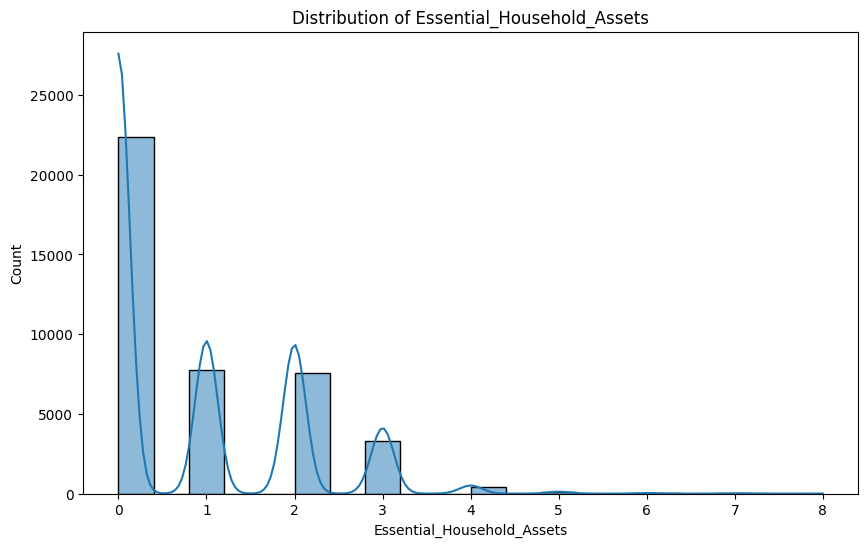

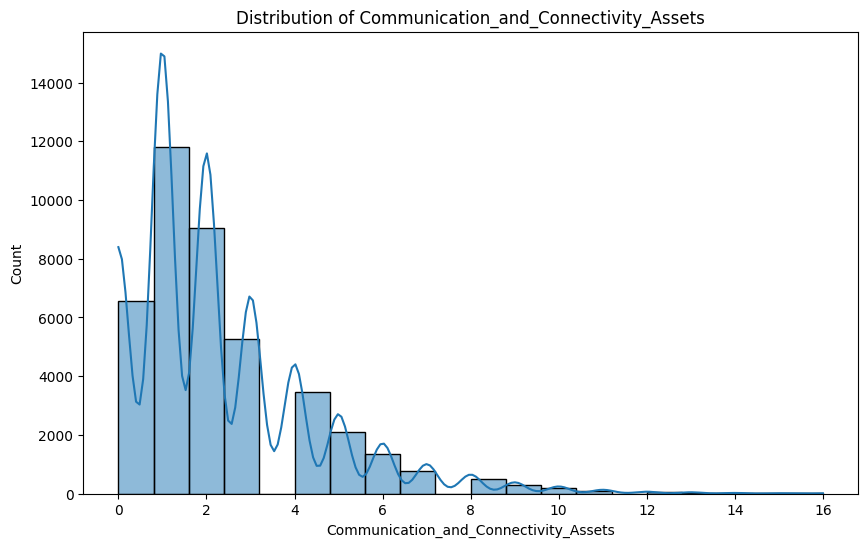

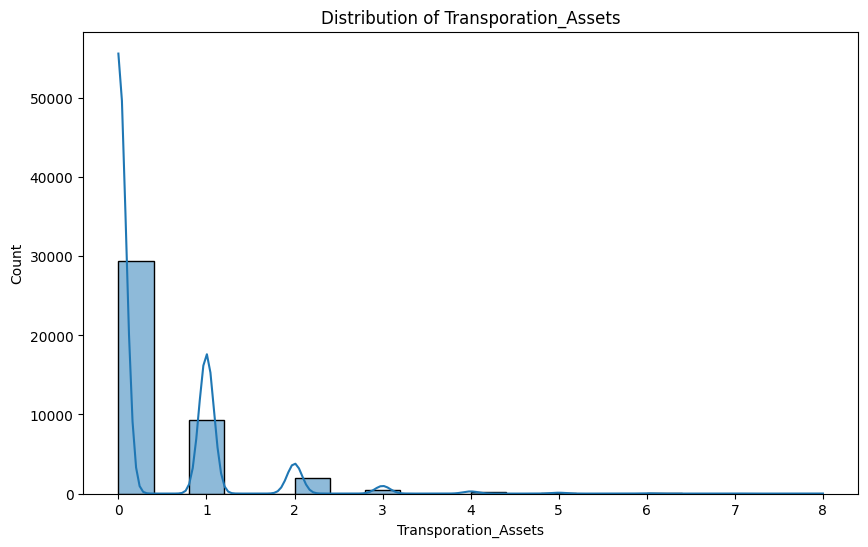

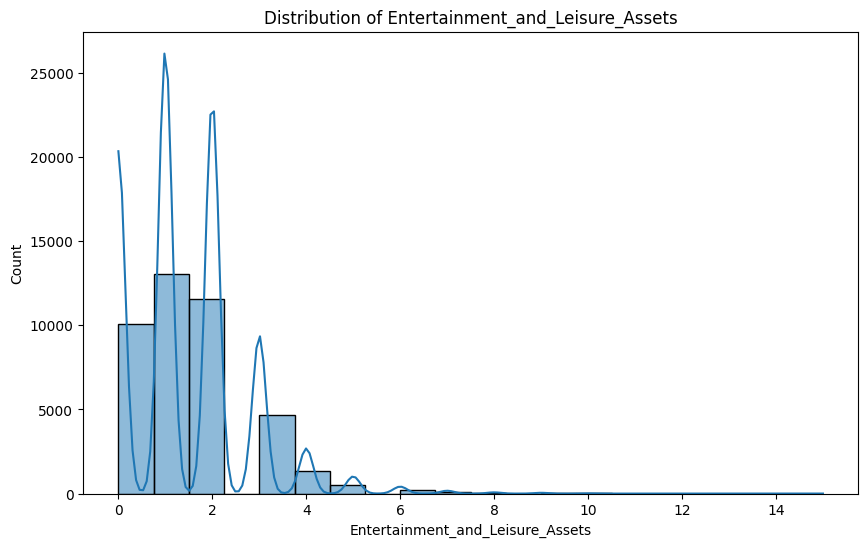

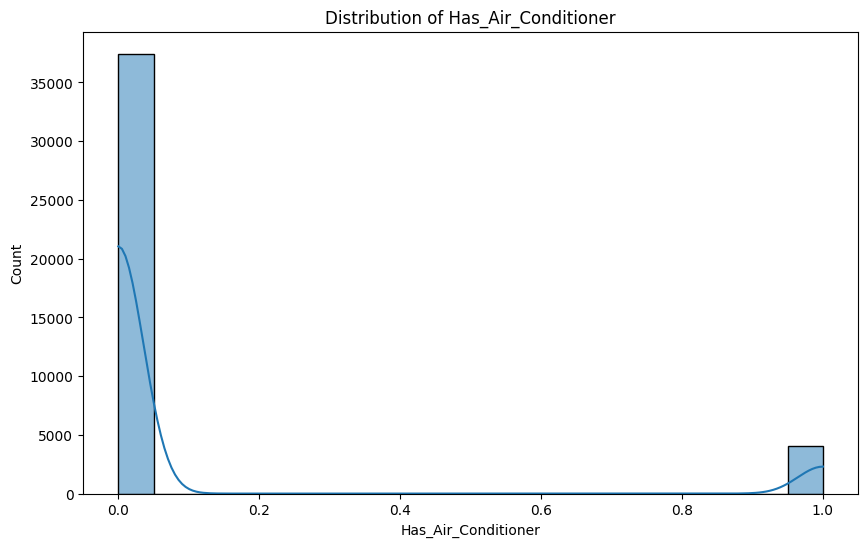

In [667]:
# Plot all columns in household_assets, individually
for col in household_assets:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)

In [668]:
# Capture number of unemployed people
df['Number of Unemployed'] = df['Total Number of Family members'] - df['Total number of family members employed']

In [669]:
# If Number of Unemployed is Negative, change it to 0
df['Number of Unemployed'] = df['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)

In [670]:
# Capture number of Kids
df['Number of Kids'] = df['Members with age less than 5 year old'] + df['Members with age 5 - 17 years old']

In [671]:
# Capture number of dependencies
df['Number of Dependencies'] = df['Number of Kids'] + df['Number of Unemployed']

In [672]:
# Refresh numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
numerical_columns

Index(['Total Household Income', 'Agricultural Household indicator',
       'Household Head Age', 'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'House Floor Area',
       'House Age', 'Number of bedrooms', 'Electricity',
       'Number of Television', 'Number of CD/VCD/DVD',
       'Number of Component/Stereo set', 'Number of Refrigerator/Freezer',
       'Number of Washing Machine', 'Number of Airconditioner',
       'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones',
       'Number of Cellular phone', 'Number of Personal Computer',
       'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca',
       'Number of Motorcycle/Tricycle', 'Meat Ratio', 'Fish Ratio',
       'Fruit Ratio', 'Vegetables Ratio', 'Bread and Cereals Ratio',
       'Rice Ratio', 'Other Bread and Cereals Ratio', 'Food Ratio',
       'Housing and water Ratio'

In [673]:
# Remove Electricity and Agricultural Household Indicator
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Electricity'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [674]:
# Fill Null Columns with 'Unknown'
df[null_columns] = df[null_columns].fillna('Unknown')

In [675]:
# Dictionary to map occupations to industry sectors
industry_categories = {
    "Managers":[
        'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors of restaurants and hotels', 'Traditional chiefs and heads of villages', 'General managers/managing proprietors in manufacturing', 'General managers/managing proprietors n. e. c.', 'Production and operations managers in agriculture, hunting, forestry and fishery', 'School supervisors and principals', 'General managers/managing proprietors of business services', 'School principals', 'Government administrators (including career executive service officers)', 'Production supervisors and general foremen', 'Production and operations managers in restaurant and hotels', 'General managers/managing proprietors in agriculture, hunting, forestry and fishing', 'General managers/managing proprietors in personal care, cleaning and relative services', 'Directors and chief executives of corporations', 'General managers/managing proprietors in construction', 'Personnel and industrial relations managers', 'Production and operations managers in transport, storage and communications', 'Sales and marketing managers', 'Production and operations managers in manufacturing', 'Research and development managers', 'Production and operations managers in personal care, cleaning and relative services', 'Other specialized managers', 'Production and operations managers in wholesale and retail trade', 'Staff officers', 'Finance and administration managers', 'Commanding officers', 'Production and operations managers in construction', 'Senior officials of humanitarian and other special-interest organizations', 'Production and operations managers in business services', 'Supply and distribution managers', 'Officers, n. e. c.', 'Advertising and public relations managers'
    ],
    "Professionals":[
        'General elementary education teaching professionals', 'Justices', 'Other social science professionals', 'Foresters and related scientists', 'College, university and higher education teaching professionals', 'Legislative officials', 'Medical technologists', 'Civil engineers', 'Religious professionals', 'General secondary education teaching professionals', 'Vocational education teaching professionals', 'Choreographers and dancers', 'Accountants and auditors', 'Mechanical engineers', 'Agronomists and related scientists', 'Other computer professionals', 'Professional nurses', 'Professional, technical and related officers', 'Athletes and related workers', 'Decorators and commercial designers', 'Computer programmers', 'Pharmacists', 'Architects', 'Nutritionists-dietitians', 'Professional midwives', 'Street, nightclub and related musicians, singers and dancers', 'Electrical Engineers', 'Computer engineers and related professionals', 'Other business professionals', 'Economists', 'Chemists', 'Composers, musicians and singers', 'Photographers and image and sound recording equipment operators', 'Statisticians', 'Electronics and communications engineers', 'Fashion and other models', 'Personnel and human resource development professionals', 'Systems analysts and designers', 'Librarians, archivists and curators', 'Town planners and related professionals', 'Education methods specialists', 'Sculptors, painters and related artists', 'Medical doctors', 'Industrial engineers', 'Lawyers', 'Dentists', 'Pre-elementary education teaching professionals', 'Social work professionals', 'Technical and vocational instructors/trainors', 'Radio, television and other announcers', 'Other health professionals (except nursing)', 'Nonformal education teaching professionals other than technical and vocational trainors/instructors', 'Authors, journalists and other writers', 'Chemical engineers', 'Science and mathematics teaching professionals', 'Science and mathematics elementary education teaching professionals', 'Geodetic engineers and related professionals', 'Other creative or performing artists', 'Other teaching professionals', 'Other engineers and related professionals', 'Physiotherapists', 'Optometrists and opticians', 'Veterinarians'
    ],
    "Technicians and associate professionals" : [
        'Statistical, mathematical and related associate professionals', 'Social work associate professionals', 'Mechanical engineering technicians', 'Statistical and finance clerks', 'Non-ordained religious associate professionals', 'Other administrative associate professionals', 'Bookkeepers', 'Midwifery associate professionals', 'Safety, health and quality inspectors (vehicles, processes and products)', 'Veterinary assistants', 'Administrative secretaries and related associate professionals', 'Teaching associate professionals', 'Mining and metallurgical engineering technicians', 'Draftsmen', 'Other life science technicians', 'Legal and related business associate professionals', 'Farm technicians', 'Civil engineering technicians', 'Other health associate professionals (except nursing)', 'Medical assistants', 'Electronics and communications engineering technicians', 'Ship and aircraft controllers and technicians', 'Air traffic safety technicians', 'Other physical science and engineering technicians', 'Building and fire inspectors', 'Dental assistants', 'Other government associate professionals', 'Other finance and sales associate professionals', 'Life science technicians', 'Pharmaceutical assistants', 'Medical equipment operators', 'Nursing associate professionals', 'Electrical engineering technicians'
    ],
    "Clerical support workers" : [
        'Stocks clerks', 'Secretaries', 'Other office clerks', 'Tellers and other counter clerks', 'Accounting and bookkeeping clerks', 'Data entry operators', 'Transport clerks', 'Library and filing clerks', 'Receptionists and information clerks', 'Government tax and excise officials', 'Mail carriers and sorting clerks', 'Word processor and related operators', 'Production clerks', 'Customs and immigration inspectors', 'Government licensing officials', 'Stenographers and typists', 'Computer assistants', 'Coding, proof-reading and related clerks', 'Telephone switchboard operators', 'Government social benefits officials'
    ],
    "Service and sales workers" : [
        'Transport conductors', 'Protective services workers n. e. c.', 'Shop salespersons and demonstrators', 'Door-to-door and telephone salespersons', 'Police inspectors and detectives', 'Prison guards', 'Street ambulant vendors', 'Other supervisors, n. e. c.', 'Doorkeepers, watchpersons and related workers', 'Waiters, waitresses and bartenders', 'Child care workers', 'Police officers', 'Bet bookmakers and croupiers', 'Institution-based personal care workers', 'Market and sidewalk stall vendors', 'Debt collectors and related workers', 'Pawnbrokers and money lenders', 'Stall and market salespersons', 'Firefighters', 'Undertakers and embalmers', 'Hairdressers, barbers, beauticians and related workers', 'Cashiers and ticket clerks', 'Personal care and related workers, n. e. c.', 'Labor contractors and employment agents', 'Transport and communications service supervisors n. e. c.', 'Estate agents', 'Technical and commercial sales representatives', 'Housekeepers and related workers', 'Appraisers and valuers', 'Insurance representatives', 'Other personal services workers, n. e. c.', 'Sales supervisors in retail trade', 'Home-based personal care workers', 'Buyers', 'Faith healers', 'Travel consultants and organizers', 'Air transport service supervisors', 'Companions and valets', 'Travel guides', 'Trade brokers', 'Sales supervisors in wholesale trade', 'Other sales supervisors', 'Postal service supervisors', 'Maritime transport service supervisors', 'Service and related workers', 'Other business services and trade brokers'
    ],
    "Skilled agricultural, forestry and fishery workers" : [
        'Rice farmers', 'Hog raising farmers', 'Vegetable farmers', 'Inland and coastal waters fishermen', 'Corn farmers', 'Coconut farmers', 'Root crops farmers', 'Fruit tree farmers', 'Coffee and cacao farmers', 'Other orchard farmers', 'Duck raisers', 'Cotton and fiber crops farmers', 'Forest tree planters', 'Concessionaires and loggers', 'Minor forest products gatherers', 'Chicken farmers', 'Fish-farm cultivators (excluding prawns)', 'Ornamental plant growers', 'Cattle and dairy farmers', 'Other livestock farmers', 'Deep-sea fishermen', 'Other field crop farmers', 'Sugarcane farmers', 'Other poultry farmers', 'Field legumes farmers', 'Other plant growers', 'Seaweeds cultivators', 'Fishermen n. e. c.', 'Other animal raisers', 'Hunters and trappers', 'Other aqua products cultivators', 'Tree nut farmers'
    ],
    "Craft and related trades workers" : [
        'Electronics mechanics and servicers', 'Welders and flamecutters', 'Motor vehicle mechanics and related trades workers', 'Lineman, line installers and cable splicers', 'Carpenters and joiners', 'Masons and related concrete finishers', 'Painters and related workers', 'Cooks', 'Tailors, dressmakers and hatters', 'Wood and related products assemblers', 'Plumbers, pipe fitters and other related workers', 'Food preservers', 'Basketry weavers, brush makers and related workers', 'Wood products machine operators', 'Building and related electricians', 'Cabinet/furniture makers and related workers', 'Blacksmiths, hammersmiths, and forging-press workers', 'Butchers, fishmongers and related food preparers', 'Bakers, pastry cooks and confectionery makers', 'Rattan, bamboo and other wicker furniture makers', 'Sheet-metal workers', 'Handicraft workers in wood and related materials', 'Weavers, knitters and related workers', 'Traditional medicine practitioners', 'Silk-screen, block and textile printers', 'Varnishers and related painters', 'Structural-metal preparers, erectors and related workers', 'Sewers, Embroiderers and related workers', 'Electronic equipment assemblers', 'Textile, leather and related patternmakers and cutters', 'Roofers', 'Metal-wheel grinders, polishers and tool sharpeners', 'Electrical mechanics and fitters', 'Glass makers, cutters, grinders and finishers', 'Tool-makers and related workers', 'Riggers and cable splicers', 'Dairy products makers', 'Building frame and related trades workers n. e. c.', 'Mechanical machinery assemblers', 'Metal drawers and extruders', 'Floor layers and tile setters', 'Precision instrument makers and repairers', 'Compositors, typesetters and related workers', 'Electrical equipment assemblers', 'Metal, rubber and plastic products assemblers', 'Metal molders and coremakers', 'Marine craft mechanics', 'Bookbinders and related workers', 'Jewelry and precious metal workers', 'Musical instrument makers and tuners', 'Machine-tool setters and setter operators', 'Stone splitters, cutters and carvers', 'Photographic and related workers', 'Aircraft engine mechanics and fitters', 'Woodworking machine setters and setter-operators', 'Food and beverage tasters and graders', 'Pressman letterpresses and related workers', 'Shoemakers and related workers', 'Agricultural or industrial machinery mechanics and fitters', 'Upholsterers and related workers', 'Insulation workers', 'Machine tool operators', 'Technician, skilled, semi-skilled workers', 'Tobacco preparers and tobacco products makers', 'Paperboard, textile and related products assemblers', 'Telecommunication equipment installers and repairers', 'Business machines mechanics and repairers', 'Builders (traditional materials)', 'Electronics fitters', 'Potters and related clay and abrasive formers', 'Fiber preparers', 'Tanners', 'Wood treaters'
    ],
    "Plant and machine operators and assemblers" : [
        'Heavy truck and lorry drivers', 'Car, taxi and van drivers', 'Motorcycle drivers', "Ship's deck crews and related workers", "Ships' deck officers and pilots", 'Earth-moving and related plant operators', 'Motorized farm and forestry plant operators', 'Broadcasting and telecommunications equipment operators', 'Chemical processing plant operators n. e. c.', 'Wood processing plant operators', 'Fruit, vegetable and nut processing machine operators', 'Lifting truck operators', 'Photographic products machine operators', 'Mining-plant operators', 'Rubber products machine operators', 'Cement and other mineral products machine operators', 'Grain and spice milling machine operators', 'Computer equipment operators', 'Other machine operators and assemblers', 'Power production plant operators', 'Metal finishing, plating and coating machine operators', 'Automated assembly-line operators', 'Sugar production machine operators', 'Bus drivers', 'Meat and fish processing machine operators', 'Crane, hoist and related plant operators', 'Hand or pedal vehicle drivers', 'Metal melters, caster and rolling mill operators', 'Weaving and knitting machine operators', 'Incinerator, water treatment and related plant operators', 'Baked goods and cereal and chocolate products machine operators', 'Mineral ore and stone-processing plant operators', 'Brewers and wine and other beverage machine operators', 'Papermaking plant operators', 'Pharmaceutical and toiletry products machine operators', 'Plastic products machine operators', 'Industrial robot operators', 'Dairy products machine operators', 'Drivers of animal-drawn vehicles and machinery', 'Bleaching, dyeing and cleaning machine operators', 'Petroleum and natural gas refining plant operators', 'Fiber preparing, spinning and winding machine operators', 'Shoemaking and related machine operators', 'Glass and ceramics kiln and related machine operators', 'Textile and leather products machine operators n. e. c.', 'Locomotive engine drivers', 'Chemical products machine operators n. e. c.', 'Paper pulp plant operators', 'Sewing machine operators', 'Aircraft pilots, navigators and flight engineers', 'Glass, ceramics and related plant operators n. e. c.'
    ],
    "Elementary occupations" : [
        'Farmhands and laborers', 'Building construction laborers', 'Construction and maintenance laborers: roads, dams and similar constructions', 'Helpers and cleaners in offices, hotels and other establishments', 'Messengers, package and luggage porters and deliverers', 'Hand packers and other manufacturing laborers', 'Hand launderers and pressers', 'Sweepers and related laborers', 'Forestry laborers', 'Assembling laborers', 'Building caretakers', 'Mining and quarrying laborers', 'Domestic helpers and cleaners', 'Freight handlers', 'Fishery laborers and helpers', 'Miners and quarry workers', 'Shotfirers and blasters', 'Shoe cleaning and other street services elementary occupations', 'Garbage collectors', 'Charcoal makers and related workers', 'Well drillers and borers and related workers', 'Workers reporting occupations unidentifiable or inadequately defined', 'Hunting and trapping laborers', 'Vehicle, window and related cleaners'
    ],
    "Armed forces occupations" : [
        'Enlisted personnel n. e. c.', 'Combat soldiers'
    ]
}

In [676]:
# Reverse mapping for faster lookup
occupation_to_industry = {}
for industry, occupations in industry_categories.items():
    for occupation in occupations:
        occupation_to_industry[occupation] = industry

In [677]:
# Categorizing the jobs
categorized_jobs = {industry: [] for industry in industry_categories}
for job in df['Household Head Occupation']:
    category = occupation_to_industry.get(job, 'Uncategorized')
    if category in categorized_jobs:
        categorized_jobs[category].append(job)
    else:
        categorized_jobs['Uncategorized'] = [job]

In [678]:
# Printing the categorized jobs before applying to DataFrame
for category, jobs in categorized_jobs.items():
    print(f"{category}:")
    print(jobs)
    print('-' * 40)

Managers:
['General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors of restaurants and hotels', 'Traditional chiefs and heads of villages', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and 

In [679]:
# Define function 'categorize_occupation'
def categorize_occupation(occupation):
    for industry, occupations in industry_categories.items():
        if occupation in occupations:
            return industry
    return 'Uncategorized'

In [680]:
df['Household Head Occupation'] = df['Household Head Occupation'].apply(categorize_occupation)

In [681]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
"Skilled agricultural, forestry and fishery workers",9042
Uncategorized,7536
Elementary occupations,7177
Managers,6963
Service and sales workers,3555
Craft and related trades workers,3085
Plant and machine operators and assemblers,2172
Professionals,971
Clerical support workers,564


In [682]:
highest_educational_attainment = {
    0 : [
        'No Grade Completed'
    ],
    1 : [
        'Preschool'
    ],
    2 :[
        'Grade 4','Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'
    ],
    3 :[
        'Elementary Graduate'
    ],
    4 :[
        'Second Year High School', 'Third Year High School', 'First Year High School'
    ],
    5 :[
        'High School Graduate'
    ],
    6 :[
        'Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary',
        'Second Year Post Secondary', 'Fourth Year College',
        'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree',
        'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'
    ],
    7 : [
        'Business and Administration Programs', 'Teacher Training and Education Sciences Programs',
        'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs',
        'Health Programs', 'Computing/Information Technology Programs', 'Security Services Programs',
        'Agriculture, Forestry, and Fishery Programs', 'Transport Services Programs',
        'Social and Behavioral Science Programs', 'Personal Services Programs', 'Humanities Programs',
        'Law Programs', 'Basic Programs', 'Architecture and Building Programs', 'Journalism and Information Programs',
        'Arts Programs', 'Life Sciences Programs', 'Manufacturing and Processing Programs', 'Mathematics and Statistics Programs',
        'Social Services Programs', 'Physical Sciences Programs', 'Veterinary Programs', 'Environmental Protection Programs'
    ],
    8 : [
        'Post Baccalaureate'
    ]
}

In [683]:
print(type(highest_educational_attainment))  # Should be <class 'dict'>
print(highest_educational_attainment)        # Check its contents

<class 'dict'>
{0: ['No Grade Completed'], 1: ['Preschool'], 2: ['Grade 4', 'Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'], 3: ['Elementary Graduate'], 4: ['Second Year High School', 'Third Year High School', 'First Year High School'], 5: ['High School Graduate'], 6: ['Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary', 'Second Year Post Secondary', 'Fourth Year College', 'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree', 'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'], 7: ['Business and Administration Programs', 'Teacher Training and Education Sciences Programs', 'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs', 'Health 

In [684]:
def check_education_categorization(df, column_name, highest_educational_attainment):
    # Reverse mapping: Create a lookup dictionary for fast categorization
    education_to_category = {}
    for category, levels in highest_educational_attainment.items():
        for level in levels:
            education_to_category[level] = category

    # Dictionary to store categorized entries
    categorized_levels = {category: [] for category in highest_educational_attainment}
    categorized_levels["Uncategorized"] = []  # To capture unmatched entries

    # Categorize each entry in the DataFrame
    for edu in df[column_name]:
        category = education_to_category.get(edu, "Uncategorized")
        categorized_levels[category].append(edu)

    # Print categorized results for validation
    for category, levels in categorized_levels.items():
        print(f"{category} ({len(levels)} entries):")
        print(levels[:10])  # Show a sample of 10 for readability
        print('-' * 50)

    # Return categorized results (optional)
    return categorized_levels

In [685]:
categorized_results = check_education_categorization(df, 'Household Head Highest Grade Completed', highest_educational_attainment)

0 (1228 entries):
['No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed']
--------------------------------------------------
1 (15 entries):
['Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool']
--------------------------------------------------
2 (8821 entries):
['Grade 3', 'Grade 6', 'Grade 4', 'Grade 3', 'Grade 2', 'Grade 5', 'Grade 3', 'Grade 4', 'Grade 4', 'Grade 4']
--------------------------------------------------
3 (7640 entries):
['Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate']
--------------------------------------------------
4 (4896 entries):
['Second Year 

In [686]:
# Define function 'Household Highest Educational Attaintment'
def categorize_highest_educational_attainment(education):
    for category, educational_levels in highest_educational_attainment.items():
        if education in educational_levels:
            return category
    return 'Uncategorized'

In [687]:
# Apply to 'Household Head Highest Grade Completed'
df['Household Head Highest Grade Completed'] = df['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)

In [688]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
5,9628
2,8821
3,7640
7,5441
4,4896
6,3628
0,1228
8,247
1,15


In [689]:
type_of_roof_classification = {
    0 : [
        'Not Applicable'
    ],
    1 : [
        'Salvaged/makeshift materials', 'Mixed but predominantly salvaged materials'
    ],
    2 :[
        'Mixed but predominantly light materials', 'Light material (cogon,nipa,anahaw)'
    ],
    3 :[
        'Mixed but predominantly strong materials', 'Strong material(galvanized,iron,al,tile,concrete,brick,stone,asbestos)'
    ]
}

In [690]:
# Function to categorize_roof_classification
def categorize_roof_classification(roof_classification):
    for category, roof_levels in type_of_roof_classification.items():
        if roof_classification in roof_levels:
            return category
    return 'Uncategorized'

In [691]:
# Apply classification to type of roof
df['Type of Roof'] = df['Type of Roof'].apply(categorize_roof_classification)

In [692]:
wall_mapping = {
    'Very Light': 2,
    'Light': 3,
    'Salvaged': 1,
    'Quite Strong': 4,
    'Strong': 5,
    'NOt applicable': 0
}

In [693]:
# Map Type of Wall
df['Type of Walls'] = df['Type of Walls'].map(wall_mapping)

In [694]:
toilet_mapping = {
    0 : [
        'Unknown'
    ],
    1 : [
        'Others'
    ],
    2 :[
        'Open pit'
    ],
    3 :[
        'Closed pit'
    ],
    4: [
        'Water-sealed, other depository, shared with other household', 'Water-sealed, other depository, used exclusively by household'
    ],
    5: [
        'Water-sealed, sewer septic tank, shared with other household', 'Water-sealed, sewer septic tank, used exclusively by household'
    ]
}

In [695]:
# Function to categorize_toilet_classification
def categorize_toilet_classification(toilet_classification):
    for category, toilet_levels in toilet_mapping.items():
        if toilet_classification in toilet_levels:
            return category
    return 'Uncategorized'

In [696]:
# Map Toilet Facilities
df['Toilet Facilities'] = df['Toilet Facilities'].apply(categorize_toilet_classification)

In [697]:
df['Toilet Facilities'].value_counts()

,count
Toilet Facilities,
5,32856
4,3293
3,2273
0,1580
2,1189
1,353


In [698]:
water_mapping = {
    0 : [
        'Peddler'
    ],
    1 : [
        'Others'
    ],
    2 :[
        'Lake, river, rain and others'
    ],
    3 :[
        'Unprotected spring, river, stream, etc'
    ],
    4: [
        'Dug well'
    ],
    5: [
        'Tubed/piped shallow well'
    ],
    6: [
      'Protected spring, river, stream, etc'
    ],
    7: [
        'Shared, tubed/piped deep well', 'Own use, tubed/piped deep well'
    ],
    8: [
        'Shared, faucet, community water system', 'Own use, faucet, community water system'
    ]
}

In [699]:
# Function to categorize_water_classification
def categorize_water_classification(water_classification):
    for category, water_levels in water_mapping.items():
        if water_classification in water_levels:
            return category
    return 'Uncategorized'

In [700]:
# Map Main Source of Water Supply
df['Main Source of Water Supply'] = df['Main Source of Water Supply'].apply(categorize_water_classification)

In [701]:
df['Main Source of Water Supply'].value_counts()

,count
Main Source of Water Supply,
8,20707
7,10829
4,3876
6,2657
5,1394
0,851
3,607
2,496
1,127


In [702]:
tenure_status_mapping = {
    0: [
        'Not Applicable'
    ],
    1: [
        'Own house, rent-free lot without consent of owner', 'Rent-free house and lot without consent of owner'
    ],
    2: [
        'Rent house/room including lot'
    ],
    3: [
        'Rent-free house and lot with consent of owner'
    ],
    4: [
        'Own house, rent lot'
    ],
    5: [
        'Own house, rent-free lot with consent of owner'
    ],
    6: [
        'Own or owner-like possession of house and lot'
    ]
}

In [703]:
# Function to categorize_tenure_status_classification
def categorize_tenure_status_classification(tenure_status_classification):
    for category, tenure_status_levels in tenure_status_mapping.items():
        if tenure_status_classification in tenure_status_levels:
            return category
    return 'Uncategorized'

In [704]:
# Map Tenure Status
df['Tenure Status'] = df['Tenure Status'].apply(categorize_tenure_status_classification)

In [705]:
df['Tenure Status'].value_counts()

,count
Tenure Status,
6,29541
5,6165
2,2203
3,2014
1,1123
4,425
0,73


In [706]:
df_copy = df.copy()

In [707]:
# One Hot Selected Columns
df_copy = pd.get_dummies(df_copy, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

In [708]:
''' Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',
                                           'Household Head Class of Worker' '''

" Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',\n                                           'Household Head Class of Worker' "

In [709]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_copy['Region'] = label_encoder.fit_transform(df_copy['Region'])
df_copy['Household Head Marital Status'] = label_encoder.fit_transform(df_copy['Household Head Marital Status'])
df_copy['Type of Building/House'] = label_encoder.fit_transform(df_copy['Type of Building/House'])
df_copy['Household Head Class of Worker'] = label_encoder.fit_transform(df_copy['Household Head Class of Worker'])
df_copy['Household Head Occupation'] = label_encoder.fit_transform(df_copy['Household Head Occupation'])

In [710]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 75 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      41544 non-null  int64  
 1   Region                                                      41544 non-null  int64  
 2   Agricultural Household indicator                            41544 non-null  int64  
 3   Household Head Age                                          41544 non-null  int64  
 4   Household Head Marital Status                               41544 non-null  int64  
 5   Household Head Highest Grade Completed                      41544 non-null  int64  
 6   Household Head Occupation                                   41544 non-null  int64  
 7   Household Head Class of Worker                              41544 non-null  int64  
 

# Dataset Treatments

*   df_orig = Original Dataset with manual feature selection
*   df_orig_feature = Original Dataset with automated feature selection
*   df_orig_pca = Original Dataset with PCA with manual feature selection
*   df_orig_feature_pca = Original Dataset with Feature Selection and PCA

*   df_non_outlier = Extract Non-Outliers before Clustering
*   df_non_outlier_feature = Extract Non-Outliers before Clustering with Feature Selection
*   df_non_outlier_pca = Extract Non-Outliers before Clustering with PCA
*   df_non_outlier_feature_pca = Extract Non-Outliers with Feature Selection and PCA


In [545]:
df_orig = df_copy.copy()

# Automated Feature Selection

In [546]:
# import counter
from collections import Counter

def IQR_method(df, n, features):
    """
    Takes a dataframe and returns an index list corresponding to the observations
    containing more than n outliers according to the Tukey IQR method.
    """
    outlier_list = []

    for column in features:  # Iterate over numerical columns only

        # 1st quartile (25%)
        Q1 = np.percentile(df[column], 25)
        # 3rd quartile (75%)
        Q3 = np.percentile(df[column], 75)

        # Interquartile range (IQR)
        IQR = Q3 - Q1

        # outlier step
        outlier_step = 1.5 * IQR

        # Determining a list of indices of outliers
        outlier_list_column = df[(df[column] < Q1 - outlier_step) | (df[column] > Q3 + outlier_step)].index

        # appending the list of outliers
        outlier_list.extend(outlier_list_column)

    # selecting observations containing more than x outliers
    outlier_list = Counter(outlier_list)
    multiple_outliers = list(k for k, v in outlier_list.items() if v > n)

    # Calculate the number of records below and above lower and above bound value respectively
    df1 = df[df[column] < Q1 - outlier_step]
    df2 = df[df[column] > Q3 + outlier_step]

    print('Total number of outliers is:', df1.shape[0] + df2.shape[0])

    return multiple_outliers

In [547]:
outlier_detection_column = ['Total Household Income']

In [548]:
Outliers_IQR = IQR_method(df_copy, 0, outlier_detection_column)

Total number of outliers is: 3146


In [549]:
# Store non-outliers detected in IQR by dropping outliers from Outliers_IQR, not in place
df_non_outliers_IQR = df_copy.drop(Outliers_IQR, axis=0).reset_index(drop=False)

In [550]:
# Store outliers detected by keeping outliers from Outliers_IQR
df_outliers_IQR = df_copy.loc[df_copy.index.isin(Outliers_IQR)]

In [551]:
from sklearn.ensemble import IsolationForest

model=IsolationForest(n_estimators=200, max_samples='auto', contamination=float(0.1), max_features=1.0)
model.fit(df_copy)

IsolationForest(contamination=0.1, n_estimators=200)

In [552]:
scores=model.decision_function(df_copy)
anomaly=model.predict(df_copy)

df_copy['scores']=scores
df_copy['anomaly']=anomaly

In [553]:
anomaly = df_copy.loc[df_copy['anomaly']==-1]
anomaly_index = list(anomaly.index)
print('Total number of outliers is:', len(anomaly))

Total number of outliers is: 4152


In [554]:
# Store non-outliers in Iso Forest
df_non_outliers_iso_forest = df_copy.drop(anomaly_index, axis = 0).reset_index(drop=False)

In [555]:
# Store outliers in Iso Forest
df_outliers_iso_forest = df_copy.loc[df_copy.index.isin(anomaly_index)]

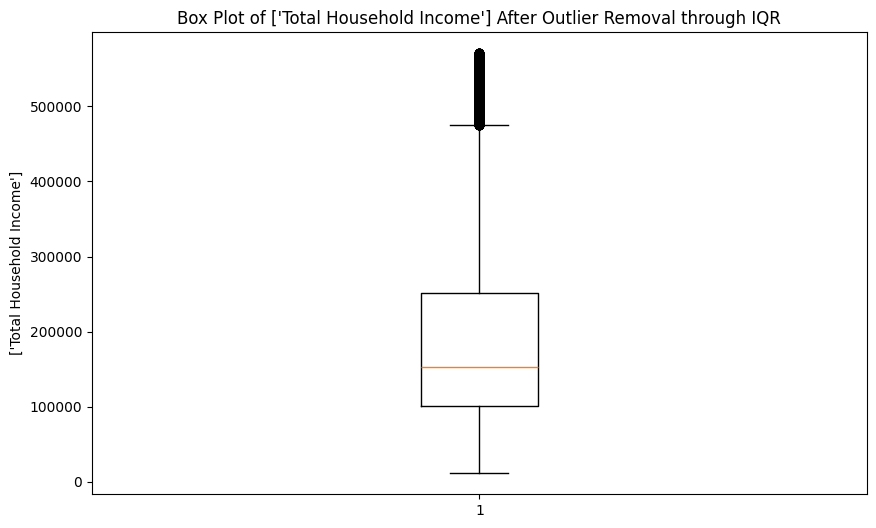

In [556]:
# Box Plot of the extracted non_outliers using matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df_non_outliers_IQR[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} After Outlier Removal through IQR')
plt.ylabel(outlier_detection_column)
plt.show()

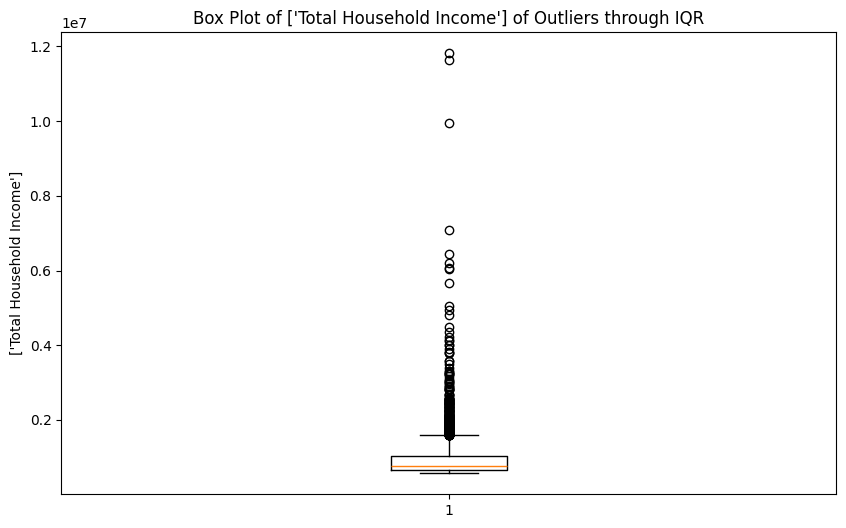

In [557]:
# Box Plot of the extracted outliers using matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df_outliers_IQR[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} of Outliers through IQR')
plt.ylabel(outlier_detection_column)
plt.show()

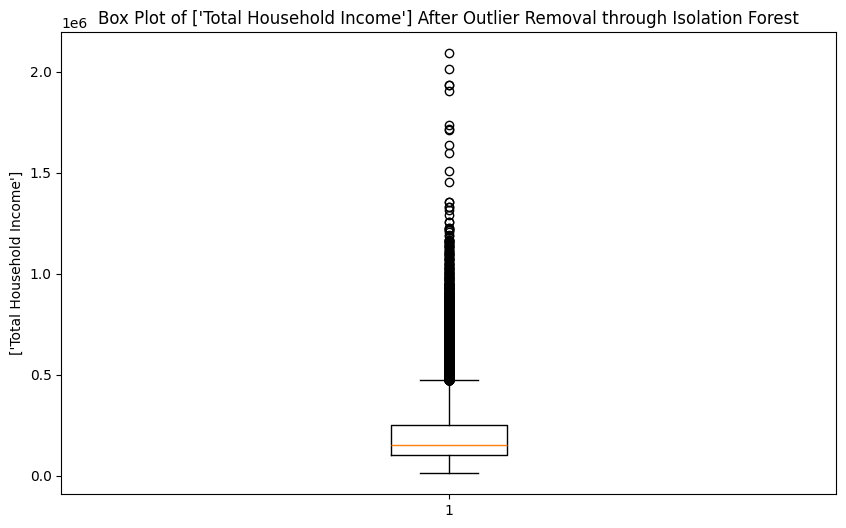

In [558]:
# Boxplot of Non_outliers detected in Isolation Forest
plt.figure(figsize=(10, 6))
plt.boxplot(df_non_outliers_iso_forest[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} After Outlier Removal through Isolation Forest')
plt.ylabel(outlier_detection_column)
plt.show()

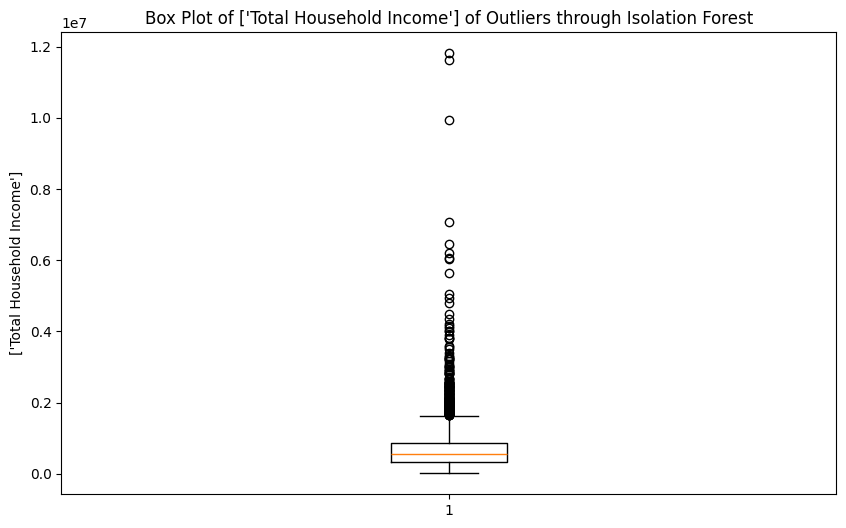

In [559]:
# Boxplot of Outliers detected in Isolation Forest
plt.figure(figsize=(10, 6))
plt.boxplot(df_outliers_iso_forest[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} of Outliers through Isolation Forest')
plt.ylabel(outlier_detection_column)
plt.show()

In [560]:
# Power Transform to Reduce Skewness
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
df_orig[numerical_columns] = pt.fit_transform(df_orig[numerical_columns])
df_non_outliers_IQR[numerical_columns] = pt.fit_transform(df_non_outliers_IQR[numerical_columns])
df_non_outliers_iso_forest[numerical_columns] = pt.fit_transform(df_non_outliers_iso_forest[numerical_columns])

In [561]:
# Scale numerical Features for clustering Analysis
scaler = StandardScaler()
# scaler = MinMaxScaler()
df_orig[numerical_columns] = scaler.fit_transform(df_orig[numerical_columns])
df_non_outliers_IQR[numerical_columns] = scaler.fit_transform(df_non_outliers_IQR[numerical_columns])
df_non_outliers_iso_forest[numerical_columns] = scaler.fit_transform(df_non_outliers_iso_forest[numerical_columns])

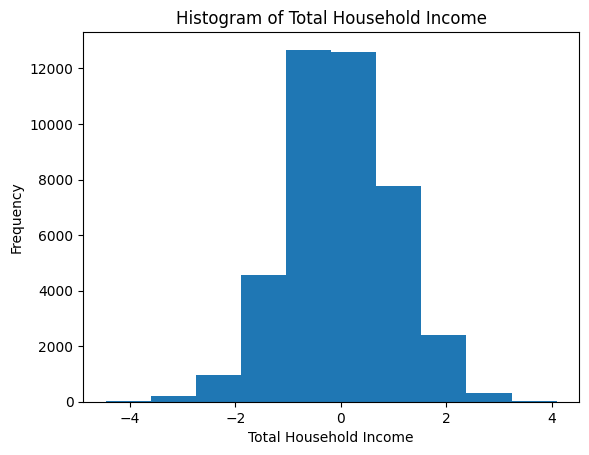

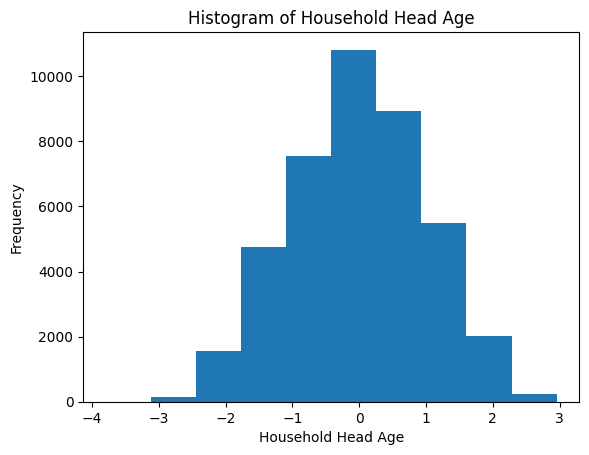

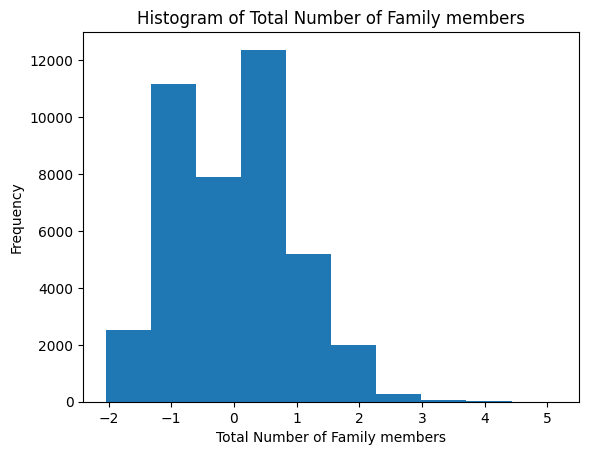

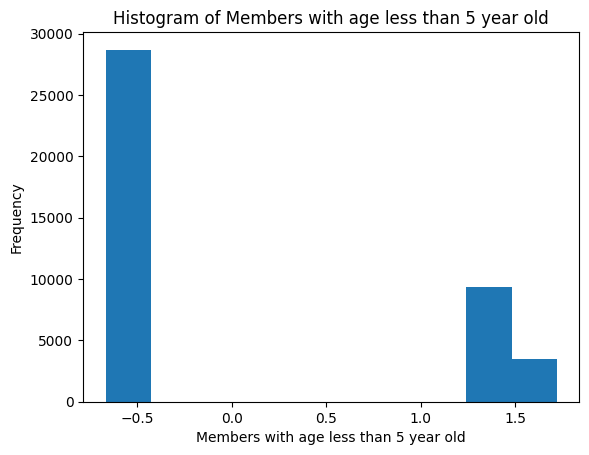

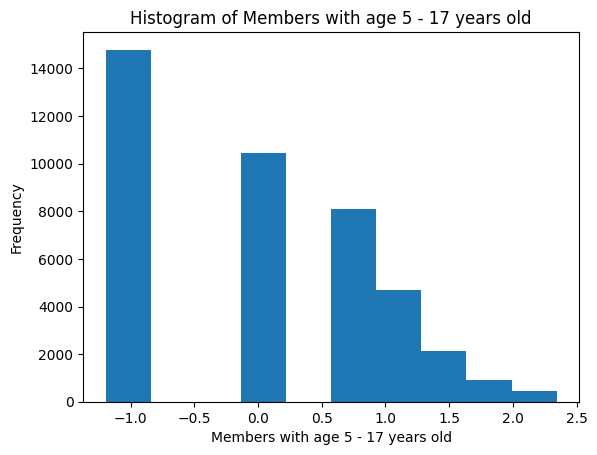

...

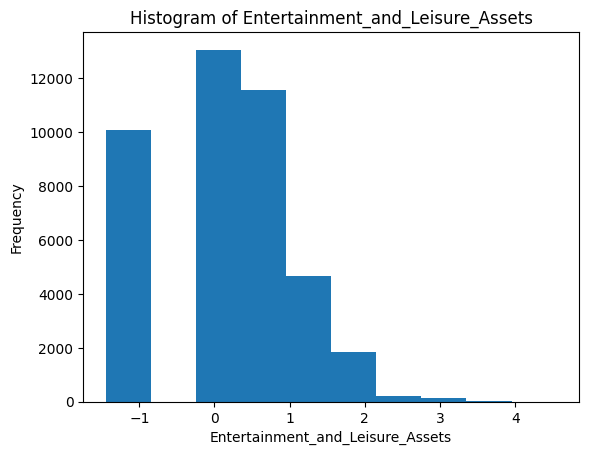

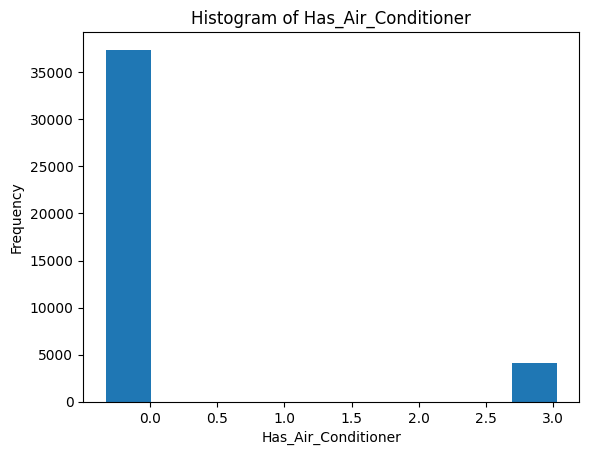

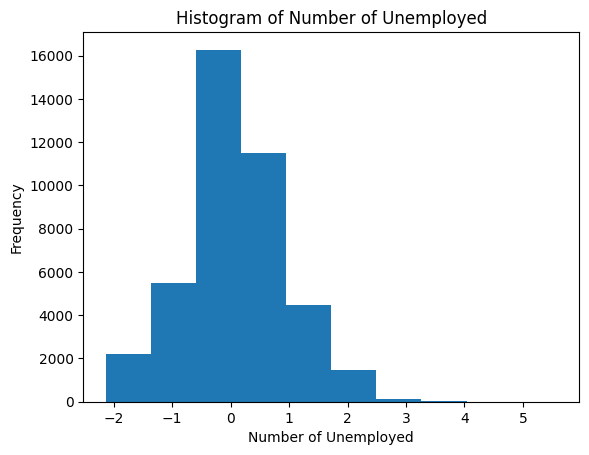

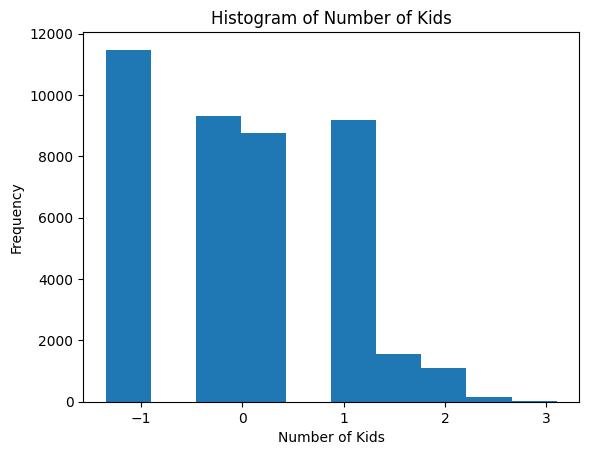

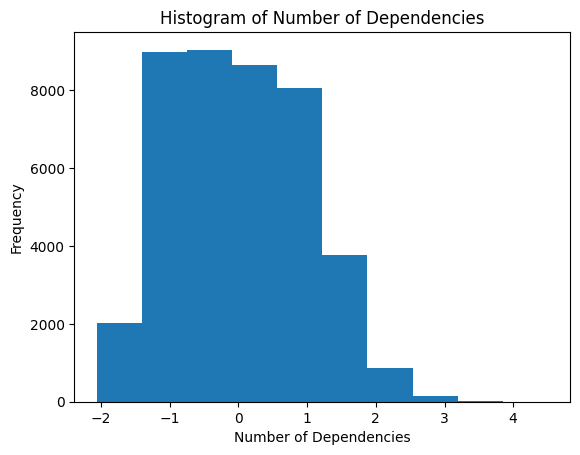

In [562]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_orig[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

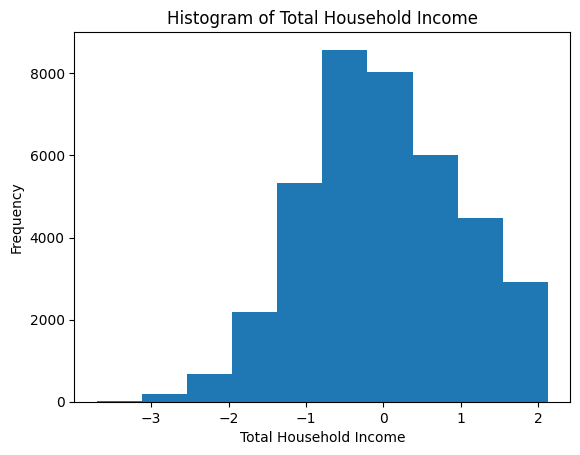

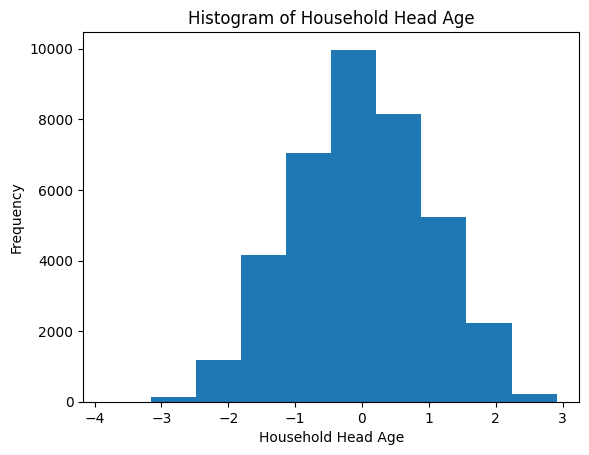

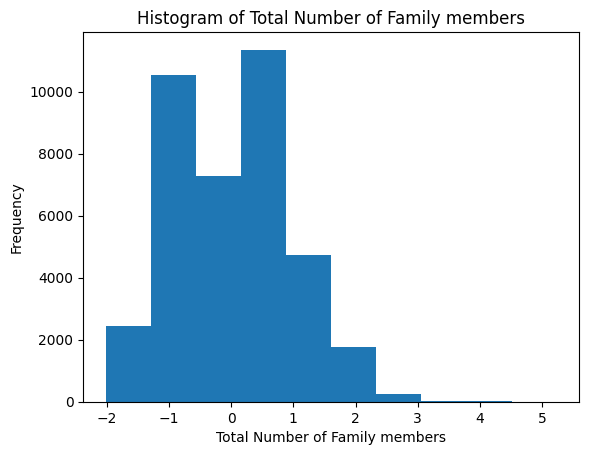

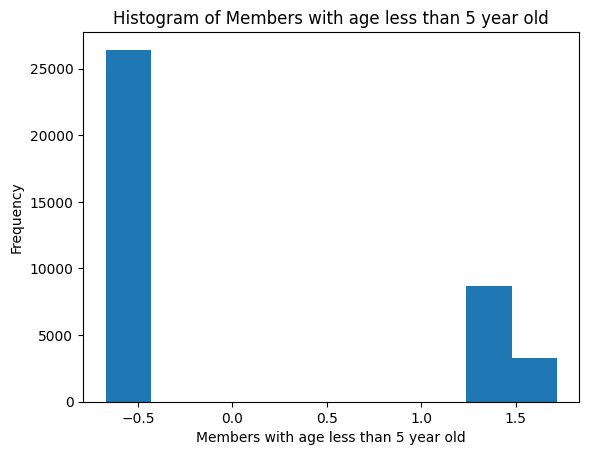

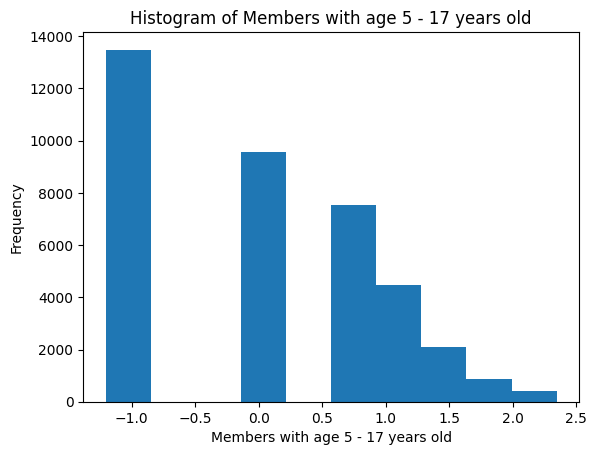

...

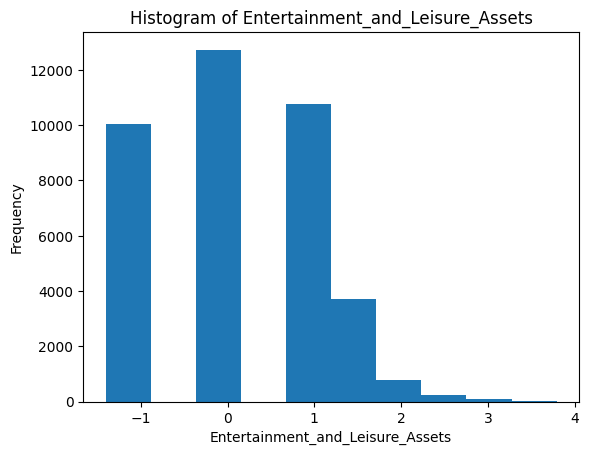

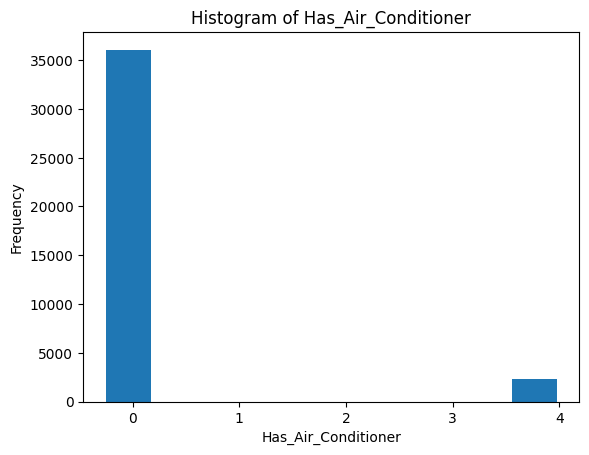

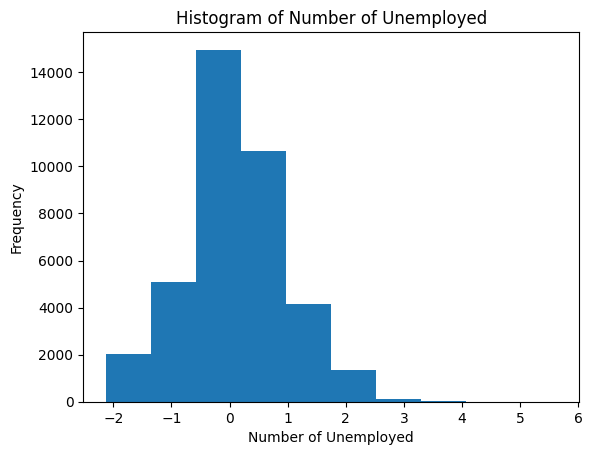

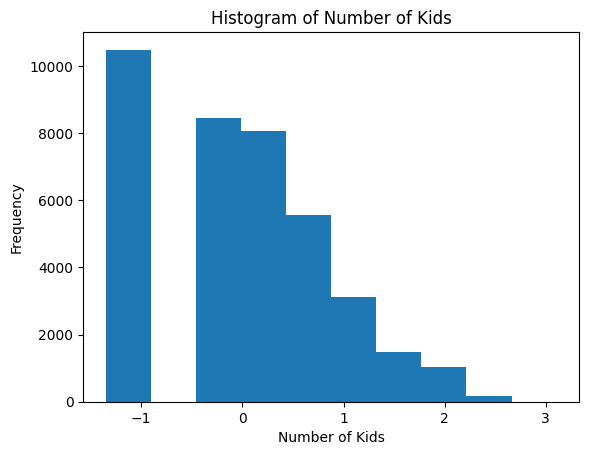

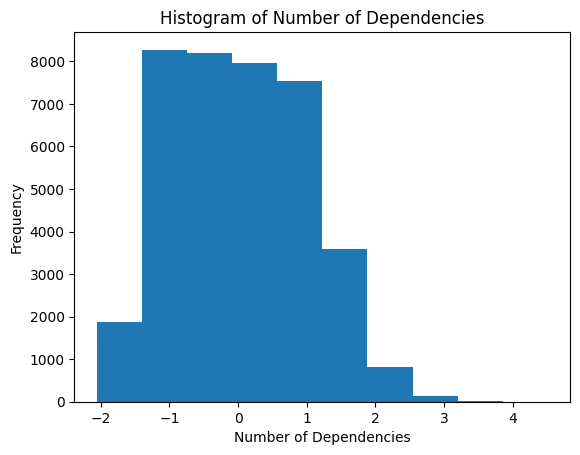

In [563]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_non_outliers_IQR[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

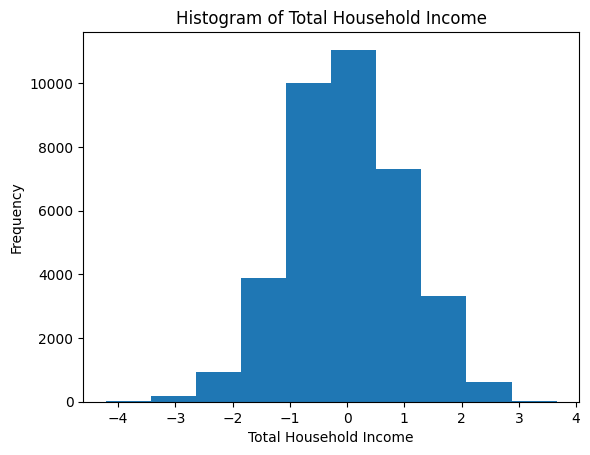

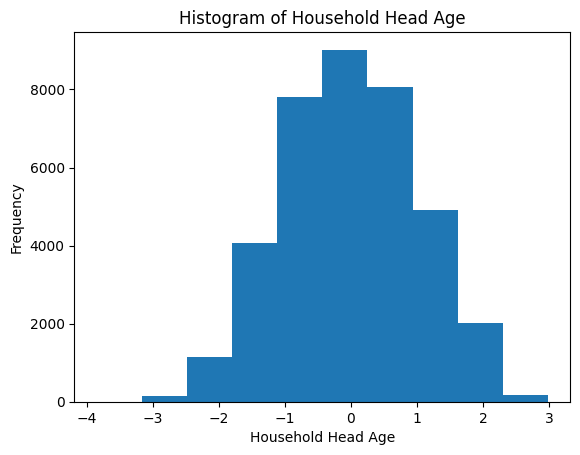

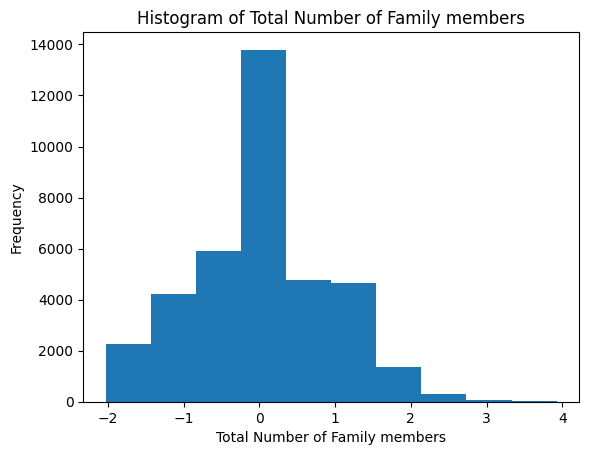

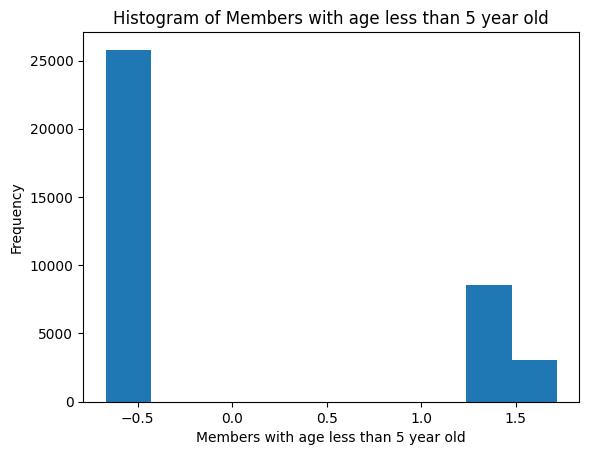

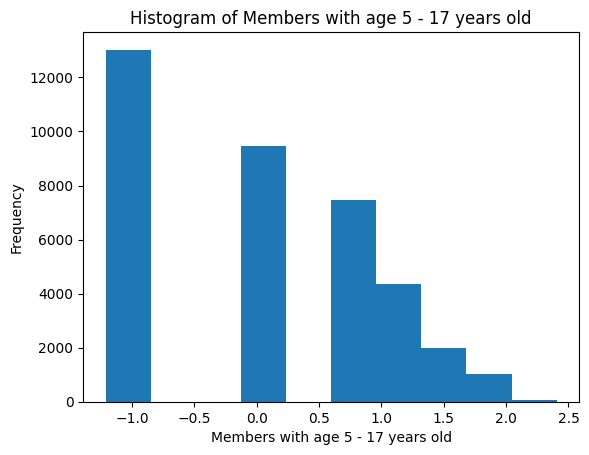

...

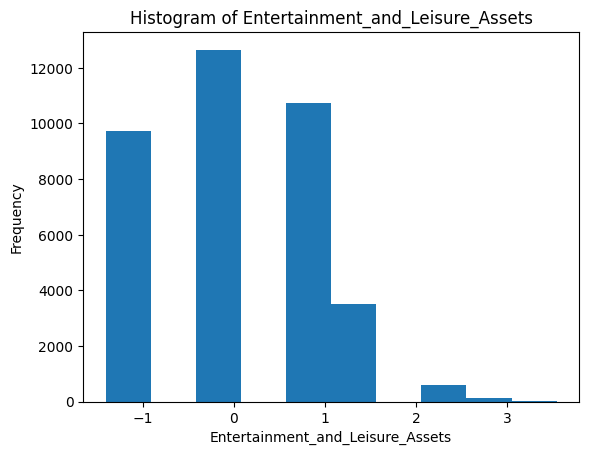

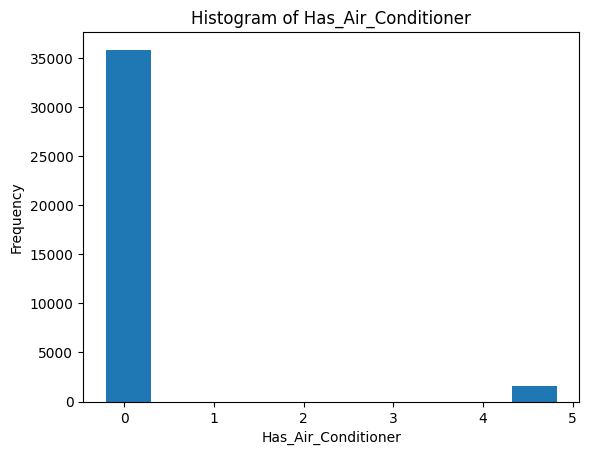

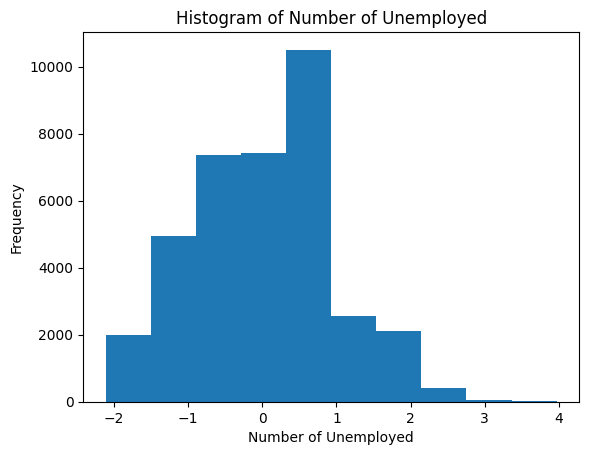

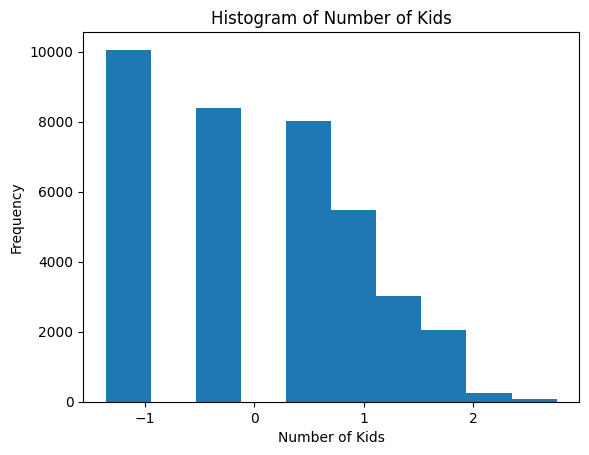

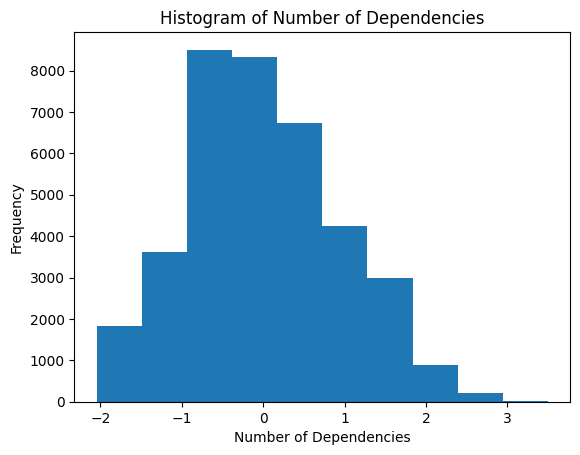

In [564]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_non_outliers_iso_forest[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Feature Selection

Original Number of Features = 60

Original Expenditure Features = 20

Original Income Features = 2

In [565]:
selected_features_rfevc = []
selected_features_mutual_info = []
selected_features_skb = []
number_of_features_to_check = []

In [566]:
X = df_orig.drop('Total Household Income', axis=1)
y = df_orig['Total Household Income']
X_IQR = df_non_outliers_IQR.drop('Total Household Income', axis=1)
y_IQR = df_non_outliers_IQR['Total Household Income']
X_iso_forest = df_non_outliers_iso_forest.drop('Total Household Income', axis=1)
y_iso_forest = df_non_outliers_iso_forest['Total Household Income']

In [567]:
# Use Regression Model for Feature Selection
from sklearn.linear_model import Ridge
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold # Changed from StratifiedKFold to KFold

def rfevc_features_selected(X, y, features_to_select):
  print(f'Test DF')
  min_features_to_select = features_to_select  # Minimum number of features to consider
  for i in range(0, 2):
    clf = Ridge()
    cv = KFold(5) # Changed to KFold which is suitable for regression

    rfecv = RFECV(
        estimator=clf,
        step=1,
        cv=cv,
        scoring="neg_mean_squared_error", # Changed scoring metric to a suitable one for Regression
        min_features_to_select=min_features_to_select,
        n_jobs=2,
    )
    rfecv.fit(X, y)
    selected_inc_features = X.columns[rfecv.support_]
    selected_features_rfevc.append(selected_inc_features)
    print(f"Optimal number of features: {rfecv.n_features_}")
    number_of_features_to_check.append(rfecv.n_features_)
    min_features_to_select = rfecv.n_features_ + 1
  print('- ' * 20)

In [568]:
rfevc_features_selected(X, y, 5)
rfevc_features_selected(X_IQR, y_IQR, 5)
rfevc_features_selected(X_iso_forest, y_iso_forest, 5)

Test DF
Optimal number of features: 53
Optimal number of features: 65
- - - - - - - - - - - - - - - - - - - - 
Test DF
Optimal number of features: 74
Optimal number of features: 75
- - - - - - - - - - - - - - - - - - - - 
Test DF
Optimal number of features: 68
Optimal number of features: 70
- - - - - - - - - - - - - - - - - - - - 


In [569]:
number_of_features_to_check

[53, 65, 74, 75, 68, 70]

In [570]:
from sklearn.feature_selection import mutual_info_regression

def mutual_info_features_selected(X, y, number_of_features):
  print(f"Number of Features to Check: {number_of_features}")
  threshold = number_of_features  # the number of most relevant features
  high_score_features = []
  feature_scores = mutual_info_regression(X, y, random_state=0)
  for score, f_name in sorted(zip(feature_scores, X.columns), reverse=True)[:threshold]:
    high_score_features.append(f_name)
  selected_df = X[high_score_features]
  selected_features_mutual_info.append(selected_df.columns)

In [571]:
print('Original Data')
mutual_info_features_selected(X, y, number_of_features_to_check[0])
mutual_info_features_selected(X, y, number_of_features_to_check[1])
print("- " * 20)
print('Non-Outlier Data - IQR')
mutual_info_features_selected(X_IQR, y_IQR, number_of_features_to_check[2])
mutual_info_features_selected(X_IQR, y_IQR, number_of_features_to_check[3])
print("- " * 20)
print('Non-Outlier Data - Isolation Forest')
mutual_info_features_selected(X_iso_forest, y_iso_forest, number_of_features_to_check[4])
mutual_info_features_selected(X_iso_forest, y_iso_forest, number_of_features_to_check[5])

Original Data
Number of Features to Check: 53
Number of Features to Check: 65
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - IQR
Number of Features to Check: 74
Number of Features to Check: 75
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - Isolation Forest
Number of Features to Check: 68
Number of Features to Check: 70


In [572]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

def skb_features_selected(X, y, number_of_features):
  threshold = number_of_features  # the number of most relevant features
  skb = SelectKBest(score_func=f_regression, k=threshold)
  sel_skb = skb.fit(X, y)
  sel_skb_index = sel_skb.get_support()
  selected_df = X.iloc[:, sel_skb_index]
  selected_features_skb.append(selected_df.columns)

In [573]:
print('Original Data')
skb_features_selected(X, y, number_of_features_to_check[0])
skb_features_selected(X, y, number_of_features_to_check[1])
print("- " * 20)
print('Non-Outlier Data - IQR')
skb_features_selected(X_IQR, y_IQR, number_of_features_to_check[2])
skb_features_selected(X_IQR, y_IQR, number_of_features_to_check[3])
print("- " * 20)
print('Non-Outlier Data - Isolation Forest')
skb_features_selected(X_iso_forest, y_iso_forest, number_of_features_to_check[4])
skb_features_selected(X_iso_forest, y_iso_forest, number_of_features_to_check[5])

Original Data
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - IQR
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - Isolation Forest


In [574]:
# Check for intersection of columns extracted for rfevc, skb, and mutual_info
print(set(selected_features_rfevc[0]) & set(selected_features_skb[0]) & set(selected_features_mutual_info[0]))

{'Other Bread and Cereals Ratio', 'Number of Motorcycle/Tricycle', 'Number of Cellular phone', 'Number of Car, Jeep, Van', 'Essential_Household_Assets', 'Number of Airconditioner', 'Number of Television', 'Miscellaneous Goods and Services Ratio', 'Medical Care Ratio', 'Expenditure to Income Ratio', 'Type of Walls', 'Meat Ratio', 'Number of bedrooms', 'Bread and Cereals Ratio', 'Special Occasions Ratio', 'Communication Ratio', 'Household Head Highest Grade Completed', 'Electricity', 'Remaining_Income_Ratio', 'House Floor Area', 'Vegetables Ratio', 'Has_Air_Conditioner', 'Transportation Ratio', 'Type of Roof', 'Toilet Facilities', 'Total number of family members employed', 'Food Ratio', 'Number of Washing Machine', 'Number of Stove with Oven/Gas Range', 'Crop Farming and Gardening Ratio', 'Communication_and_Connectivity_Assets', 'Entertainment_and_Leisure_Assets', 'Total Number of Family members', 'Transporation_Assets', 'Rice Ratio', 'Number of Refrigerator/Freezer'}


In [575]:
common_features_rfevc_skb_mutual_info = []

In [576]:
for i in range(len(selected_features_rfevc)):
  print(set(selected_features_rfevc[i]) & set(selected_features_skb[i]) & set(selected_features_mutual_info[i]))
  common_features_rfevc_skb_mutual_info.append(set(selected_features_rfevc[i]) & set(selected_features_skb[i]) & set(selected_features_mutual_info[i]))

{'Other Bread and Cereals Ratio', 'Number of Motorcycle/Tricycle', 'Number of Cellular phone', 'Number of Car, Jeep, Van', 'Essential_Household_Assets', 'Number of Airconditioner', 'Number of Television', 'Miscellaneous Goods and Services Ratio', 'Medical Care Ratio', 'Expenditure to Income Ratio', 'Type of Walls', 'Meat Ratio', 'Number of bedrooms', 'Bread and Cereals Ratio', 'Special Occasions Ratio', 'Communication Ratio', 'Household Head Highest Grade Completed', 'Electricity', 'Remaining_Income_Ratio', 'House Floor Area', 'Vegetables Ratio', 'Has_Air_Conditioner', 'Transportation Ratio', 'Type of Roof', 'Toilet Facilities', 'Total number of family members employed', 'Food Ratio', 'Number of Washing Machine', 'Number of Stove with Oven/Gas Range', 'Crop Farming and Gardening Ratio', 'Communication_and_Connectivity_Assets', 'Entertainment_and_Leisure_Assets', 'Total Number of Family members', 'Transporation_Assets', 'Rice Ratio', 'Number of Refrigerator/Freezer'}
{'Other Bread and C

In [577]:
# Check number of features per intersecting sets
for i in range(len(common_features_rfevc_skb_mutual_info)):
  print(len(common_features_rfevc_skb_mutual_info[i]))

36
54
72
75
60
63


In [578]:
df_orig_feature_rfevc_lessFeatures = df_orig[list(selected_features_rfevc[0])]
df_orig_feature_skb_lessFeatures = df_orig[list(selected_features_skb[0])]
df_orig_feature_mutual_info_lessFeatures = df_orig[list(selected_features_mutual_info[0])]

df_non_outliers_IQR_feature_rfevc_lessFeatures = df_non_outliers_IQR[list(selected_features_rfevc[2])]
df_non_outliers_IQR_feature_skb_lessFeatures = df_non_outliers_IQR[list(selected_features_skb[2])]
df_non_outliers_IQR_feature_mutual_info_lessFeatures = df_non_outliers_IQR[list(selected_features_mutual_info[2])]

df_non_outliers_iso_forest_feature_rfevc_lessFeatures = df_non_outliers_iso_forest[list(selected_features_rfevc[4])]
df_non_outliers_iso_forest_feature_skb_lessFeatures = df_non_outliers_iso_forest[list(selected_features_skb[4])]
df_non_outliers_iso_forest_feature_mutual_info_lessFeatures = df_non_outliers_iso_forest[list(selected_features_mutual_info[4])]

In [579]:
number_of_features_to_check

[53, 65, 74, 75, 68, 70]

In [580]:
df_orig_feature_rfevc_moreFeatures = df_orig[list(selected_features_rfevc[1])]
df_orig_feature_skb_moreFeatures = df_orig[list(selected_features_skb[1])]
df_orig_feature_mutual_info_moreFeatures = df_orig[list(selected_features_mutual_info[1])]

df_non_outliers_IQR_feature_rfevc_moreFeatures = df_non_outliers_IQR[list(selected_features_rfevc[3])]
df_non_outliers_IQR_feature_skb_moreFeatures = df_non_outliers_IQR[list(selected_features_skb[3])]
df_non_outliers_IQR_feature_mutual_info_moreFeatures = df_non_outliers_IQR[list(selected_features_mutual_info[3])]

df_non_outliers_iso_forest_feature_rfevc_moreFeatures = df_non_outliers_iso_forest[list(selected_features_rfevc[5])]
df_non_outliers_iso_forest_feature_skb_moreFeatures = df_non_outliers_iso_forest[list(selected_features_skb[5])]
df_non_outliers_iso_forest_feature_mutual_info_moreFeatures = df_non_outliers_iso_forest[list(selected_features_mutual_info[5])]

In [581]:
# Check number of features per intersecting sets
for i in range(len(common_features_rfevc_skb_mutual_info)):
  print(len(common_features_rfevc_skb_mutual_info[i]))

36
54
72
75
60
63


In [582]:
df_orig_combined_lessFeatures = df_orig[list(common_features_rfevc_skb_mutual_info[0])]
df_orig_combined_moreFeatures = df_orig[list(common_features_rfevc_skb_mutual_info[1])]

df_non_outliers_IQR_combined_lessFeatures = df_non_outliers_IQR[list(common_features_rfevc_skb_mutual_info[2])]
df_non_outliers_IQR_combined_moreFeatures = df_non_outliers_IQR[list(common_features_rfevc_skb_mutual_info[3])]

df_non_outliers_iso_forest_combined_lessFeatures = df_non_outliers_iso_forest[list(common_features_rfevc_skb_mutual_info[4])]
df_non_outliers_iso_forest_combined_moreFeatures = df_non_outliers_iso_forest[list(common_features_rfevc_skb_mutual_info[5])]

# Manual Feature Selection

If following the research questions, I would want to omit features that have no relation with answering the questions.

1. Income
  - Omit Raw Income Columns that may affect clustering
  - Retain Total Household Income
  - Keep ratios as they are essential in analyzing income allocation

2. Expenditure
  - Omit raw individual expenditure values.
  - Omit Total Expenditure
  - Maintain Expenditure Ratios
  - Try to omit NonEssential, Essential, and NonFood Expenditure and check if they affect silhouette score

3. Living Situation
  - Remove Type of House/Building
  - Keep Roof, Walls, Tenure Status, Toilet Facilities, Electricity, and Main Source of Water Supply as they primarily indicate critical living situations
  - Omit House Age and number of Bedrooms

4. Family Composition
  - Omit Household Head Class of Worker
  - Omit Household Head Age
  - Remove Members with age < 5 and 5-17
  - Remove Number of Kids and Unemployed
  - Keep Number of Dependencies
  - Remove Household Head Sex_Male as it is predominantly Male

5. Assets
  - Remove Individual Assets
  - Keep Engineered Assets

In [583]:
df_orig.columns

Index(['Total Household Income', 'Region', 'Agricultural Household indicator',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Completed', 'Household Head Occupation',
       'Household Head Class of Worker', 'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'Type of Building/House',
       'Type of Roof', 'Type of Walls', 'House Floor Area', 'House Age',
       'Number of bedrooms', 'Tenure Status', 'Toilet Facilities',
       'Electricity', 'Main Source of Water Supply', 'Number of Television',
       'Number of CD/VCD/DVD', 'Number of Component/Stereo set',
       'Number of Refrigerator/Freezer', 'Number of Washing Machine',
       'Number of Airconditioner', 'Number of Car, Jeep, Van',
       'Number of Landline/wireless telephones', 'Number of Cellular phone',
       'Number of Personal Computer', 'Number 

In [584]:
'''
Columns to Manually Drop:
['Bread and Cereals Expenditure', 'Total Rice Expenditure', 'Meat Expenditure',
'Total Fish and  marine products Expenditure', 'Fruit Expenditure', 'Vegetables Expenditure',
'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Food Expenditure',
'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
'Clothing, Footwear and Other Wear Expenditure', 'Imputed House Rental Value',
'Medical Care Expenditure', 'Transportation Expenditure', 'Communication Expenditure',
'Education Expenditure', 'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure',
'Total Income from Entrepreneurial Acitivites', 'Crop Farming and Gardening expenses', 'Total_NonFood_Spending',
'Type of Building/House', 'House Age', 'Household Head Class of Worker', 'Household Head Age',
'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Number of Dependencies',
'Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set', 'Number of Refrigerator/Freezer', 'Number of Washing Machine',
'Number of Airconditioner', 'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones', 'Number of Cellular phone',
'Number of Personal Computer', 'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca', 'Number of Motorcycle/Tricycle', 'Number of bedrooms',
'Household Head Sex_Male', 'Housing and water Expenditure', 'Total Expenditure']'''

"\nColumns to Manually Drop: \n['Bread and Cereals Expenditure', 'Total Rice Expenditure', 'Meat Expenditure', \n'Total Fish and  marine products Expenditure', 'Fruit Expenditure', 'Vegetables Expenditure',\n'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Food Expenditure', \n'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',\n'Clothing, Footwear and Other Wear Expenditure', 'Imputed House Rental Value', \n'Medical Care Expenditure', 'Transportation Expenditure', 'Communication Expenditure',\n'Education Expenditure', 'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure',\n'Total Income from Entrepreneurial Acitivites', 'Crop Farming and Gardening expenses', 'Total_NonFood_Spending',\n'Type of Building/House', 'House Age', 'Household Head Class of Worker', 'Household Head Age',\n'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Number of Dependencies',\n'Number of Televis

In [585]:
df_orig_manual = df_orig.drop(columns=['Type of Building/House', 'House Age', 'Household Head Class of Worker', 'Household Head Age',
'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Number of Dependencies',
'Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set', 'Number of Refrigerator/Freezer', 'Number of Washing Machine',
'Number of Airconditioner', 'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones', 'Number of Cellular phone',
'Number of Personal Computer', 'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca', 'Number of Motorcycle/Tricycle', 'Number of bedrooms',
'Household Head Sex_Male'])

In [586]:
df_non_outliers_IQR_manual = df_non_outliers_IQR.drop(columns=[
'Type of Building/House', 'House Age', 'Household Head Class of Worker', 'Household Head Age',
'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Number of Dependencies',
'Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set', 'Number of Refrigerator/Freezer', 'Number of Washing Machine',
'Number of Airconditioner', 'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones', 'Number of Cellular phone',
'Number of Personal Computer', 'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca', 'Number of Motorcycle/Tricycle', 'Number of bedrooms',
'Household Head Sex_Male'])

In [587]:
df_non_outliers_IQR_manual.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38369 entries, 0 to 38368
Data columns (total 54 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   index                                                       38369 non-null  int64  
 1   Total Household Income                                      38369 non-null  float64
 2   Region                                                      38369 non-null  int64  
 3   Agricultural Household indicator                            38369 non-null  int64  
 4   Household Head Marital Status                               38369 non-null  int64  
 5   Household Head Highest Grade Completed                      38369 non-null  int64  
 6   Household Head Occupation                                   38369 non-null  int64  
 7   Total Number of Family members                              38369 non-null  float64
 

In [588]:
df_non_outliers_iso_forest_manual = df_non_outliers_iso_forest.drop(columns=['Type of Building/House', 'House Age', 'Household Head Class of Worker', 'Household Head Age',
'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Number of Dependencies',
'Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set', 'Number of Refrigerator/Freezer', 'Number of Washing Machine',
'Number of Airconditioner', 'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones', 'Number of Cellular phone',
'Number of Personal Computer', 'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca', 'Number of Motorcycle/Tricycle', 'Number of bedrooms',
'Household Head Sex_Male'])

In [589]:
number_of_features_to_check

[53, 65, 74, 75, 68, 70]

In [590]:
df_list_no_pca = [df_orig, df_non_outliers_IQR, df_non_outliers_iso_forest,
                  df_orig_manual, df_non_outliers_IQR_manual, df_non_outliers_iso_forest_manual,
                  df_orig_feature_rfevc_lessFeatures, df_orig_feature_skb_lessFeatures, df_orig_feature_mutual_info_lessFeatures,
                  df_non_outliers_IQR_feature_rfevc_lessFeatures, df_non_outliers_IQR_feature_skb_lessFeatures, df_non_outliers_IQR_feature_mutual_info_lessFeatures,
                  df_non_outliers_iso_forest_feature_rfevc_lessFeatures, df_non_outliers_iso_forest_feature_skb_lessFeatures, df_non_outliers_iso_forest_feature_mutual_info_lessFeatures,
                  df_orig_feature_rfevc_moreFeatures, df_orig_feature_skb_moreFeatures, df_orig_feature_mutual_info_moreFeatures,
                  df_non_outliers_IQR_feature_rfevc_moreFeatures, df_non_outliers_IQR_feature_skb_moreFeatures, df_non_outliers_IQR_feature_mutual_info_moreFeatures,
                  df_non_outliers_iso_forest_feature_rfevc_moreFeatures, df_non_outliers_iso_forest_feature_skb_moreFeatures, df_non_outliers_iso_forest_feature_mutual_info_moreFeatures,
                  df_orig_combined_lessFeatures, df_orig_combined_moreFeatures,
                  df_non_outliers_IQR_combined_lessFeatures, df_non_outliers_IQR_combined_moreFeatures,
                  df_non_outliers_iso_forest_combined_lessFeatures, df_non_outliers_iso_forest_combined_moreFeatures]


In [591]:
df_orig_pca = df_orig.copy()
df_non_outliers_IQR_pca = df_non_outliers_IQR.copy()
df_non_outliers_iso_forest_pca = df_non_outliers_iso_forest.copy()
df_orig_manual_pca = df_orig_manual.copy()
df_non_outliers_IQR_manual_pca = df_non_outliers_IQR_manual.copy()
df_non_outliers_iso_forest_manual_pca = df_non_outliers_iso_forest_manual.copy()
df_orig_feature_rfevc_lessFeatures_pca = df_orig_feature_rfevc_lessFeatures.copy()
df_orig_feature_skb_lessFeatures_pca = df_orig_feature_skb_lessFeatures.copy()
df_orig_feature_mutual_info_lessFeatures_pca = df_orig_feature_mutual_info_lessFeatures.copy()
df_non_outliers_IQR_feature_rfevc_lessFeatures_pca = df_non_outliers_IQR_feature_rfevc_lessFeatures.copy()
df_non_outliers_IQR_feature_skb_lessFeatures_pca = df_non_outliers_IQR_feature_skb_lessFeatures.copy()
df_non_outliers_IQR_feature_mutual_info_lessFeatures_pca = df_non_outliers_IQR_feature_mutual_info_lessFeatures.copy()
df_non_outliers_iso_forest_feature_rfevc_lessFeatures_pca = df_non_outliers_iso_forest_feature_rfevc_lessFeatures.copy()
df_non_outliers_iso_forest_feature_skb_lessFeatures_pca = df_non_outliers_iso_forest_feature_skb_lessFeatures.copy()
df_non_outliers_iso_forest_feature_mutual_info_lessFeatures_pca = df_non_outliers_iso_forest_feature_mutual_info_lessFeatures.copy()
df_orig_feature_rfevc_moreFeatures_pca = df_orig_feature_rfevc_moreFeatures.copy()
df_orig_feature_skb_moreFeatures_pca = df_orig_feature_skb_moreFeatures.copy()
df_orig_feature_mutual_info_moreFeatures_pca = df_orig_feature_mutual_info_moreFeatures.copy()
df_non_outliers_IQR_feature_rfevc_moreFeatures_pca = df_non_outliers_IQR_feature_rfevc_moreFeatures.copy()
df_non_outliers_IQR_feature_skb_moreFeatures_pca = df_non_outliers_IQR_feature_skb_moreFeatures.copy()
df_non_outliers_IQR_feature_mutual_info_moreFeatures_pca = df_non_outliers_IQR_feature_mutual_info_moreFeatures.copy()
df_non_outliers_iso_forest_feature_rfevc_moreFeatures_pca = df_non_outliers_iso_forest_feature_rfevc_moreFeatures.copy()
df_non_outliers_iso_forest_feature_skb_moreFeatures_pca = df_non_outliers_iso_forest_feature_skb_moreFeatures.copy()
df_non_outliers_iso_forest_feature_mutual_info_moreFeatures_pca = df_non_outliers_iso_forest_feature_mutual_info_moreFeatures.copy()
df_orig_combined_lessFeatures_pca = df_orig_combined_lessFeatures.copy()
df_orig_combined_moreFeatures_pca = df_orig_combined_moreFeatures.copy()
df_non_outliers_IQR_combined_lessFeatures_pca = df_non_outliers_IQR_combined_lessFeatures.copy()
df_non_outliers_IQR_combined_moreFeatures_pca = df_non_outliers_IQR_combined_moreFeatures.copy()
df_non_outliers_iso_forest_combined_lessFeatures_pca = df_non_outliers_iso_forest_combined_lessFeatures.copy()
df_non_outliers_iso_forest_combined_moreFeatures_pca = df_non_outliers_iso_forest_combined_moreFeatures.copy()

In [592]:
df_list_with_pca = [df_orig_pca, df_non_outliers_IQR_pca, df_non_outliers_iso_forest_pca,
                  df_orig_manual_pca, df_non_outliers_IQR_manual_pca, df_non_outliers_iso_forest_manual_pca,
                  df_orig_feature_rfevc_lessFeatures_pca, df_orig_feature_skb_lessFeatures_pca, df_orig_feature_mutual_info_lessFeatures_pca,
                  df_non_outliers_IQR_feature_rfevc_lessFeatures_pca, df_non_outliers_IQR_feature_skb_lessFeatures_pca, df_non_outliers_IQR_feature_mutual_info_lessFeatures_pca,
                  df_non_outliers_iso_forest_feature_rfevc_lessFeatures_pca, df_non_outliers_iso_forest_feature_skb_lessFeatures_pca, df_non_outliers_iso_forest_feature_mutual_info_lessFeatures_pca,
                  df_orig_feature_rfevc_moreFeatures_pca, df_orig_feature_skb_moreFeatures_pca, df_orig_feature_mutual_info_moreFeatures_pca,
                  df_non_outliers_IQR_feature_rfevc_moreFeatures_pca, df_non_outliers_IQR_feature_skb_moreFeatures_pca, df_non_outliers_IQR_feature_mutual_info_moreFeatures_pca,
                  df_non_outliers_iso_forest_feature_rfevc_moreFeatures_pca, df_non_outliers_iso_forest_feature_skb_moreFeatures_pca, df_non_outliers_iso_forest_feature_mutual_info_moreFeatures_pca,
                  df_orig_combined_lessFeatures_pca, df_orig_combined_moreFeatures_pca,
                  df_non_outliers_IQR_combined_lessFeatures_pca, df_non_outliers_IQR_combined_moreFeatures_pca,
                  df_non_outliers_iso_forest_combined_lessFeatures_pca, df_non_outliers_iso_forest_combined_moreFeatures_pca]

In [593]:
len(df_list_no_pca)

30

In [594]:
len(df_list_with_pca)

30

# PCA

In [595]:
# Perform PCA
from sklearn.decomposition import PCA

def conduct_PCA(df, index_of_df):
  print(f"PCA for DataFrame at {index_of_df}")
  pca = PCA(n_components=df.shape[1])
  df_pca = pca.fit_transform(df)
  cumsum = np.cumsum(pca.explained_variance_ratio_)
  print(cumsum)
  d = np.argmax(cumsum >= 0.90) + 1
  print("dimension : ", d)

  explained_variance = pca.explained_variance_ratio_
  cumulative_variance = np.cumsum(explained_variance)
  plt.plot(range(1, len(explained_variance) + 1), cumulative_variance)
  plt.xlabel('Number of Components')
  plt.ylabel('Cumulative Explained Variance')
  plt.title(f'Scree Plot for DataFrame at {index_of_df}')
  plt.show()

  #If d = 1 and cumulative_variance > 90, train final PCA with 2, else if cumulative variance < 90, use d
  if d == 1 and cumulative_variance[-1] > 0.90:
    pca = PCA(n_components=2)
  elif cumulative_variance[-1] < 0.90:
    pca = PCA(n_components=24)
  else:
    pca = PCA(n_components=d)
  df_pca = pca.fit_transform(df)
  df_list_with_pca[index_of_df] = df_pca

PCA for DataFrame at 0
[0.38891053 0.5346764  0.61589392 0.65302126 0.68287639 0.70255536
 0.72060026 0.73542873 0.74918196 0.76188976 0.7737148  0.78439149
 0.79461292 0.80400601 0.81304696 0.82160204 0.82955285 0.83699539
 0.84428789 0.85123652 0.85799987 0.86446403 0.87085329 0.87661494
 0.88223581 0.88777208 0.89312921 0.89840338 0.90350856 0.90851541
 0.91343609 0.91814871 0.92279676 0.92729336 0.93173802 0.93597625
 0.94017952 0.94423277 0.94825572 0.95215708 0.95597917 0.95945298
 0.96290573 0.96621689 0.96951441 0.97270916 0.97582816 0.97865995
 0.98139896 0.98385267 0.98626517 0.98798735 0.9896924  0.99117115
 0.99251054 0.99381509 0.99478586 0.99565039 0.9962857  0.99688157
 0.99743153 0.99791601 0.99832408 0.99866579 0.99891601 0.99915992
 0.99936813 0.99956172 0.99970918 0.99980708 0.99990151 0.99996135
 0.99998773 1.         1.        ]
dimension :  29


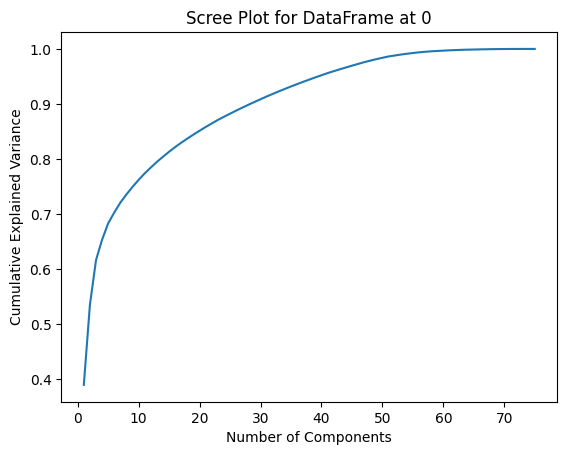

PCA for DataFrame at 1
[0.99999894 0.99999935 0.99999951 0.99999958 0.99999962 0.99999965
 0.99999967 0.99999969 0.99999971 0.99999972 0.99999974 0.99999975
 0.99999976 0.99999977 0.99999978 0.99999979 0.9999998  0.99999981
 0.99999982 0.99999983 0.99999984 0.99999984 0.99999985 0.99999986
 0.99999986 0.99999987 0.99999988 0.99999988 0.99999989 0.99999989
 0.9999999  0.9999999  0.99999991 0.99999992 0.99999992 0.99999993
 0.99999993 0.99999994 0.99999994 0.99999994 0.99999995 0.99999995
 0.99999996 0.99999996 0.99999996 0.99999997 0.99999997 0.99999997
 0.99999998 0.99999998 0.99999998 0.99999999 0.99999999 0.99999999
 0.99999999 0.99999999 0.99999999 0.99999999 1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]
dimension :  1


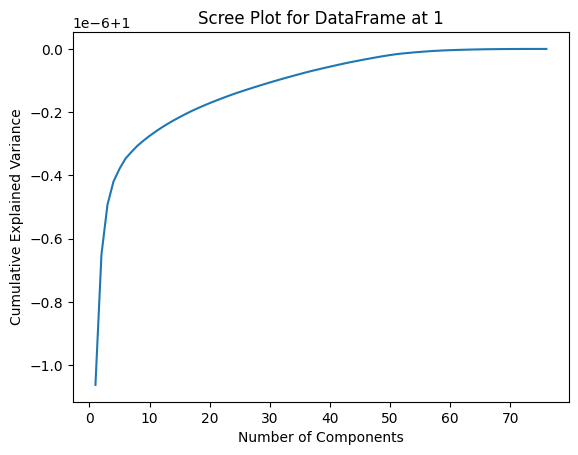

PCA for DataFrame at 2
[0.99999894 0.99999935 0.99999951 0.99999958 0.99999962 0.99999965
 0.99999967 0.99999969 0.99999971 0.99999972 0.99999973 0.99999975
 0.99999976 0.99999977 0.99999978 0.99999979 0.9999998  0.99999981
 0.99999982 0.99999983 0.99999983 0.99999984 0.99999985 0.99999986
 0.99999986 0.99999987 0.99999987 0.99999988 0.99999989 0.99999989
 0.9999999  0.9999999  0.99999991 0.99999992 0.99999992 0.99999993
 0.99999993 0.99999993 0.99999994 0.99999994 0.99999995 0.99999995
 0.99999996 0.99999996 0.99999996 0.99999997 0.99999997 0.99999997
 0.99999998 0.99999998 0.99999998 0.99999999 0.99999999 0.99999999
 0.99999999 0.99999999 0.99999999 0.99999999 1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.        ]
dimension :  1


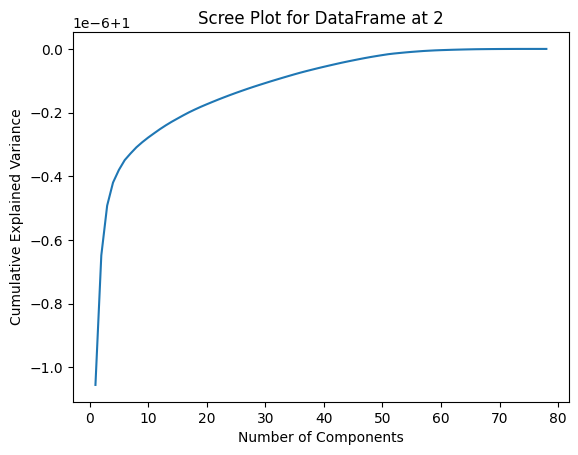

PCA for DataFrame at 3
[0.45127429 0.62161284 0.68959557 0.7188052  0.74269983 0.76417335
 0.78385838 0.79882591 0.81235297 0.82518879 0.83624722 0.84689757
 0.85652014 0.86526853 0.87353914 0.88126665 0.88883542 0.89601635
 0.9028135  0.90919573 0.91525897 0.92116103 0.92697103 0.93263752
 0.93824596 0.94340968 0.94824671 0.95293965 0.9575448  0.96210061
 0.96650621 0.97053455 0.97431038 0.97757768 0.98059419 0.98351384
 0.98562672 0.98765184 0.98951541 0.99121396 0.99286812 0.99440345
 0.99552055 0.99652181 0.99726889 0.99791156 0.99850514 0.99899423
 0.99940007 0.99964489 0.99987317 0.99996906 1.        ]
dimension :  19


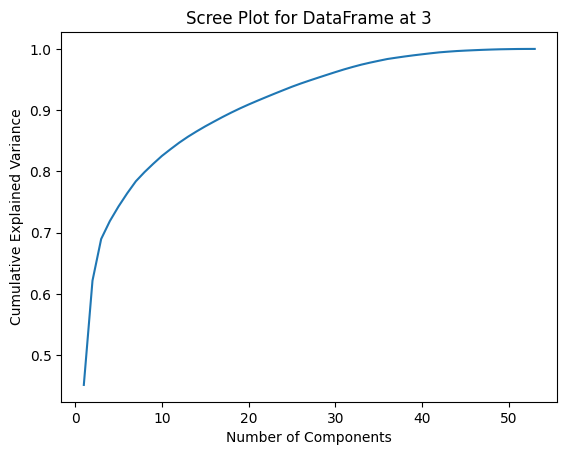

PCA for DataFrame at 4
[0.99999909 0.9999995  0.99999966 0.99999971 0.99999974 0.99999976
 0.99999978 0.9999998  0.99999981 0.99999983 0.99999984 0.99999985
 0.99999986 0.99999987 0.99999987 0.99999988 0.99999989 0.9999999
 0.9999999  0.99999991 0.99999992 0.99999992 0.99999993 0.99999993
 0.99999994 0.99999994 0.99999995 0.99999995 0.99999996 0.99999996
 0.99999997 0.99999997 0.99999997 0.99999998 0.99999998 0.99999998
 0.99999998 0.99999999 0.99999999 0.99999999 0.99999999 0.99999999
 0.99999999 1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.        ]
dimension :  1


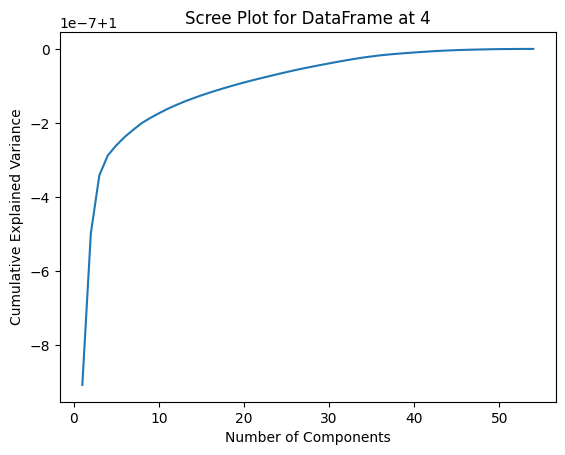

PCA for DataFrame at 5
[0.9999991  0.9999995  0.99999966 0.99999971 0.99999974 0.99999976
 0.99999978 0.9999998  0.99999981 0.99999983 0.99999984 0.99999985
 0.99999986 0.99999987 0.99999987 0.99999988 0.99999989 0.9999999
 0.9999999  0.99999991 0.99999991 0.99999992 0.99999993 0.99999993
 0.99999994 0.99999994 0.99999995 0.99999995 0.99999996 0.99999996
 0.99999996 0.99999997 0.99999997 0.99999998 0.99999998 0.99999998
 0.99999998 0.99999999 0.99999999 0.99999999 0.99999999 0.99999999
 0.99999999 1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.        ]
dimension :  1


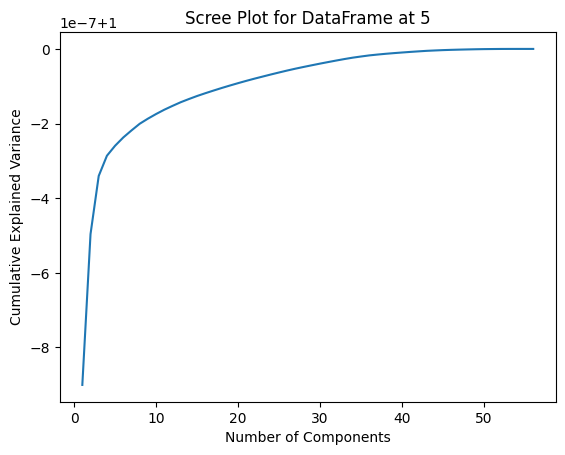

PCA for DataFrame at 6
[0.21342159 0.31223112 0.38864933 0.42979143 0.46643935 0.50123948
 0.53465968 0.56332738 0.58947233 0.61433624 0.63771414 0.65967673
 0.68022162 0.69937794 0.71747712 0.73481414 0.75178816 0.76839386
 0.78398763 0.79845656 0.81285136 0.82711449 0.84110999 0.85439418
 0.86736399 0.87997025 0.89162416 0.90283184 0.91382558 0.92414981
 0.93376603 0.94301935 0.95131394 0.95948344 0.96691496 0.97398757
 0.97972102 0.98369963 0.98757195 0.98994857 0.99195013 0.99380178
 0.9950591  0.99622069 0.99719609 0.99794539 0.99856573 0.99916658
 0.99960397 0.9998866  0.99996335 1.         1.        ]
dimension :  28


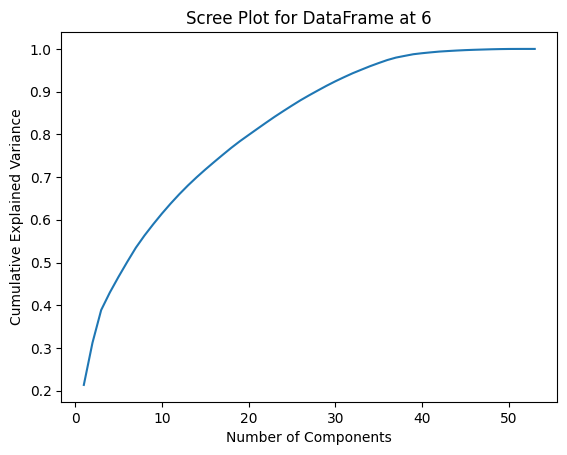

PCA for DataFrame at 7
[0.52789124 0.6317762  0.66188637 0.6883979  0.71380931 0.7360294
 0.75309477 0.76949447 0.78423037 0.79732843 0.80915599 0.81996414
 0.83041934 0.83987574 0.84911115 0.85792225 0.86633616 0.87433663
 0.88210267 0.88976604 0.89710537 0.90409923 0.9108463  0.91745096
 0.92390449 0.93014092 0.93629768 0.94226026 0.94801624 0.95344571
 0.95871337 0.96339879 0.96788659 0.97230089 0.97663646 0.98052971
 0.98398019 0.98727556 0.98962821 0.99179409 0.99344669 0.99495575
 0.99598445 0.99686458 0.99773621 0.99831647 0.99886516 0.99932286
 0.99966545 0.99980125 0.99991799 1.         1.        ]
dimension :  22


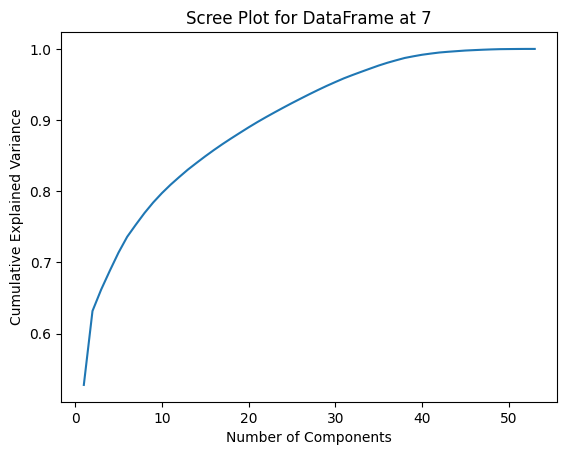

PCA for DataFrame at 8
[0.43674129 0.60145253 0.68630561 0.71478408 0.74112464 0.76212916
 0.7812771  0.79588953 0.80989992 0.82184349 0.8329853  0.84368898
 0.85328082 0.86234831 0.87053081 0.87810265 0.88550921 0.89233489
 0.89891757 0.90520971 0.91121151 0.91704245 0.92271058 0.92827625
 0.93362795 0.9387633  0.9438186  0.94872174 0.95358726 0.95833836
 0.96280083 0.96690356 0.97073041 0.97447619 0.97806661 0.98161515
 0.98484289 0.98769456 0.99042191 0.99237619 0.99416121 0.99568372
 0.99669738 0.99742976 0.99815075 0.99862948 0.99908223 0.99946044
 0.99974418 0.99985597 0.99993207 1.         1.        ]
dimension :  20


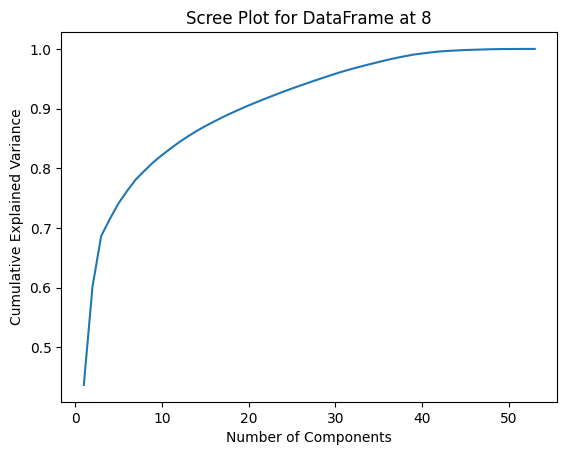

PCA for DataFrame at 9
[0.38964926 0.53905183 0.60499277 0.64273243 0.67331963 0.69346739
 0.7120428  0.7272418  0.74121756 0.75418594 0.76619255 0.77692958
 0.78739772 0.79710626 0.80656125 0.81539243 0.82361229 0.83142278
 0.83890828 0.84598683 0.85285599 0.85956694 0.86601952 0.872067
 0.87797097 0.88370239 0.88931693 0.89483528 0.90028258 0.90560243
 0.91077639 0.91585641 0.92078068 0.9256378  0.93044253 0.93500284
 0.93929025 0.9435426  0.94764729 0.95167533 0.95563168 0.95944087
 0.96301718 0.96652586 0.96989122 0.97317005 0.97641524 0.97949511
 0.98227608 0.98489074 0.98723642 0.98891381 0.99052619 0.99200928
 0.99332969 0.99450011 0.99545813 0.99614091 0.99677919 0.99735699
 0.99782982 0.99827336 0.99868032 0.9990173  0.99922499 0.99941817
 0.99957926 0.99972416 0.99981587 0.99989737 0.99996308 0.99998808
 1.         1.        ]
dimension :  29


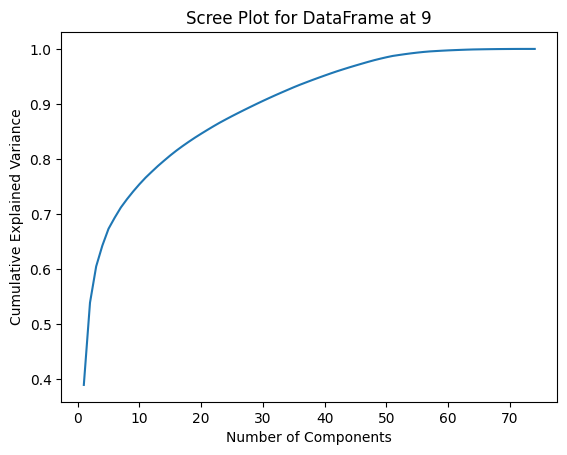

PCA for DataFrame at 10
[0.99999895 0.99999936 0.99999952 0.99999959 0.99999963 0.99999966
 0.99999968 0.9999997  0.99999972 0.99999973 0.99999975 0.99999976
 0.99999977 0.99999978 0.99999979 0.9999998  0.99999981 0.99999982
 0.99999983 0.99999984 0.99999984 0.99999985 0.99999986 0.99999986
 0.99999987 0.99999988 0.99999988 0.99999989 0.99999989 0.9999999
 0.99999991 0.99999991 0.99999992 0.99999992 0.99999993 0.99999993
 0.99999994 0.99999994 0.99999994 0.99999995 0.99999995 0.99999996
 0.99999996 0.99999997 0.99999997 0.99999997 0.99999998 0.99999998
 0.99999998 0.99999998 0.99999999 0.99999999 0.99999999 0.99999999
 0.99999999 0.99999999 1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.        ]
dimension :  1


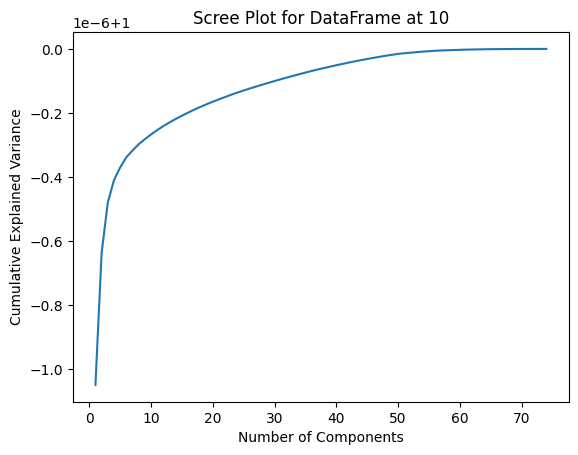

PCA for DataFrame at 11
[0.99999894 0.99999936 0.99999951 0.99999958 0.99999962 0.99999966
 0.99999968 0.9999997  0.99999971 0.99999973 0.99999974 0.99999975
 0.99999976 0.99999978 0.99999979 0.9999998  0.99999981 0.99999981
 0.99999982 0.99999983 0.99999984 0.99999985 0.99999985 0.99999986
 0.99999987 0.99999987 0.99999988 0.99999988 0.99999989 0.9999999
 0.9999999  0.99999991 0.99999991 0.99999992 0.99999992 0.99999993
 0.99999993 0.99999994 0.99999994 0.99999995 0.99999995 0.99999995
 0.99999996 0.99999996 0.99999997 0.99999997 0.99999997 0.99999998
 0.99999998 0.99999998 0.99999998 0.99999999 0.99999999 0.99999999
 0.99999999 0.99999999 0.99999999 1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.        ]
dimension :  1


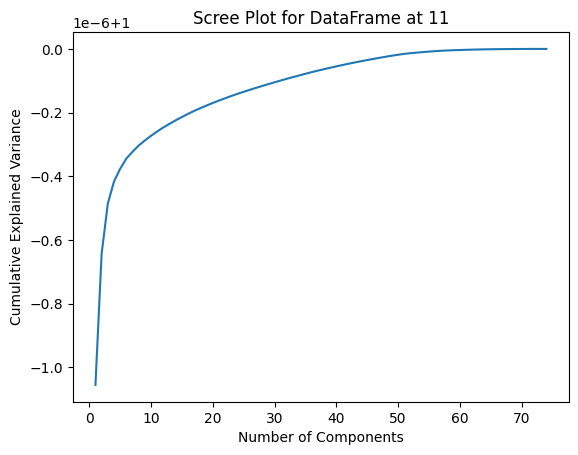

PCA for DataFrame at 12
[0.16275721 0.24580878 0.31104501 0.35306226 0.39297967 0.42720987
 0.4563693  0.48459042 0.51241133 0.53636984 0.55940132 0.58100925
 0.60130655 0.62077217 0.63929601 0.65691117 0.67282917 0.68867153
 0.70372816 0.7181364  0.73236826 0.74613632 0.75957038 0.7727795
 0.78546368 0.7977429  0.80949238 0.82115414 0.83267051 0.8439987
 0.85478847 0.86470091 0.87442556 0.88393228 0.89331277 0.90230414
 0.91114564 0.91983189 0.92800355 0.93584301 0.94347616 0.95057246
 0.95708554 0.963277   0.96921596 0.97450674 0.97905293 0.98282422
 0.98592105 0.9886438  0.99079753 0.99231098 0.99374637 0.99501217
 0.99601019 0.99692574 0.99770311 0.99820621 0.99867543 0.99910692
 0.99943589 0.99962615 0.9997847  0.9999275  0.99997177 0.99999749
 1.         1.        ]
dimension :  36


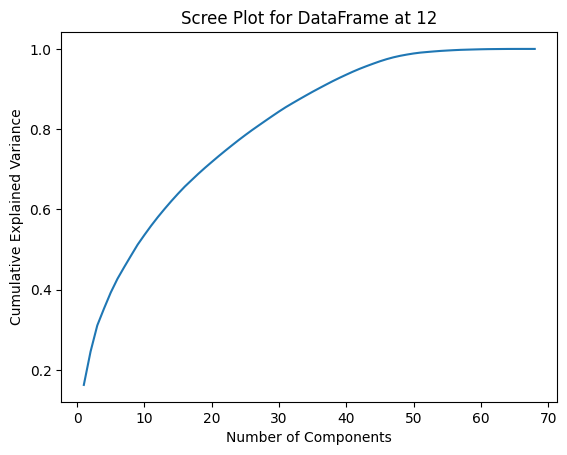

PCA for DataFrame at 13
[0.40256478 0.55805675 0.62586969 0.66384194 0.69271637 0.71269952
 0.73133129 0.74625212 0.75997609 0.77296857 0.78431049 0.79510549
 0.80534155 0.81494751 0.82403995 0.83251676 0.84077883 0.84840582
 0.85587007 0.86306894 0.86986911 0.87636701 0.88276639 0.88908231
 0.89505432 0.90093457 0.90672839 0.91227876 0.91775148 0.92309122
 0.92836264 0.93345826 0.93849923 0.94324268 0.94782175 0.95226981
 0.95646999 0.96058515 0.9645008  0.96834083 0.97199148 0.97533714
 0.97839235 0.98129834 0.98409939 0.98656502 0.98867192 0.99044602
 0.99202726 0.99344736 0.99469597 0.99570407 0.99640909 0.99708026
 0.99767694 0.99813956 0.99856539 0.99893042 0.99916557 0.99939239
 0.99960263 0.99975662 0.99984537 0.99991978 0.99998681 0.99999888
 1.         1.        ]
dimension :  26


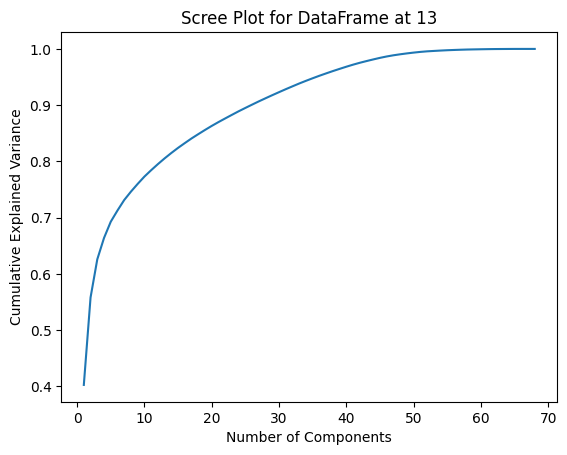

PCA for DataFrame at 14
[0.99999899 0.99999939 0.99999955 0.99999962 0.99999965 0.99999968
 0.9999997  0.99999972 0.99999974 0.99999975 0.99999977 0.99999978
 0.99999979 0.9999998  0.99999981 0.99999982 0.99999983 0.99999984
 0.99999985 0.99999985 0.99999986 0.99999987 0.99999988 0.99999988
 0.99999989 0.99999989 0.9999999  0.99999991 0.99999991 0.99999992
 0.99999992 0.99999993 0.99999993 0.99999994 0.99999994 0.99999995
 0.99999995 0.99999996 0.99999996 0.99999996 0.99999997 0.99999997
 0.99999998 0.99999998 0.99999998 0.99999998 0.99999999 0.99999999
 0.99999999 0.99999999 0.99999999 0.99999999 1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.        ]
dimension :  1


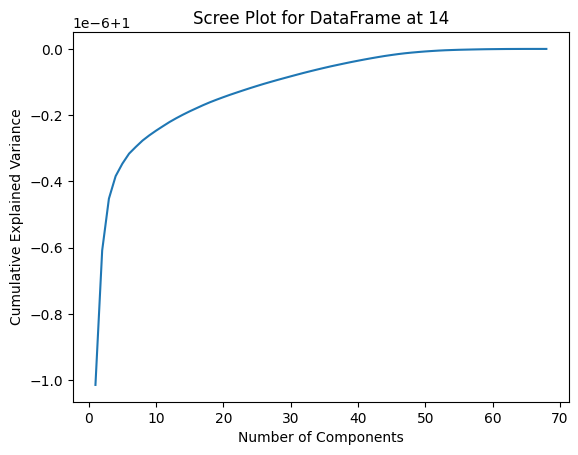

PCA for DataFrame at 15
[0.19720236 0.28046149 0.34640128 0.38787331 0.4259914  0.45876874
 0.48885562 0.51749522 0.54399598 0.56693036 0.58960372 0.61029448
 0.63007994 0.64843269 0.66616647 0.6828869  0.69845623 0.71358656
 0.72801446 0.74211481 0.7554688  0.76848969 0.78068959 0.79277267
 0.80437574 0.81585073 0.82722868 0.83793899 0.84844601 0.85873459
 0.86885949 0.87836274 0.88779526 0.89703319 0.90602589 0.91463088
 0.92254234 0.93037469 0.93792581 0.94528927 0.95245976 0.9589334
 0.96522587 0.97110804 0.97672798 0.98117745 0.98456508 0.98761325
 0.99037591 0.99194276 0.99339315 0.99481831 0.99577089 0.99666639
 0.99743147 0.99800088 0.99847736 0.99891905 0.99925999 0.99955302
 0.99977433 0.99991092 0.9999713  1.         1.        ]
dimension :  35


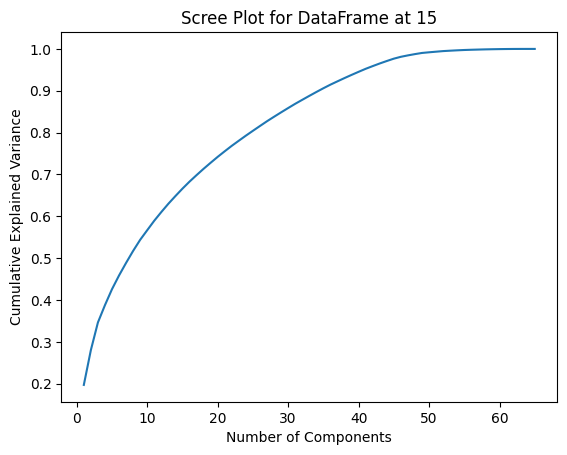

PCA for DataFrame at 16
[0.41432847 0.56978385 0.65207555 0.68507535 0.70871177 0.72911469
 0.7470435  0.76172245 0.77551999 0.78819594 0.79900612 0.80940175
 0.81889711 0.82797421 0.83614237 0.84407707 0.85168439 0.85905274
 0.86609163 0.87294792 0.87942642 0.88561581 0.8915073  0.89728184
 0.90302463 0.90852365 0.9138792  0.91914931 0.92434049 0.92926505
 0.93412117 0.93893869 0.94365773 0.94806754 0.9523941  0.95659866
 0.96061753 0.96432542 0.96800333 0.97152995 0.9749933  0.97833656
 0.98134988 0.98432496 0.98691205 0.98874763 0.99042757 0.99204337
 0.99355605 0.99484889 0.99585845 0.9965469  0.99722465 0.99777097
 0.99821942 0.99863886 0.99899471 0.99926195 0.99949647 0.99971179
 0.99981813 0.9999228  0.99998675 1.         1.        ]
dimension :  25


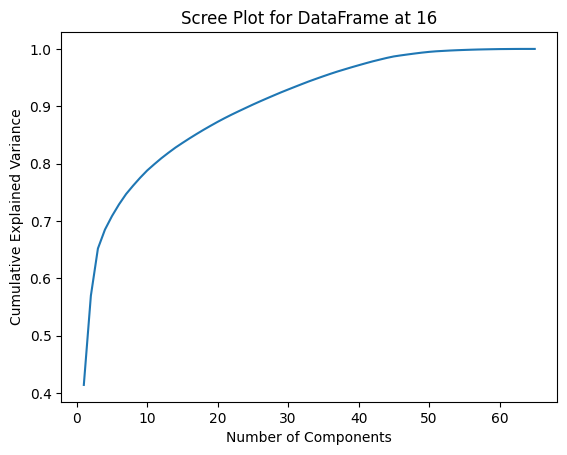

PCA for DataFrame at 17
[0.40378182 0.55559318 0.63567977 0.67200686 0.70225969 0.72236076
 0.74100643 0.75575756 0.76975462 0.78263385 0.79431686 0.80470307
 0.81472307 0.82403718 0.83316238 0.84172912 0.84948937 0.85698521
 0.8641811  0.87102489 0.87772968 0.88392939 0.88995963 0.89559296
 0.90114317 0.90656209 0.91187135 0.9170707  0.92216307 0.92704801
 0.93184726 0.93653764 0.9411309  0.94561661 0.94995795 0.95413894
 0.95819979 0.96204419 0.96565289 0.96908508 0.97240728 0.97567117
 0.97863446 0.98137208 0.98396638 0.98652865 0.9887615  0.9905502
 0.99217368 0.99361702 0.99470536 0.99573403 0.99648959 0.9971571
 0.99781454 0.99828623 0.99870941 0.99911146 0.99945809 0.99971876
 0.99982262 0.99992467 0.99998707 1.         1.        ]
dimension :  25


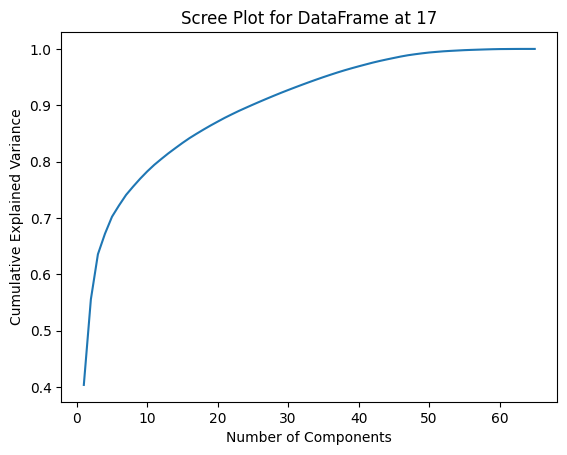

PCA for DataFrame at 18
[0.99999894 0.99999936 0.99999951 0.99999958 0.99999962 0.99999966
 0.99999968 0.9999997  0.99999971 0.99999973 0.99999974 0.99999975
 0.99999976 0.99999978 0.99999979 0.9999998  0.99999981 0.99999981
 0.99999982 0.99999983 0.99999984 0.99999985 0.99999985 0.99999986
 0.99999987 0.99999987 0.99999988 0.99999988 0.99999989 0.9999999
 0.9999999  0.99999991 0.99999991 0.99999992 0.99999992 0.99999993
 0.99999993 0.99999994 0.99999994 0.99999995 0.99999995 0.99999995
 0.99999996 0.99999996 0.99999997 0.99999997 0.99999997 0.99999998
 0.99999998 0.99999998 0.99999998 0.99999999 0.99999999 0.99999999
 0.99999999 0.99999999 0.99999999 1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]
dimension :  1


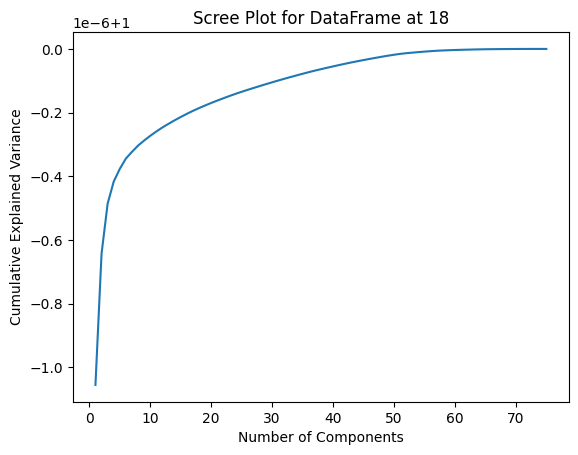

PCA for DataFrame at 19
[0.99999894 0.99999936 0.99999951 0.99999958 0.99999962 0.99999966
 0.99999968 0.9999997  0.99999971 0.99999973 0.99999974 0.99999975
 0.99999976 0.99999978 0.99999979 0.9999998  0.99999981 0.99999981
 0.99999982 0.99999983 0.99999984 0.99999985 0.99999985 0.99999986
 0.99999987 0.99999987 0.99999988 0.99999988 0.99999989 0.9999999
 0.9999999  0.99999991 0.99999991 0.99999992 0.99999992 0.99999993
 0.99999993 0.99999994 0.99999994 0.99999995 0.99999995 0.99999995
 0.99999996 0.99999996 0.99999997 0.99999997 0.99999997 0.99999998
 0.99999998 0.99999998 0.99999998 0.99999999 0.99999999 0.99999999
 0.99999999 0.99999999 0.99999999 1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]
dimension :  1


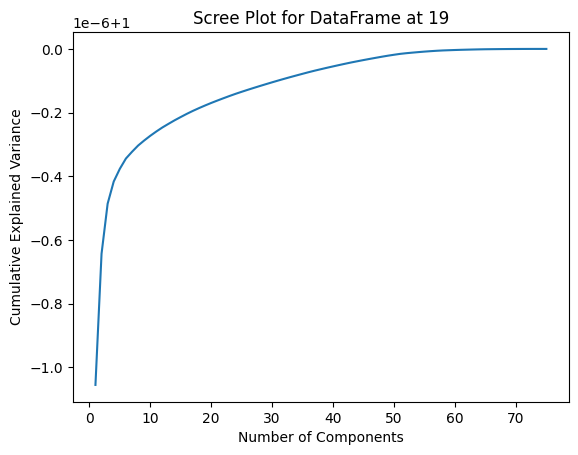

PCA for DataFrame at 20
[0.99999894 0.99999936 0.99999951 0.99999958 0.99999962 0.99999966
 0.99999968 0.9999997  0.99999971 0.99999973 0.99999974 0.99999975
 0.99999976 0.99999978 0.99999979 0.9999998  0.99999981 0.99999981
 0.99999982 0.99999983 0.99999984 0.99999985 0.99999985 0.99999986
 0.99999987 0.99999987 0.99999988 0.99999988 0.99999989 0.9999999
 0.9999999  0.99999991 0.99999991 0.99999992 0.99999992 0.99999993
 0.99999993 0.99999994 0.99999994 0.99999995 0.99999995 0.99999995
 0.99999996 0.99999996 0.99999997 0.99999997 0.99999997 0.99999998
 0.99999998 0.99999998 0.99999998 0.99999999 0.99999999 0.99999999
 0.99999999 0.99999999 0.99999999 1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]
dimension :  1


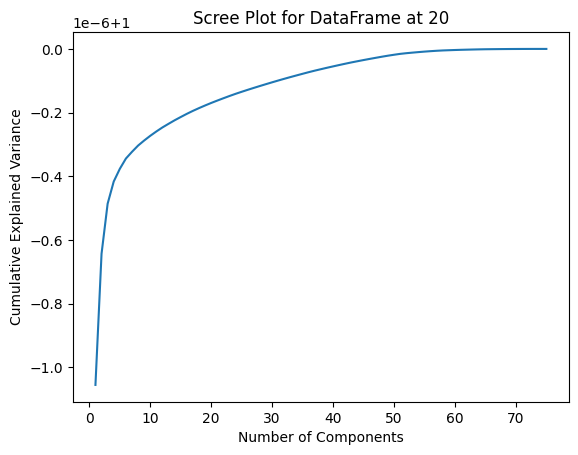

PCA for DataFrame at 21
[0.16005914 0.24347913 0.30871706 0.35003637 0.39085601 0.42478789
 0.45440445 0.48215709 0.50957014 0.53360354 0.55654567 0.57785749
 0.59783102 0.61710301 0.63533585 0.6526698  0.66870252 0.68428775
 0.69909737 0.71366645 0.72767224 0.74135548 0.75471553 0.76773393
 0.78032662 0.79242384 0.80401168 0.81548023 0.82681002 0.83805644
 0.84868992 0.85863897 0.86820281 0.87774207 0.88708569 0.89595044
 0.9047508  0.91331944 0.92138176 0.9291697  0.93677511 0.94413356
 0.95110506 0.95750794 0.96363996 0.96948052 0.97467983 0.9783904
 0.98198701 0.98490789 0.98759016 0.9896944  0.99118262 0.99259328
 0.99394024 0.99510782 0.99608775 0.99698743 0.9977517  0.99824628
 0.99870409 0.99912768 0.99944622 0.99963271 0.99978851 0.99992891
 0.99997242 0.99999765 1.         1.        ]
dimension :  37


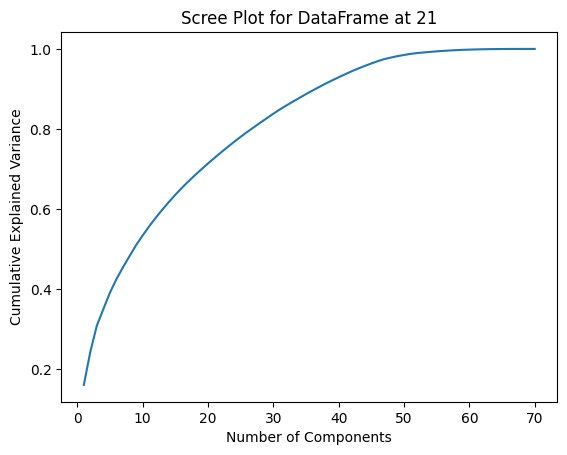

PCA for DataFrame at 22
[0.39970632 0.55404921 0.62133959 0.65902671 0.68787407 0.70770775
 0.72619822 0.74130449 0.7549473  0.76784126 0.77912512 0.79005344
 0.80022684 0.8098799  0.81919518 0.82786127 0.83623012 0.84383086
 0.85124195 0.85853752 0.86542167 0.87204635 0.87839847 0.8846659
 0.89059316 0.89644405 0.90226811 0.90785247 0.91329026 0.91864973
 0.92393067 0.92899587 0.93403306 0.93875592 0.94333677 0.94777311
 0.95214854 0.95625618 0.96034024 0.96421789 0.96802753 0.97164738
 0.97496456 0.97799701 0.98090938 0.98371898 0.986176   0.98827544
 0.99003525 0.99160441 0.99301829 0.99425709 0.99525771 0.99595696
 0.99662289 0.99720532 0.99769955 0.99815823 0.99858017 0.9989421
 0.99917511 0.99939837 0.99960627 0.99975884 0.99984668 0.99992049
 0.99998699 0.99999894 1.         1.        ]
dimension :  27


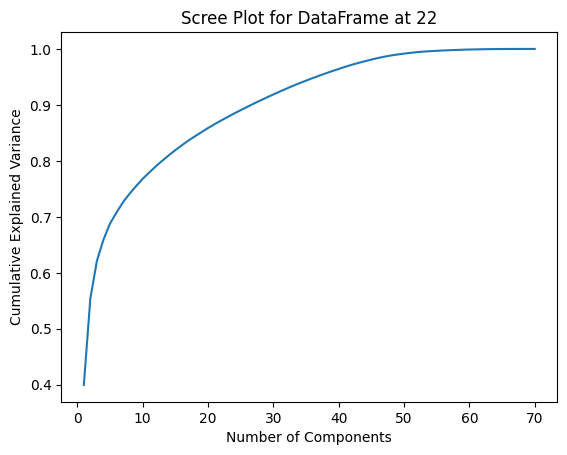

PCA for DataFrame at 23
[0.99999898 0.99999938 0.99999954 0.99999961 0.99999964 0.99999967
 0.99999969 0.99999971 0.99999973 0.99999974 0.99999976 0.99999977
 0.99999978 0.99999979 0.9999998  0.99999981 0.99999982 0.99999983
 0.99999984 0.99999985 0.99999985 0.99999986 0.99999987 0.99999987
 0.99999988 0.99999989 0.99999989 0.9999999  0.9999999  0.99999991
 0.99999991 0.99999992 0.99999993 0.99999993 0.99999994 0.99999994
 0.99999994 0.99999995 0.99999995 0.99999996 0.99999996 0.99999997
 0.99999997 0.99999997 0.99999998 0.99999998 0.99999998 0.99999998
 0.99999999 0.99999999 0.99999999 0.99999999 0.99999999 0.99999999
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]
dimension :  1


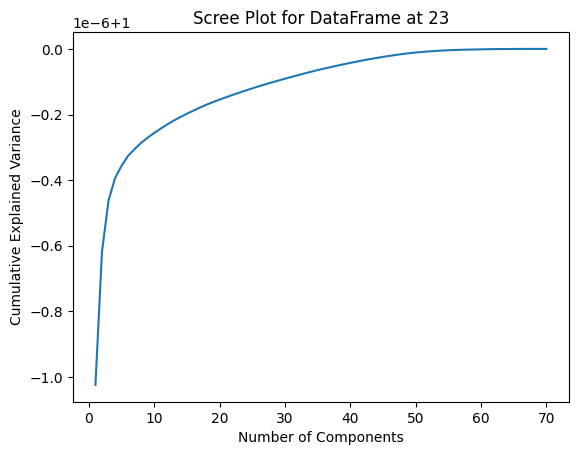

PCA for DataFrame at 24
[0.28851064 0.35386492 0.41565296 0.4673853  0.51214465 0.55467028
 0.59381037 0.62658901 0.65680582 0.68309904 0.70882718 0.73363007
 0.75657911 0.77936058 0.80209645 0.82248054 0.8424633  0.86148206
 0.87986167 0.8973057  0.91403027 0.92978562 0.94317498 0.95609558
 0.96769594 0.97752782 0.98444365 0.98779947 0.99064505 0.99325191
 0.99503169 0.99669233 0.99806906 0.99912655 1.         1.        ]
dimension :  21


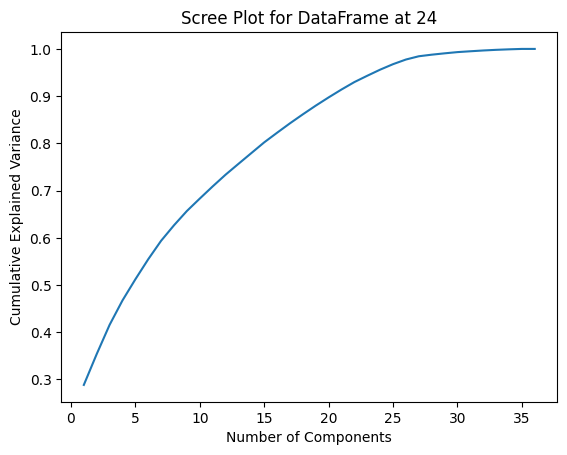

PCA for DataFrame at 25
[0.22618756 0.30785577 0.36233619 0.40843606 0.44977075 0.48461365
 0.5184933  0.54915814 0.57505104 0.59910556 0.62225439 0.64311477
 0.6632669  0.68166088 0.69968674 0.7170856  0.73424721 0.75023401
 0.76555899 0.78074904 0.79524113 0.8093289  0.82279859 0.83597456
 0.84869845 0.86098957 0.87304115 0.88493764 0.896211   0.90707303
 0.91762381 0.92736055 0.93647202 0.94512824 0.95351643 0.96103999
 0.96817831 0.97484423 0.97946482 0.98350396 0.98708354 0.98994543
 0.99196922 0.99377767 0.99546557 0.99658555 0.99764386 0.99853637
 0.99919985 0.9995412  0.99980728 0.99996635 1.         1.        ]
dimension :  30


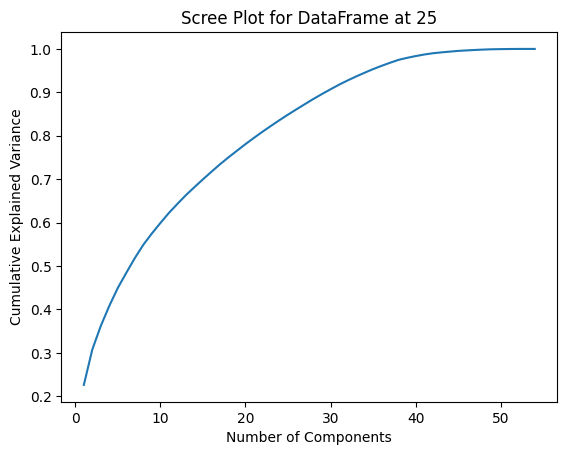

PCA for DataFrame at 26
[0.39228188 0.54266927 0.60905375 0.64675383 0.67717187 0.69735337
 0.71600757 0.73116144 0.74520368 0.75823626 0.77032047 0.78109768
 0.79136767 0.80094568 0.81020406 0.81899005 0.82726452 0.83512081
 0.84265678 0.84976124 0.85667673 0.86341171 0.86989935 0.8759824
 0.88189828 0.88755515 0.89317498 0.89871166 0.9040925  0.90940995
 0.91452429 0.91948291 0.9244016  0.92926478 0.93398215 0.93842458
 0.94273911 0.94695565 0.9510647  0.95508394 0.95895064 0.96267774
 0.96627812 0.96966965 0.97297103 0.97623864 0.97934198 0.98214295
 0.98477646 0.98713803 0.98882699 0.99046062 0.99197121 0.9933017
 0.9944811  0.99544571 0.99613336 0.99677598 0.99735768 0.99783371
 0.9982804  0.99869639 0.99903577 0.99924487 0.99943939 0.99960158
 0.99974745 0.99983979 0.99992184 0.999988   1.         1.        ]
dimension :  29


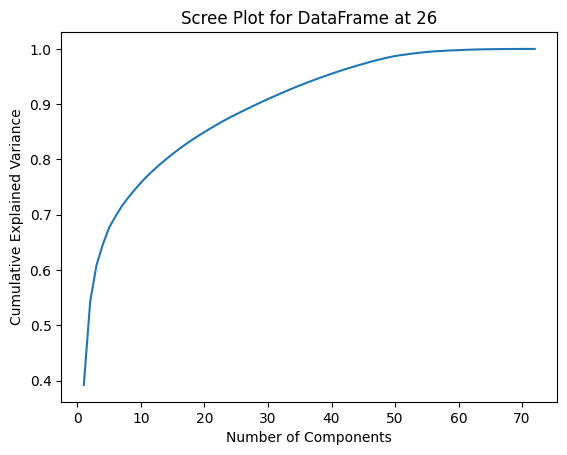

PCA for DataFrame at 27
[0.99999894 0.99999936 0.99999951 0.99999958 0.99999962 0.99999966
 0.99999968 0.9999997  0.99999971 0.99999973 0.99999974 0.99999975
 0.99999976 0.99999978 0.99999979 0.9999998  0.99999981 0.99999981
 0.99999982 0.99999983 0.99999984 0.99999985 0.99999985 0.99999986
 0.99999987 0.99999987 0.99999988 0.99999988 0.99999989 0.9999999
 0.9999999  0.99999991 0.99999991 0.99999992 0.99999992 0.99999993
 0.99999993 0.99999994 0.99999994 0.99999995 0.99999995 0.99999995
 0.99999996 0.99999996 0.99999997 0.99999997 0.99999997 0.99999998
 0.99999998 0.99999998 0.99999998 0.99999999 0.99999999 0.99999999
 0.99999999 0.99999999 0.99999999 1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.        ]
dimension :  1


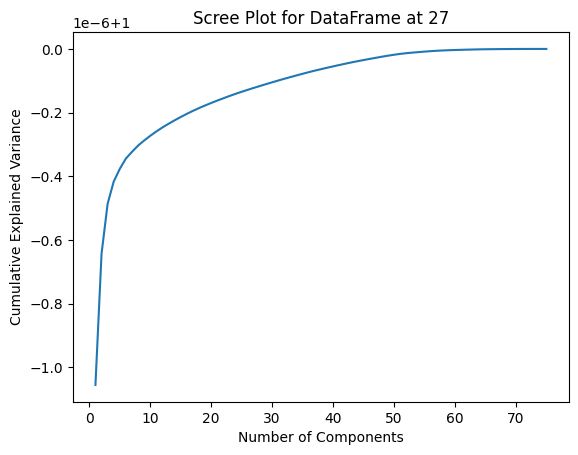

PCA for DataFrame at 28
[0.17897192 0.26755613 0.33550519 0.38100493 0.42321808 0.45906505
 0.49064079 0.52132302 0.54770832 0.57251051 0.59615871 0.61782248
 0.63781522 0.65724232 0.67540384 0.69246804 0.70914364 0.72518767
 0.74111031 0.75633568 0.77121122 0.78575724 0.7993688  0.81262966
 0.82549535 0.83824323 0.85087275 0.86294616 0.87471127 0.88587589
 0.89669715 0.9071106  0.91702234 0.92618167 0.93507231 0.94382793
 0.95171348 0.9587503  0.96534742 0.97154921 0.97732721 0.9815064
 0.98492102 0.98795949 0.99033305 0.99200895 0.99359692 0.99485071
 0.9959504  0.99696774 0.99782778 0.99838417 0.99892158 0.99942165
 0.99963483 0.99981017 0.99996813 0.99999672 1.         1.        ]
dimension :  32


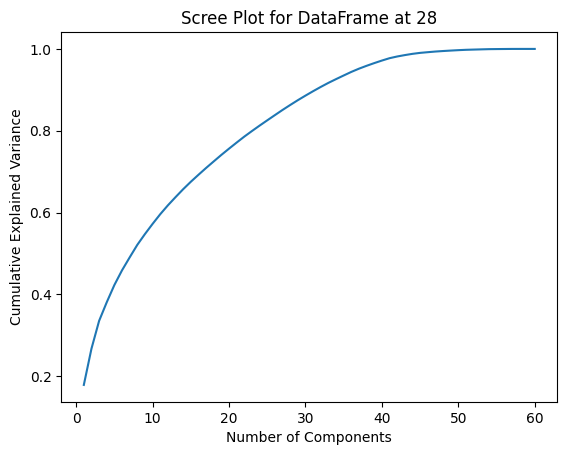

PCA for DataFrame at 29
[0.17271238 0.25795918 0.3239806  0.36808071 0.40881897 0.44433281
 0.47502556 0.50464114 0.53019201 0.55451071 0.57750729 0.59895224
 0.6190643  0.63837173 0.65622213 0.67283522 0.68925403 0.70499841
 0.72030711 0.73535934 0.74982523 0.76404806 0.77792772 0.79091134
 0.80367967 0.81605559 0.82839758 0.84043869 0.85213047 0.86365005
 0.87439887 0.88472022 0.89472477 0.90433752 0.91375897 0.92254368
 0.93106385 0.93941345 0.94700186 0.95393627 0.96058261 0.96689752
 0.97274997 0.97824466 0.98225545 0.98553006 0.98844721 0.99072657
 0.99233546 0.99385924 0.99506142 0.99611703 0.99709151 0.99791744
 0.99845176 0.99896604 0.99944476 0.99964949 0.99981793 0.99996962
 0.99999705 1.         1.        ]
dimension :  34


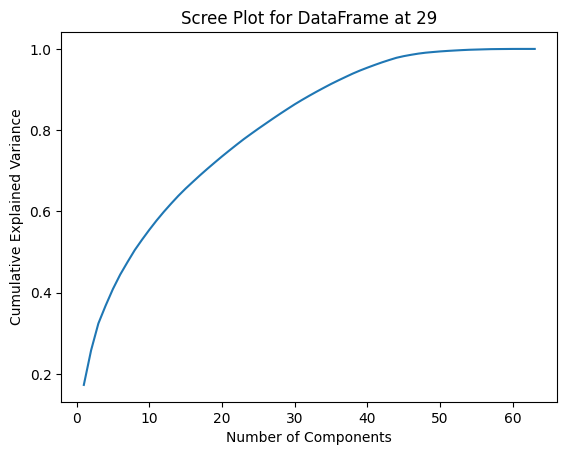

In [596]:
# Iterate over list of dataframes
for i in range(len(df_list_with_pca)):
  conduct_PCA(df_list_with_pca[i], i)

In [597]:
  '''# Print PCA Loading
print(pca.components_)'''

'# Print PCA Loading\nprint(pca.components_)'

In [598]:
'''# Analyze feature contributions to principal components
print("\nTop feature contributions to principal components:")
# Change component_names to reflect the number of components
component_names = [f"PC{i+1}" for i in range(pca.n_components_)]
# Now component_names will have 15 column names (PC1 to PC15)
loadings = pd.DataFrame(pca.components_.T, columns=component_names, index=df_orig.columns)'''

'# Analyze feature contributions to principal components\nprint("\nTop feature contributions to principal components:")\n# Change component_names to reflect the number of components\ncomponent_names = [f"PC{i+1}" for i in range(pca.n_components_)]\n# Now component_names will have 15 column names (PC1 to PC15)\nloadings = pd.DataFrame(pca.components_.T, columns=component_names, index=df_orig.columns)'

In [599]:
'''for i, pc in enumerate(component_names):
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    print(f"\n{pc} explains {pca.explained_variance_ratio_[i]:.2%} of variance")
    print(f"Top contributing features:")
    for j, (feature, loading) in enumerate(sorted_loadings.head(5).items()):
        sign = '+' if loadings.loc[feature, pc] > 0 else '-'
        print(f"  {j+1}. {feature}: {sign}{abs(loadings.loc[feature, pc]):.3f}")'''

'for i, pc in enumerate(component_names):\n    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)\n    print(f"\n{pc} explains {pca.explained_variance_ratio_[i]:.2%} of variance")\n    print(f"Top contributing features:")\n    for j, (feature, loading) in enumerate(sorted_loadings.head(5).items()):\n        sign = \'+\' if loadings.loc[feature, pc] > 0 else \'-\'\n        print(f"  {j+1}. {feature}: {sign}{abs(loadings.loc[feature, pc]):.3f}")'

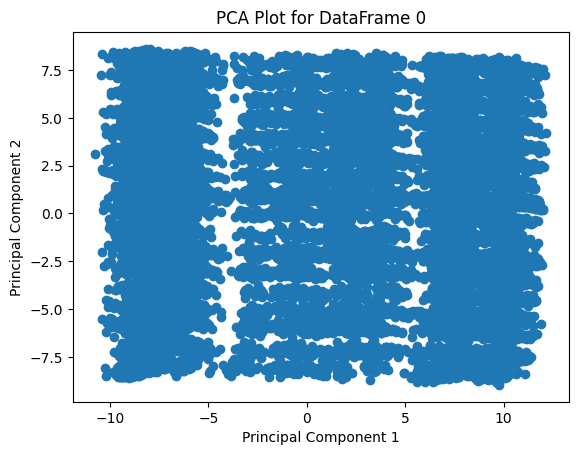

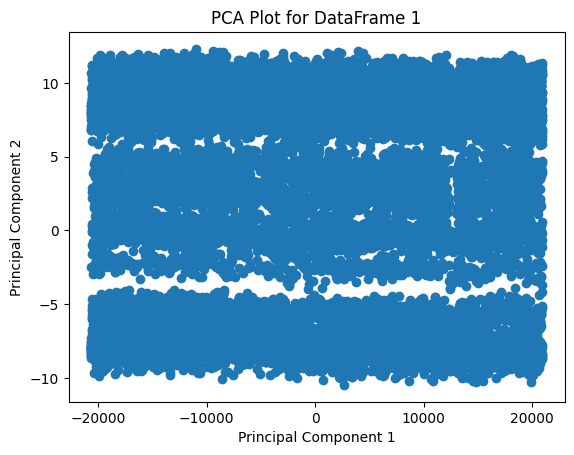

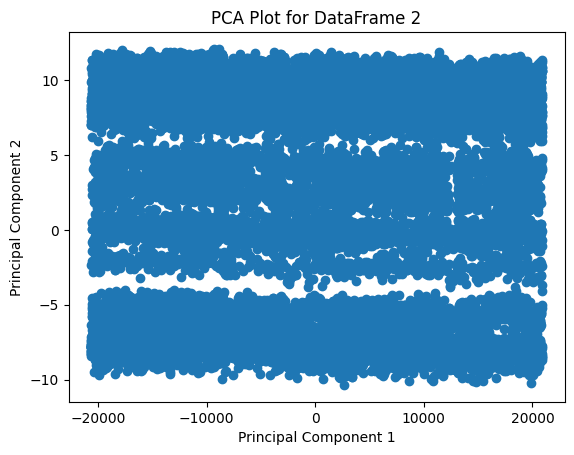

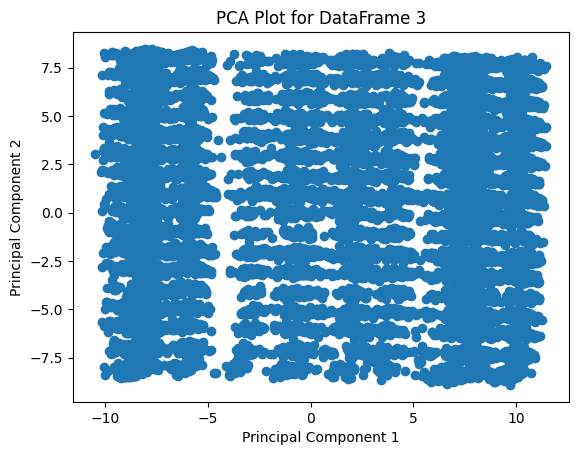

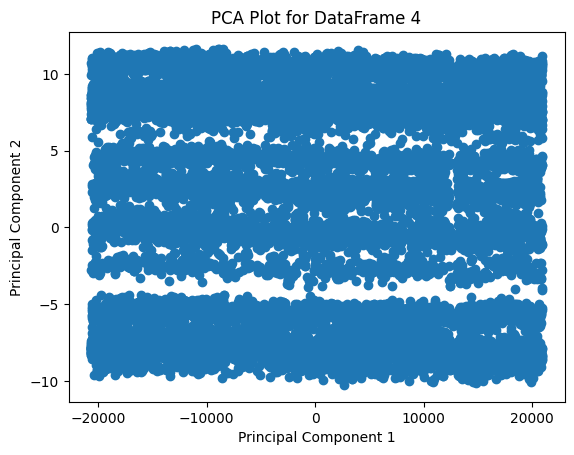

...

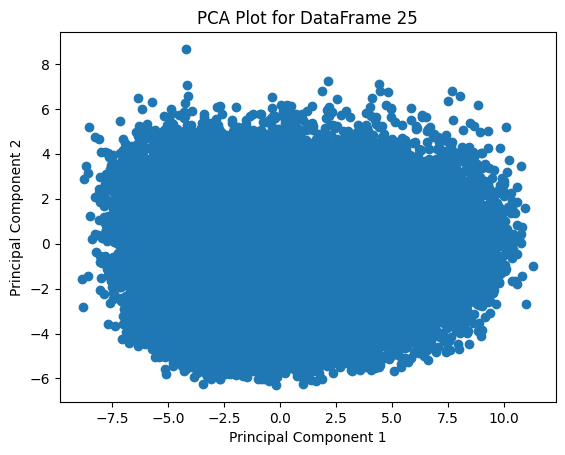

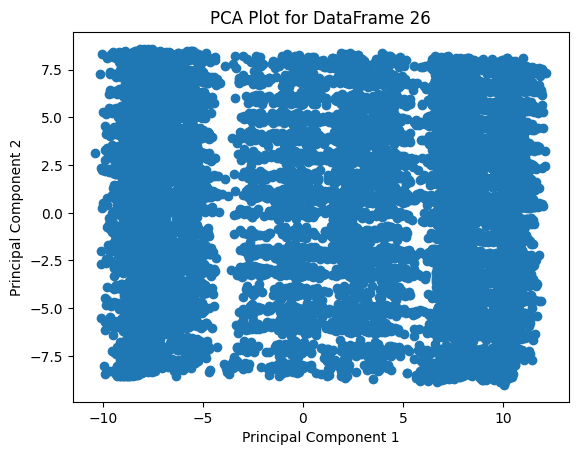

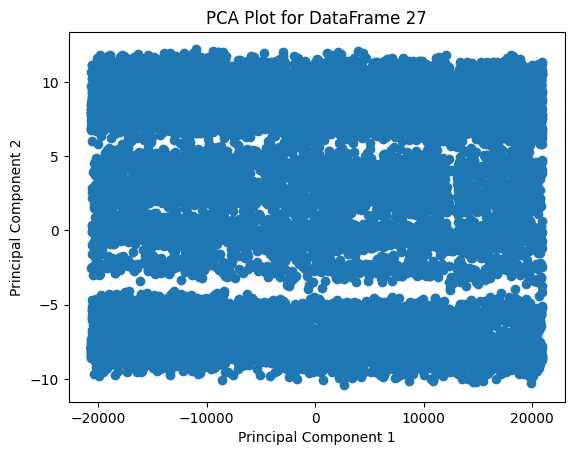

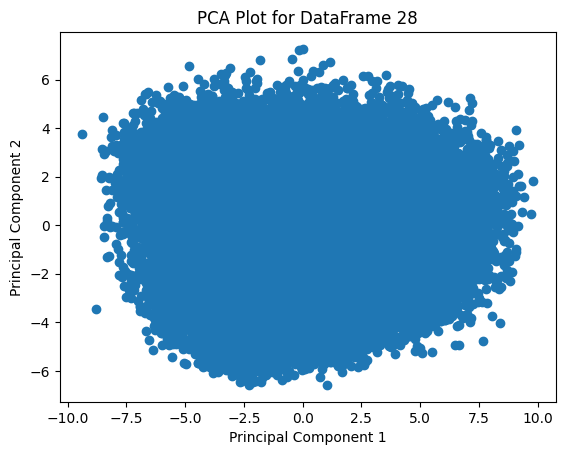

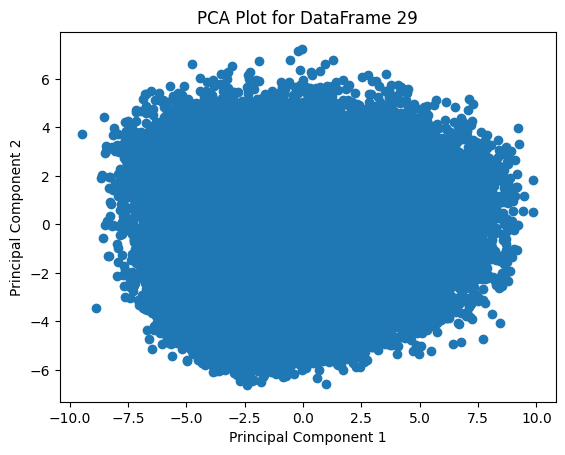

In [600]:
# Plot PCA for df_list_with_pca
for i in range(len(df_list_with_pca)):
  plt.scatter(df_list_with_pca[i][:, 0], df_list_with_pca[i][:, 1])
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.title(f'PCA Plot for DataFrame {i}')
  plt.show()

## Dataframes Plotted with 2 or 3 PCA Components:
  -

In [601]:
# Keep Possible PCA Plottable where number of columns in df_with_pca_list is 2 or 3
df_final_list_with_pca = []
for i in range(len(df_list_with_pca)):
  if df_list_with_pca[i].shape[1] in [2, 3]:
    df_final_list_with_pca.append(df_list_with_pca[i])

print(len(df_final_list_with_pca))

12


# Model Training

In [320]:
# Use Elbow Method to find optimal KMeans
from sklearn.cluster import KMeans

def elbow_method(df, index_of_df):
  wcss=[]
  sse = {}
  for i in range(1, 8):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

  # Print WCSS plot
  plt.figure(figsize=(10, 6))
  plt.plot(range(1, 8), wcss)
  plt.title(f'The elbow method for DataFrame at index {index_of_df}')
  plt.xlabel('Number of clusters')
  plt.ylabel('WCSS')
  plt.show()

For cluster = 1, SSE/WCSS is 5426021462025.11
For cluster = 2, SSE/WCSS is 1373996179828.576
For cluster = 3, SSE/WCSS is 612208622247.7339
For cluster = 4, SSE/WCSS is 345491345926.0459
For cluster = 5, SSE/WCSS is 223517464476.0305
For cluster = 6, SSE/WCSS is 155218720685.27176
For cluster = 7, SSE/WCSS is 113968747525.91328


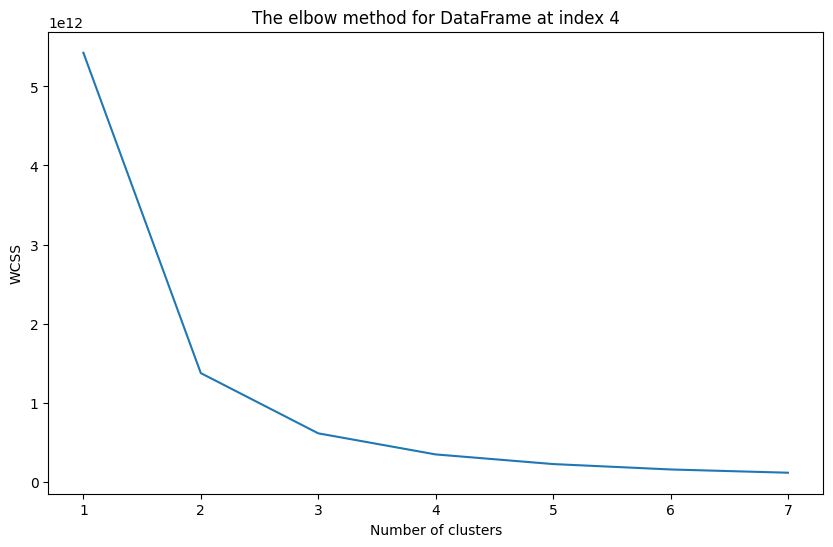

In [321]:
elbow_method(df_list_no_pca[4], 4)

For cluster = 1, SSE/WCSS is 7423614.955196904
For cluster = 2, SSE/WCSS is 5231140.499537784
For cluster = 3, SSE/WCSS is 4819120.59967709
For cluster = 4, SSE/WCSS is 4481755.221397797
For cluster = 5, SSE/WCSS is 4244973.947733608
For cluster = 6, SSE/WCSS is 4037685.7317313594
For cluster = 7, SSE/WCSS is 3954421.815106558


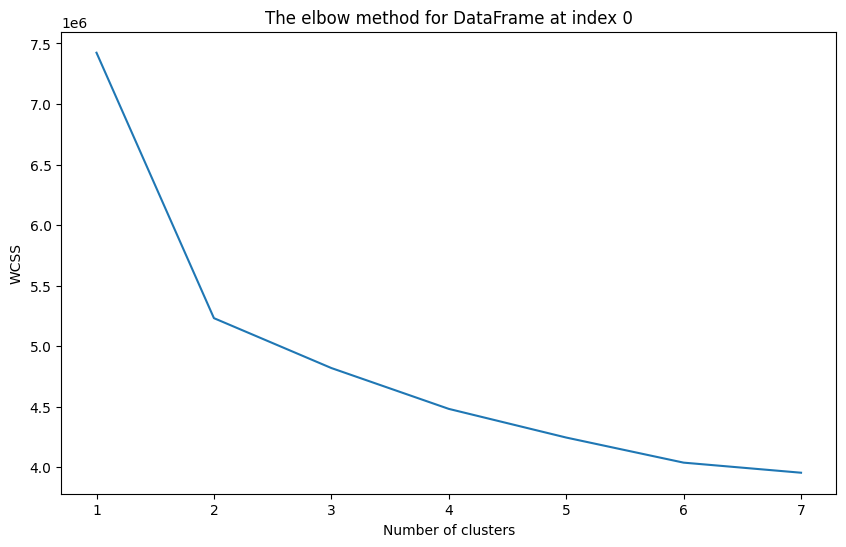

For cluster = 1, SSE/WCSS is 5426022302737.322
For cluster = 2, SSE/WCSS is 1373997019954.0056
For cluster = 3, SSE/WCSS is 612208922835.6964
For cluster = 4, SSE/WCSS is 345492184631.8837
For cluster = 5, SSE/WCSS is 223516679164.0286
For cluster = 6, SSE/WCSS is 155218535432.51334
For cluster = 7, SSE/WCSS is 113968485323.45523


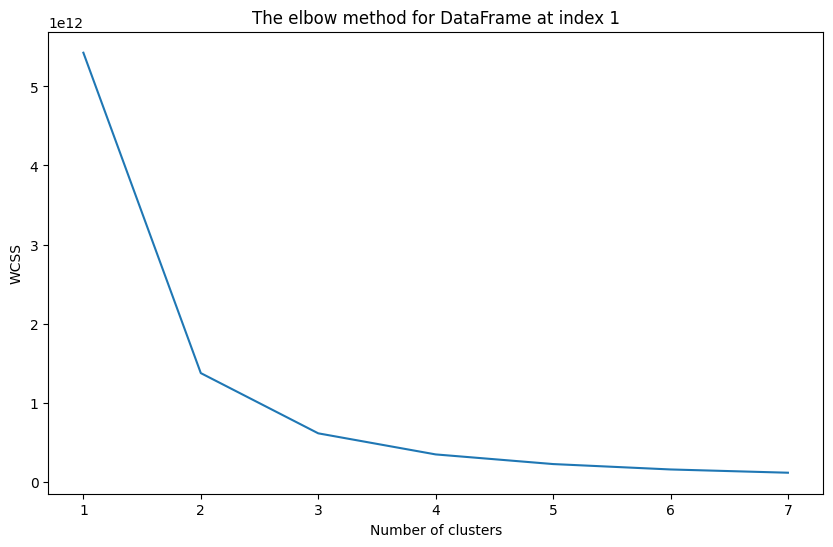

For cluster = 1, SSE/WCSS is 5263791650122.766
For cluster = 2, SSE/WCSS is 1337812810350.2344
For cluster = 3, SSE/WCSS is 597551712496.0095
For cluster = 4, SSE/WCSS is 336905045558.3917
For cluster = 5, SSE/WCSS is 218002495996.15344
For cluster = 6, SSE/WCSS is 152050059860.59818
For cluster = 7, SSE/WCSS is 111030359366.22757


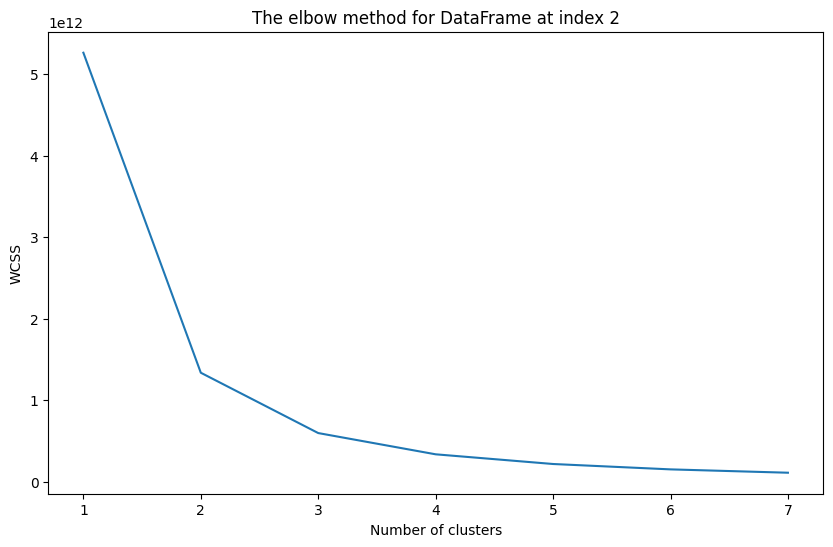

For cluster = 1, SSE/WCSS is 6514200.402842348
For cluster = 2, SSE/WCSS is 4338059.192803069
For cluster = 3, SSE/WCSS is 3928236.746988311
For cluster = 4, SSE/WCSS is 3644480.6504667187
For cluster = 5, SSE/WCSS is 3418895.987611838
For cluster = 6, SSE/WCSS is 3239914.1114430134
For cluster = 7, SSE/WCSS is 3158037.2942777406


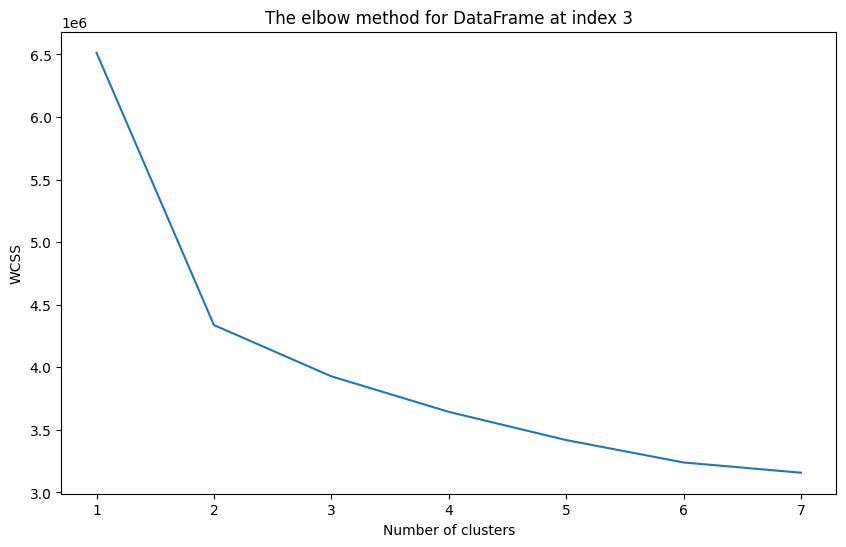

For cluster = 1, SSE/WCSS is 5426021462025.11
For cluster = 2, SSE/WCSS is 1373996179828.576
For cluster = 3, SSE/WCSS is 612208622247.7339
For cluster = 4, SSE/WCSS is 345491345926.0459
For cluster = 5, SSE/WCSS is 223517464476.0305
For cluster = 6, SSE/WCSS is 155218720685.27176
For cluster = 7, SSE/WCSS is 113968747525.91328


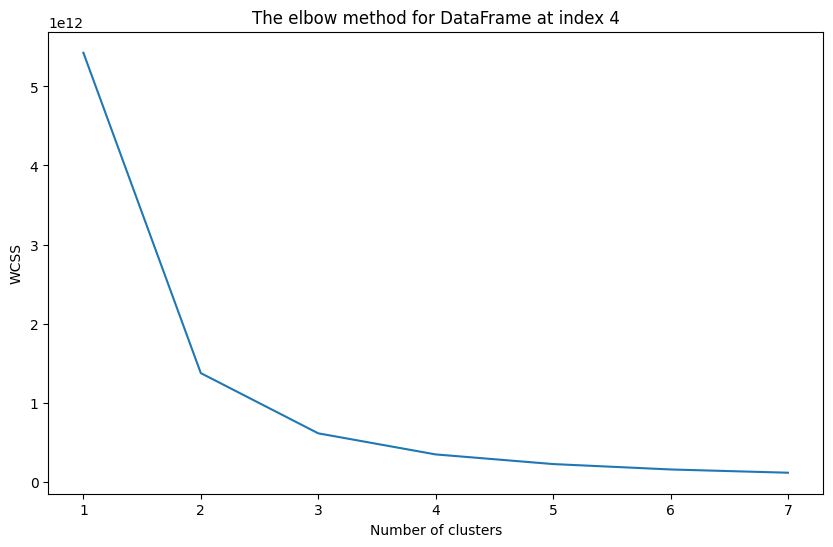

For cluster = 1, SSE/WCSS is 5263790832765.264
For cluster = 2, SSE/WCSS is 1337811993486.3186
For cluster = 3, SSE/WCSS is 597550896593.1605
For cluster = 4, SSE/WCSS is 336904430335.214
For cluster = 5, SSE/WCSS is 218002312936.14572
For cluster = 6, SSE/WCSS is 152050245010.06268
For cluster = 7, SSE/WCSS is 111030518832.36818


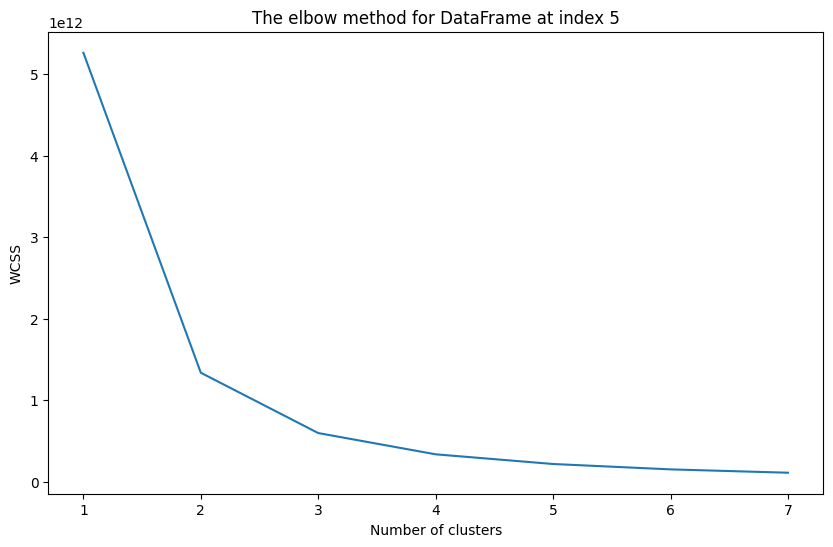

For cluster = 1, SSE/WCSS is 4889949.923906988
For cluster = 2, SSE/WCSS is 4199947.529379798
For cluster = 3, SSE/WCSS is 3715616.022895165
For cluster = 4, SSE/WCSS is 3569658.6152163465
For cluster = 5, SSE/WCSS is 3449402.4939923855
For cluster = 6, SSE/WCSS is 3348091.5031659817
For cluster = 7, SSE/WCSS is 3271089.4925338905


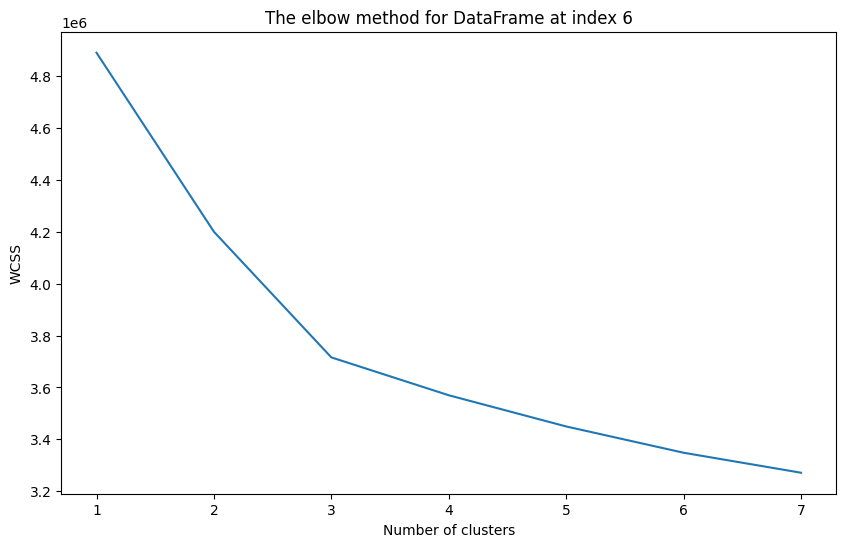

For cluster = 1, SSE/WCSS is 7260416.633096459
For cluster = 2, SSE/WCSS is 5070893.995182082
For cluster = 3, SSE/WCSS is 4660012.730292708
For cluster = 4, SSE/WCSS is 4334407.20770464
For cluster = 5, SSE/WCSS is 4104411.176154407
For cluster = 6, SSE/WCSS is 3896514.4387836163
For cluster = 7, SSE/WCSS is 3813544.150177804


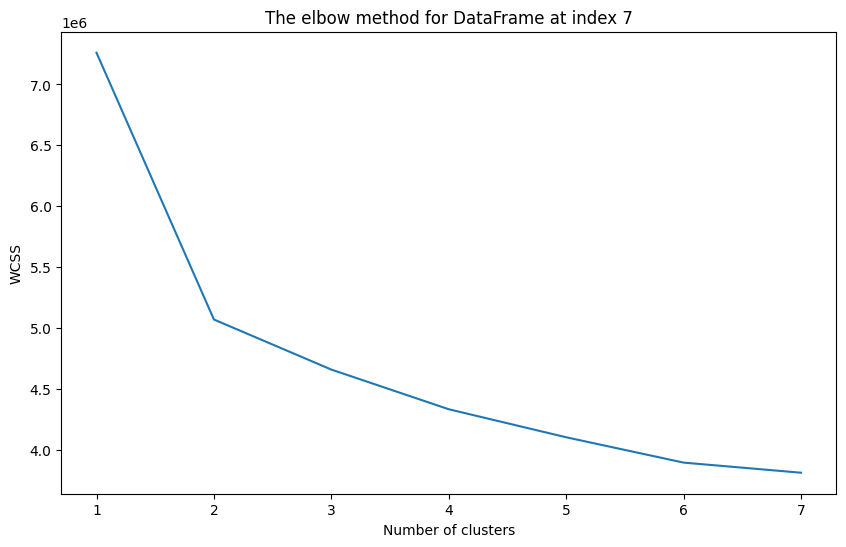

For cluster = 1, SSE/WCSS is 7298903.626978147
For cluster = 2, SSE/WCSS is 5108819.605504716
For cluster = 3, SSE/WCSS is 4697813.384093026
For cluster = 4, SSE/WCSS is 4371914.411459576
For cluster = 5, SSE/WCSS is 4142017.6984375706
For cluster = 6, SSE/WCSS is 3933778.586816107
For cluster = 7, SSE/WCSS is 3850887.096654253


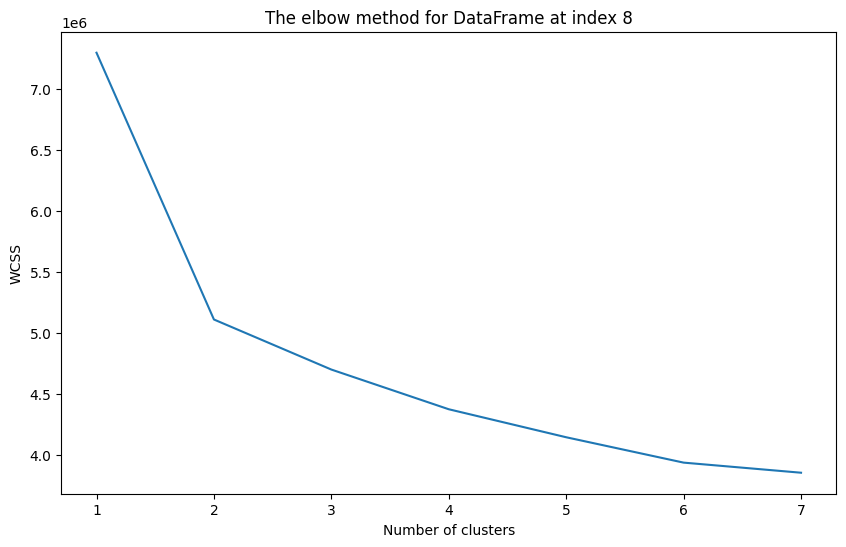

For cluster = 1, SSE/WCSS is 3033816.4381401674
For cluster = 2, SSE/WCSS is 2550029.0214090003
For cluster = 3, SSE/WCSS is 2392195.986021016
For cluster = 4, SSE/WCSS is 2289712.0655701063
For cluster = 5, SSE/WCSS is 2213738.3200108903
For cluster = 6, SSE/WCSS is 2145753.454494103
For cluster = 7, SSE/WCSS is 2096189.4038528956


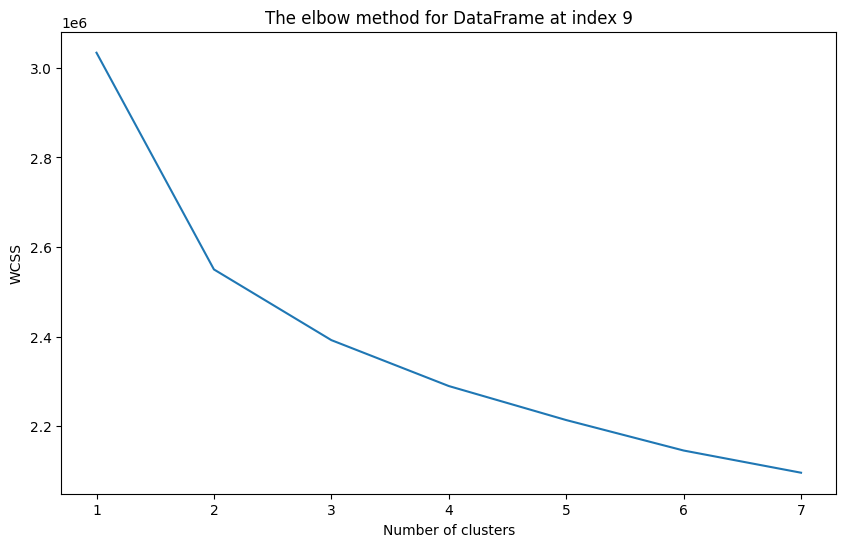

For cluster = 1, SSE/WCSS is 5342721.271469176
For cluster = 2, SSE/WCSS is 3311777.618945812
For cluster = 3, SSE/WCSS is 3055663.8750615334
For cluster = 4, SSE/WCSS is 2825303.2943931934
For cluster = 5, SSE/WCSS is 2726122.2767080106
For cluster = 6, SSE/WCSS is 2645496.026259694
For cluster = 7, SSE/WCSS is 2582935.906427638


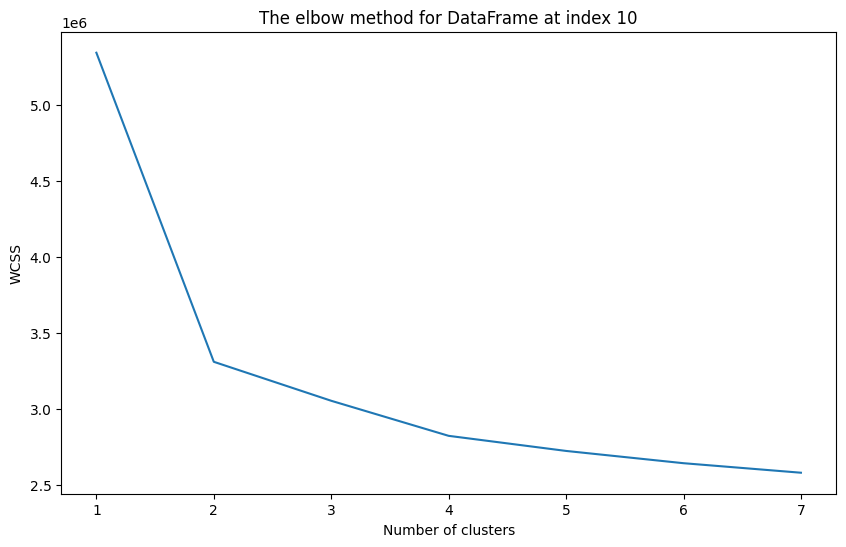

For cluster = 1, SSE/WCSS is 5426021627540.955
For cluster = 2, SSE/WCSS is 1373996345278.8853
For cluster = 3, SSE/WCSS is 612208788042.9794
For cluster = 4, SSE/WCSS is 345491512042.5081
For cluster = 5, SSE/WCSS is 223517631338.80103
For cluster = 6, SSE/WCSS is 155218887532.22452
For cluster = 7, SSE/WCSS is 113968914291.26619


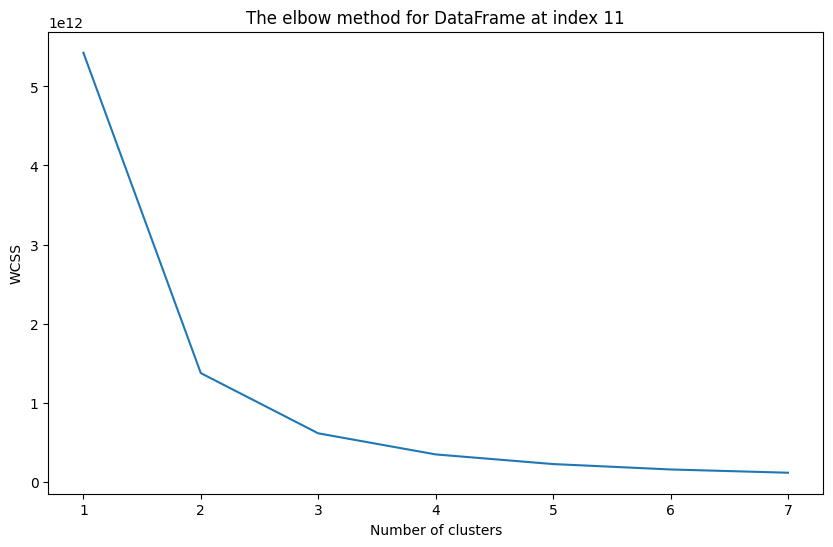

For cluster = 1, SSE/WCSS is 6649257.290965066
For cluster = 2, SSE/WCSS is 4685707.820841753
For cluster = 3, SSE/WCSS is 4297239.294580812
For cluster = 4, SSE/WCSS is 4038825.681506597
For cluster = 5, SSE/WCSS is 3847626.5736769647
For cluster = 6, SSE/WCSS is 3696092.3396117757
For cluster = 7, SSE/WCSS is 3619176.896908738


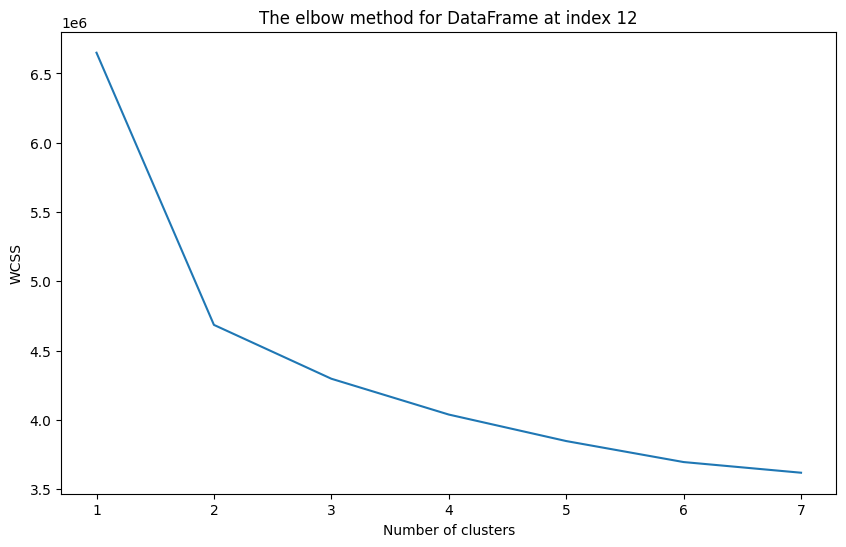

For cluster = 1, SSE/WCSS is 5263791575396.708
For cluster = 2, SSE/WCSS is 1337812735655.2231
For cluster = 3, SSE/WCSS is 597551638084.7582
For cluster = 4, SSE/WCSS is 336904971017.9616
For cluster = 5, SSE/WCSS is 218002421911.08063
For cluster = 6, SSE/WCSS is 152049985837.5294
For cluster = 7, SSE/WCSS is 111030285738.16434


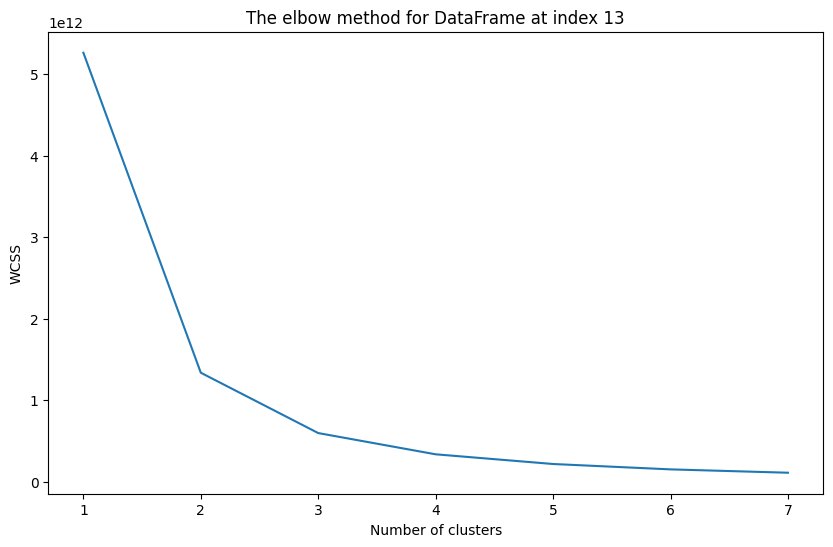

For cluster = 1, SSE/WCSS is 5263791612646.075
For cluster = 2, SSE/WCSS is 1337812772878.828
For cluster = 3, SSE/WCSS is 597551675299.5792
For cluster = 4, SSE/WCSS is 336905008233.7668
For cluster = 5, SSE/WCSS is 218002459124.63016
For cluster = 6, SSE/WCSS is 152050023046.7565
For cluster = 7, SSE/WCSS is 111030322939.01247


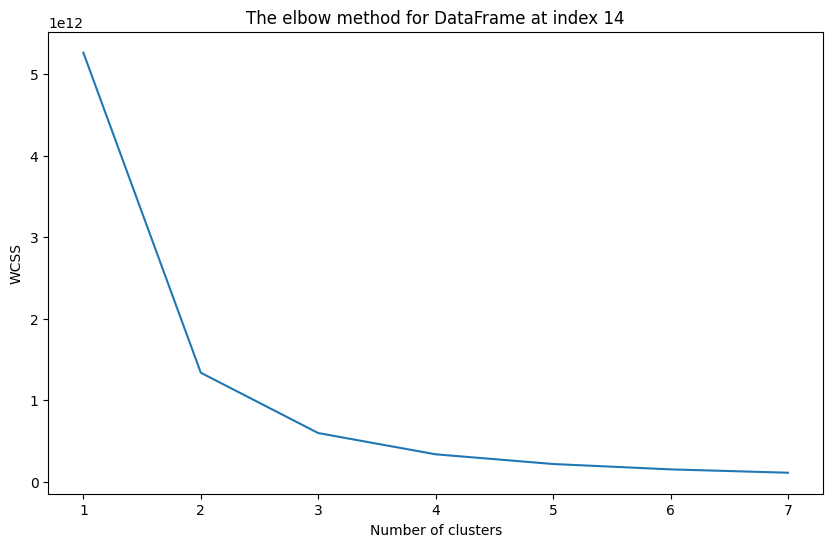

For cluster = 1, SSE/WCSS is 7382099.955196935
For cluster = 2, SSE/WCSS is 5191739.755875673
For cluster = 3, SSE/WCSS is 4780718.346269614
For cluster = 4, SSE/WCSS is 4454802.941457623
For cluster = 5, SSE/WCSS is 4224870.710683785
For cluster = 6, SSE/WCSS is 4016637.804101115
For cluster = 7, SSE/WCSS is 3933678.5761791645


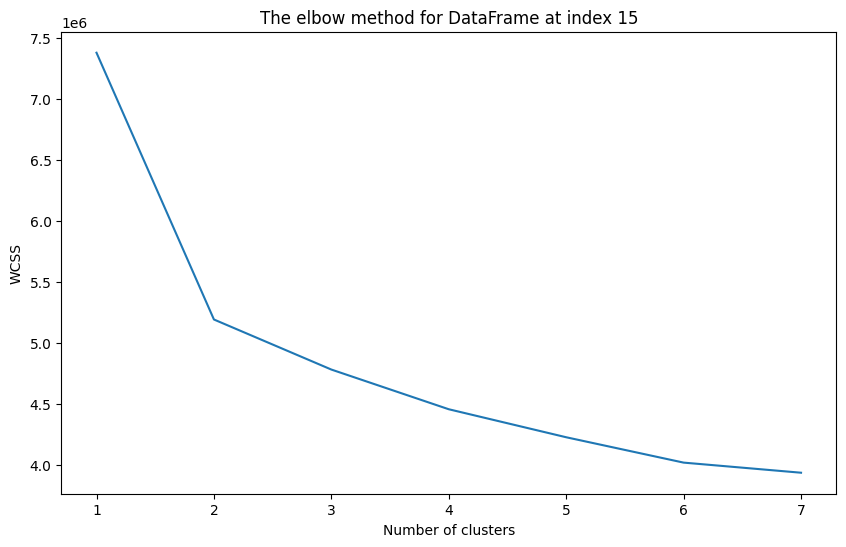

For cluster = 1, SSE/WCSS is 7382099.955196935
For cluster = 2, SSE/WCSS is 5191739.755875673
For cluster = 3, SSE/WCSS is 4780718.346269614
For cluster = 4, SSE/WCSS is 4454802.941457623
For cluster = 5, SSE/WCSS is 4224870.710683785
For cluster = 6, SSE/WCSS is 4016637.804101115
For cluster = 7, SSE/WCSS is 3933678.5761791645


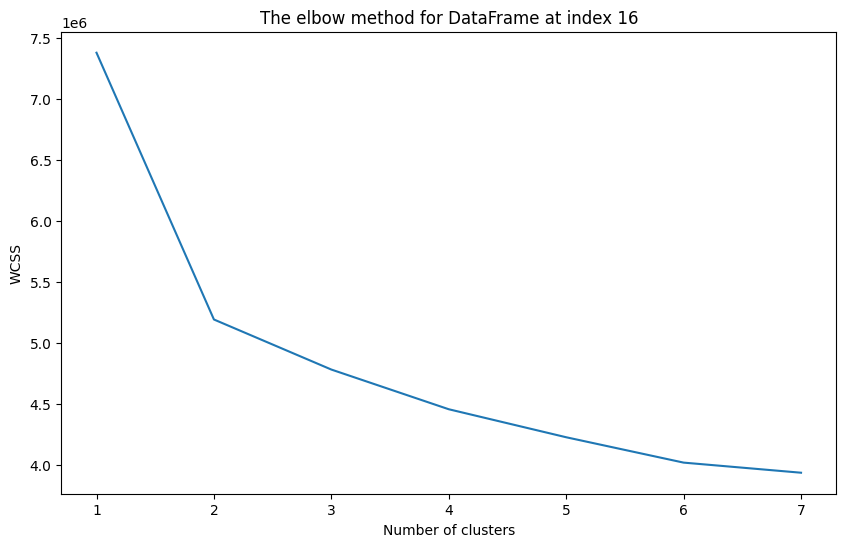

For cluster = 1, SSE/WCSS is 7382099.955196935
For cluster = 2, SSE/WCSS is 5191739.755875673
For cluster = 3, SSE/WCSS is 4780718.346269614
For cluster = 4, SSE/WCSS is 4454802.941457623
For cluster = 5, SSE/WCSS is 4224870.710683786
For cluster = 6, SSE/WCSS is 4016637.804101115
For cluster = 7, SSE/WCSS is 3933678.576179164


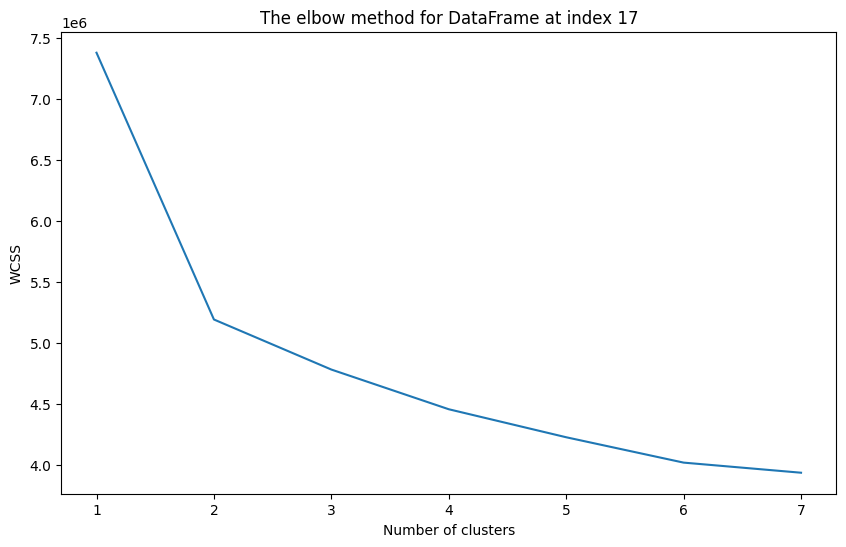

For cluster = 1, SSE/WCSS is 3140550.154812477
For cluster = 2, SSE/WCSS is 2653845.907430997
For cluster = 3, SSE/WCSS is 2490000.008314121
For cluster = 4, SSE/WCSS is 2387694.921187665
For cluster = 5, SSE/WCSS is 2311002.545107799
For cluster = 6, SSE/WCSS is 2241176.9682059633
For cluster = 7, SSE/WCSS is 2191331.276314919


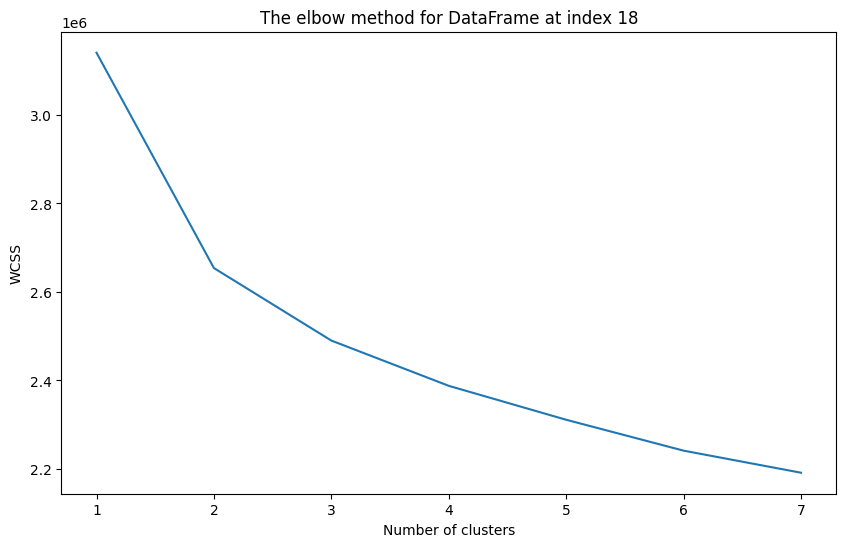

For cluster = 1, SSE/WCSS is 5400521.320050052
For cluster = 2, SSE/WCSS is 3367529.313259376
For cluster = 3, SSE/WCSS is 3110669.7464586464
For cluster = 4, SSE/WCSS is 2880306.1165007213
For cluster = 5, SSE/WCSS is 2780880.609787143
For cluster = 6, SSE/WCSS is 2717829.470790629
For cluster = 7, SSE/WCSS is 2637139.625791423


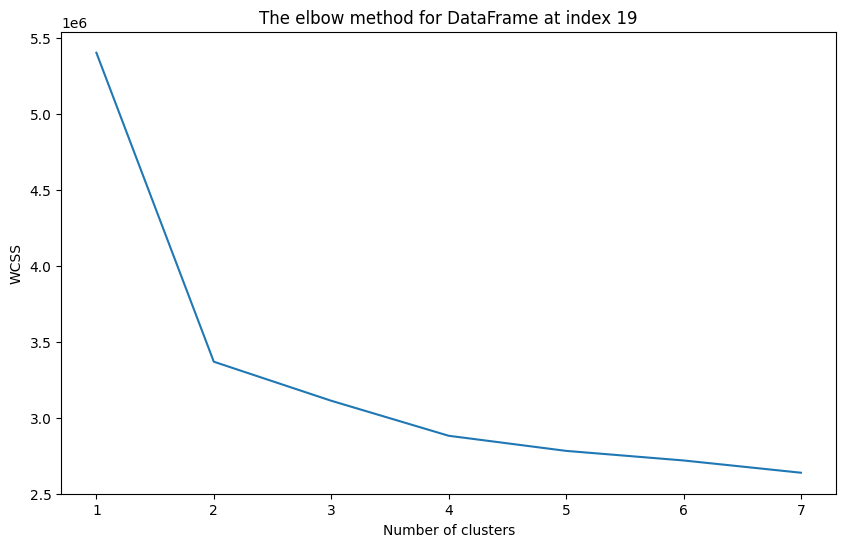

For cluster = 1, SSE/WCSS is 5426021674002.123
For cluster = 2, SSE/WCSS is 1373996391734.2932
For cluster = 3, SSE/WCSS is 612208295908.9618
For cluster = 4, SSE/WCSS is 345491558378.88916
For cluster = 5, SSE/WCSS is 223516561808.33652
For cluster = 6, SSE/WCSS is 155218109462.81564
For cluster = 7, SSE/WCSS is 113967864396.42387


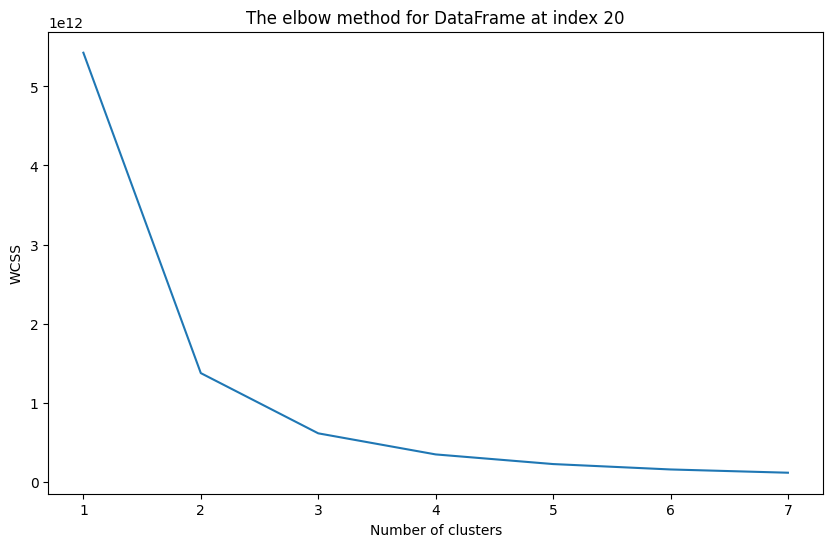

For cluster = 1, SSE/WCSS is 5263791612759.738
For cluster = 2, SSE/WCSS is 1337812772992.483
For cluster = 3, SSE/WCSS is 597551675413.2064
For cluster = 4, SSE/WCSS is 336905008347.407
For cluster = 5, SSE/WCSS is 218002459238.26953
For cluster = 6, SSE/WCSS is 152050023160.37814
For cluster = 7, SSE/WCSS is 111030323052.63661


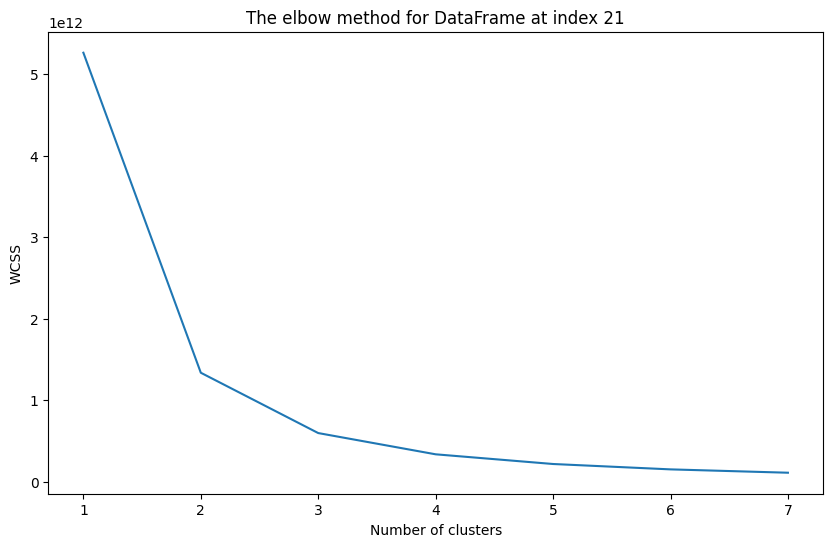

For cluster = 1, SSE/WCSS is 5263791612759.738
For cluster = 2, SSE/WCSS is 1337812772992.483
For cluster = 3, SSE/WCSS is 597551675413.2064
For cluster = 4, SSE/WCSS is 336905008347.407
For cluster = 5, SSE/WCSS is 218002459238.26953
For cluster = 6, SSE/WCSS is 152050023160.37814
For cluster = 7, SSE/WCSS is 111030323052.63661


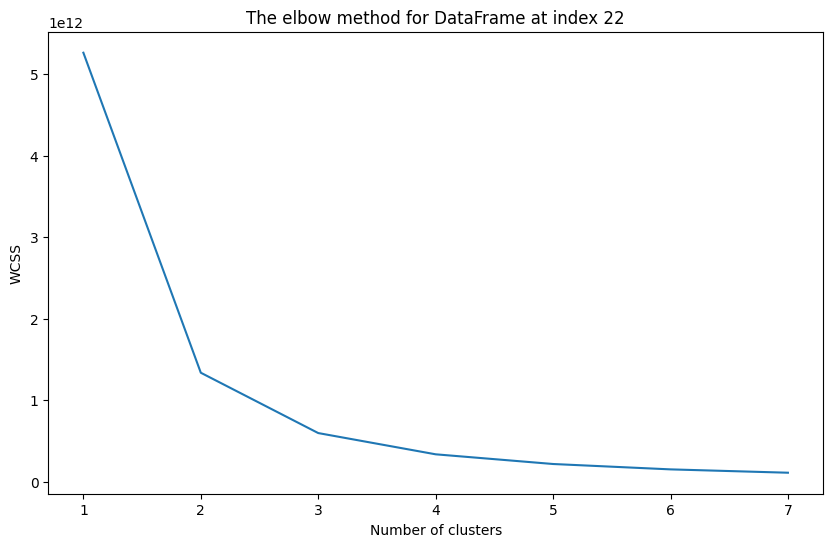

For cluster = 1, SSE/WCSS is 5263791612759.738
For cluster = 2, SSE/WCSS is 1337812772992.4827
For cluster = 3, SSE/WCSS is 597551675413.2064
For cluster = 4, SSE/WCSS is 336905008347.4069
For cluster = 5, SSE/WCSS is 218002459238.26953
For cluster = 6, SSE/WCSS is 152050023160.37814
For cluster = 7, SSE/WCSS is 111030323052.63663


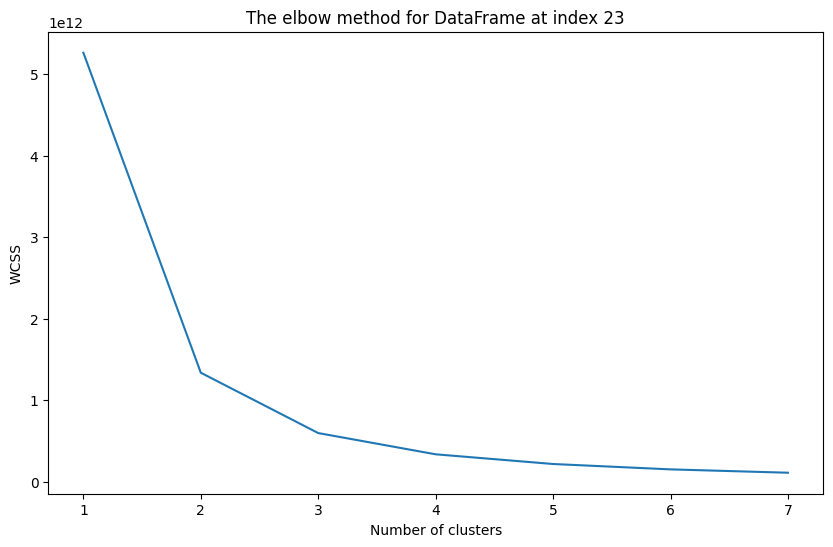

For cluster = 1, SSE/WCSS is 4726585.273587846
For cluster = 2, SSE/WCSS is 4036681.147653794
For cluster = 3, SSE/WCSS is 3552803.7264375486
For cluster = 4, SSE/WCSS is 3407108.598850355
For cluster = 5, SSE/WCSS is 3287306.114919832
For cluster = 6, SSE/WCSS is 3187193.13465802
For cluster = 7, SSE/WCSS is 3112013.636118384


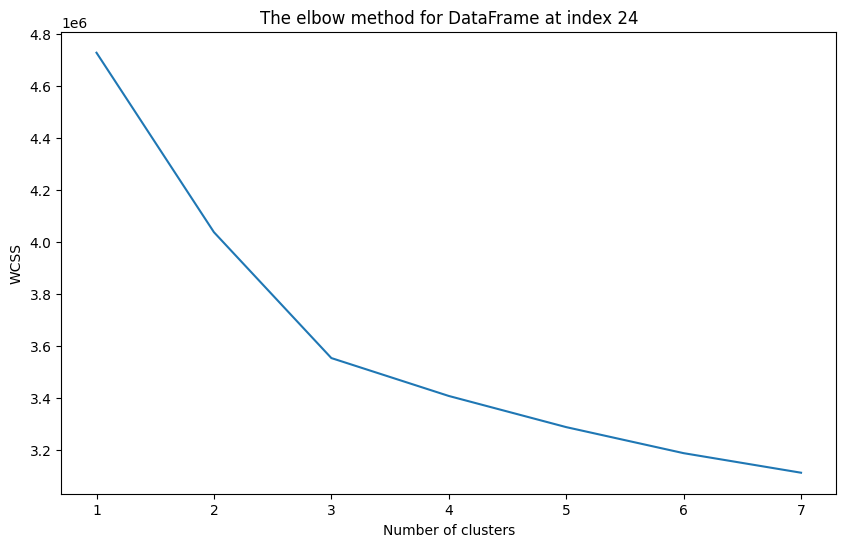

For cluster = 1, SSE/WCSS is 7382099.955196935
For cluster = 2, SSE/WCSS is 5191739.755875674
For cluster = 3, SSE/WCSS is 4780718.346269613
For cluster = 4, SSE/WCSS is 4454802.941457623
For cluster = 5, SSE/WCSS is 4224870.710683786
For cluster = 6, SSE/WCSS is 4016637.804101116
For cluster = 7, SSE/WCSS is 3933678.5761791635


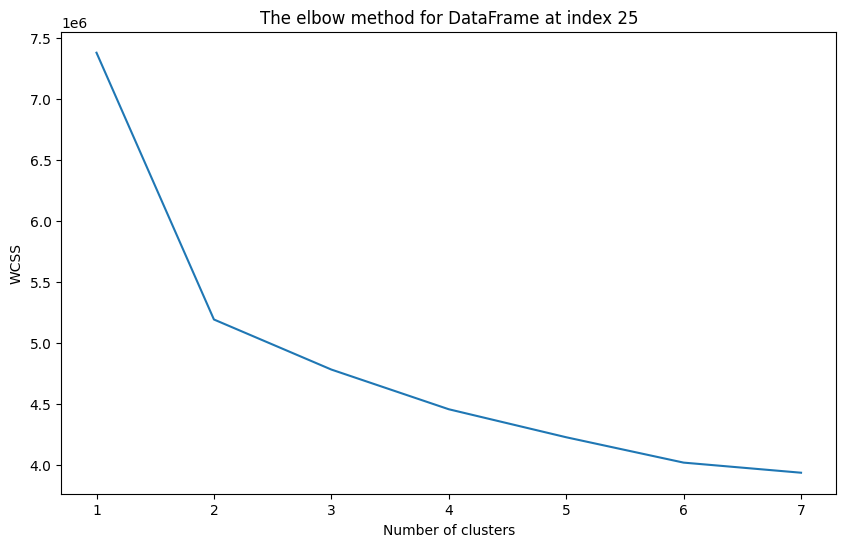

For cluster = 1, SSE/WCSS is 2526913.015637607
For cluster = 2, SSE/WCSS is 2051962.8475365448
For cluster = 3, SSE/WCSS is 1923888.63714885
For cluster = 4, SSE/WCSS is 1827928.5240172916
For cluster = 5, SSE/WCSS is 1757753.4381847607
For cluster = 6, SSE/WCSS is 1704413.6681771819
For cluster = 7, SSE/WCSS is 1657976.307401001


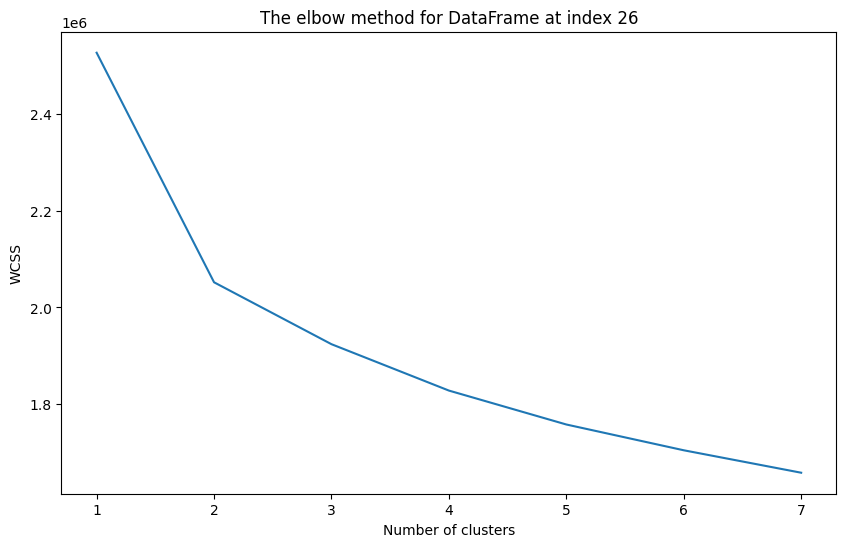

For cluster = 1, SSE/WCSS is 2573374.2270061774
For cluster = 2, SSE/WCSS is 2095152.9912304094
For cluster = 3, SSE/WCSS is 1965394.7593377386
For cluster = 4, SSE/WCSS is 1867929.3206608898
For cluster = 5, SSE/WCSS is 1797525.2195676046
For cluster = 6, SSE/WCSS is 1743983.3741421502
For cluster = 7, SSE/WCSS is 1695395.4742922815


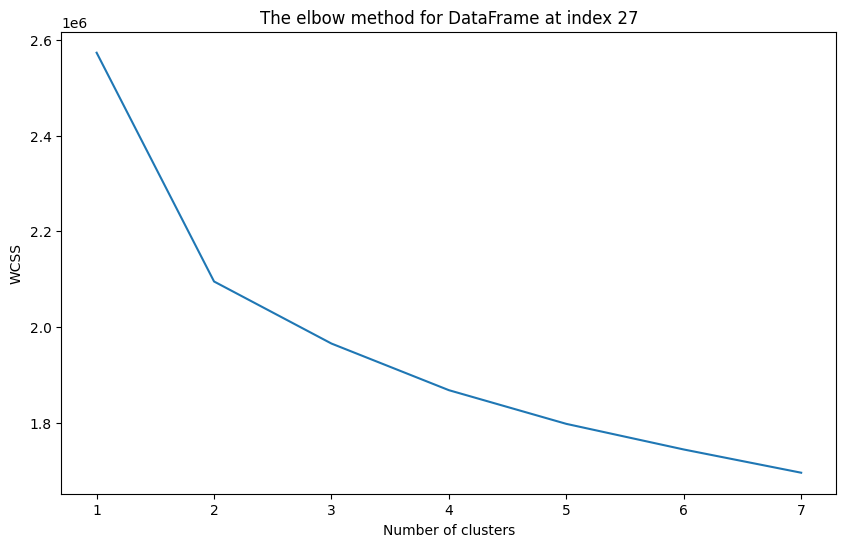

For cluster = 1, SSE/WCSS is 6611780.638795838
For cluster = 2, SSE/WCSS is 4648688.3879406145
For cluster = 3, SSE/WCSS is 4260192.545961393
For cluster = 4, SSE/WCSS is 4001803.8132929807
For cluster = 5, SSE/WCSS is 3810662.4253773373
For cluster = 6, SSE/WCSS is 3659137.46276133
For cluster = 7, SSE/WCSS is 3582281.8443247527


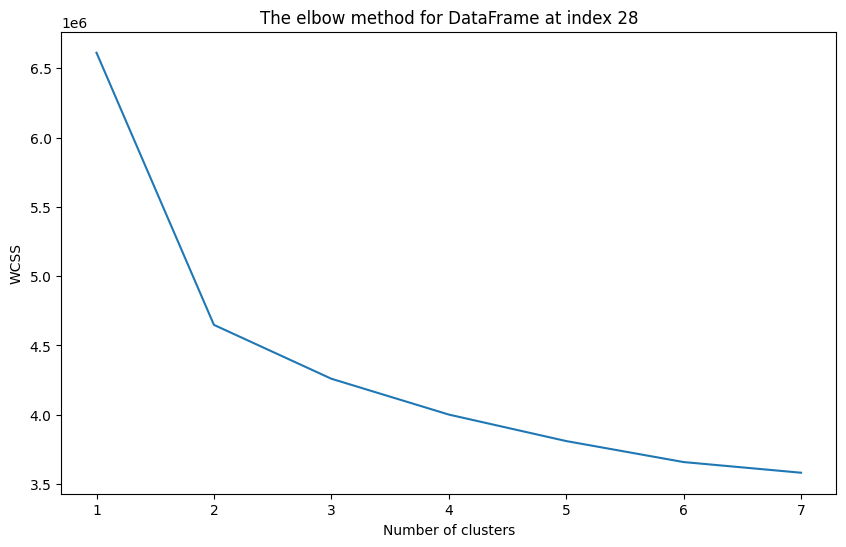

For cluster = 1, SSE/WCSS is 5263791612759.735
For cluster = 2, SSE/WCSS is 1337812772992.483
For cluster = 3, SSE/WCSS is 597551675413.2064
For cluster = 4, SSE/WCSS is 336905008347.407
For cluster = 5, SSE/WCSS is 218002459238.26953
For cluster = 6, SSE/WCSS is 152050023160.3781
For cluster = 7, SSE/WCSS is 111030323052.63661


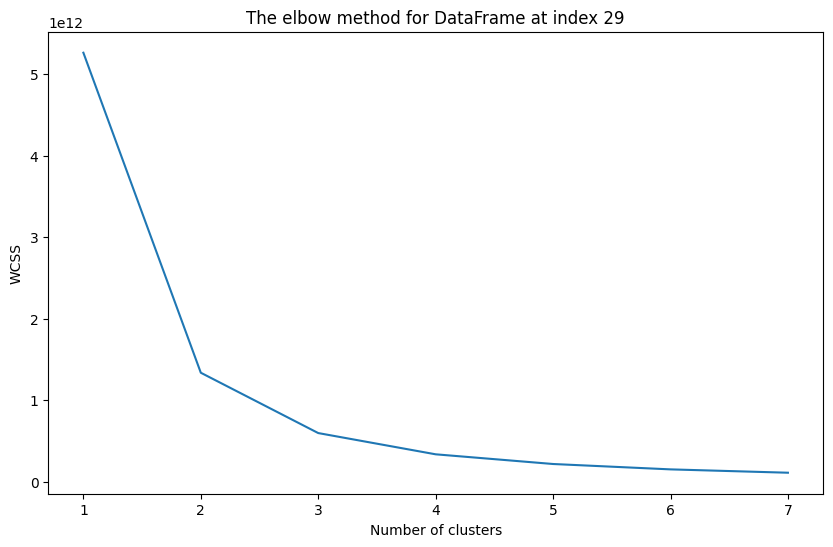

In [322]:
# Iterate over non_df_pca list
for i in range(len(df_list_no_pca)):
  elbow_method(df_list_no_pca[i], i)

In [323]:
# Iterate over df_with_pca list
for i in range(len(df_final_list_with_pca)):
  elbow_method(df_final_list_with_pca[i], i)

For cluster = 1, SSE/WCSS is 6685525.763716153
For cluster = 2, SSE/WCSS is 4493066.2240624875
For cluster = 3, SSE/WCSS is 4081154.3958231383
For cluster = 4, SSE/WCSS is 3744217.267964383
For cluster = 5, SSE/WCSS is 3507797.1418332183
For cluster = 6, SSE/WCSS is 3300865.040086911
For cluster = 7, SSE/WCSS is 3218070.2465276862


KeyboardInterrupt: 

In [325]:
from sklearn.metrics import silhouette_score
wcss = []

def silhouette_method(df, index_of_df):
  print(f"Silhouette Method for DataFrame at {index_of_df}")
  for k in range(2, 8):
    kmeans = KMeans(n_clusters= k,max_iter=100).fit(df)
    label = kmeans.labels_
    sil_coeff = silhouette_score(df,label,metric = 'euclidean')
    print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

  print('- ' * 15)

In [602]:
for i in range(len(df_final_list_with_pca)):
  silhouette_method(df_final_list_with_pca[i], i)

Silhouette Method for DataFrame at 0
For cluster= 2, Silhouette Coefficient is 0.6240326089204957
For cluster= 3, Silhouette Coefficient is 0.5883686241487618
For cluster= 4, Silhouette Coefficient is 0.5703956177142716
For cluster= 5, Silhouette Coefficient is 0.5567385990200328
For cluster= 6, Silhouette Coefficient is 0.5495609345067127
For cluster= 7, Silhouette Coefficient is 0.544460830888816
- - - - - - - - - - - - - - - 
Silhouette Method for DataFrame at 1
For cluster= 2, Silhouette Coefficient is 0.6241528531144922
For cluster= 3, Silhouette Coefficient is 0.5877834786810533
For cluster= 4, Silhouette Coefficient is 0.5699832722060436
For cluster= 5, Silhouette Coefficient is 0.5568861582239365
For cluster= 6, Silhouette Coefficient is 0.5491653804228901
For cluster= 7, Silhouette Coefficient is 0.5440750959231154
- - - - - - - - - - - - - - - 
Silhouette Method for DataFrame at 2
For cluster= 2, Silhouette Coefficient is 0.6240340493513401
For cluster= 3, Silhouette Coeffici

In [2090]:
silhouette_method(df_list_with_pca[4], 4)

Silhouette Method for DataFrame at 4
For cluster= 2, Silhouette Coefficient is 0.6240371137180001
For cluster= 3, Silhouette Coefficient is 0.5883828908022183
For cluster= 4, Silhouette Coefficient is 0.5705510644552301
For cluster= 5, Silhouette Coefficient is 0.5568284015951231
For cluster= 6, Silhouette Coefficient is 0.5499128031104731
For cluster= 7, Silhouette Coefficient is 0.5449485577724605
- - - - - - - - - - - - - - - 


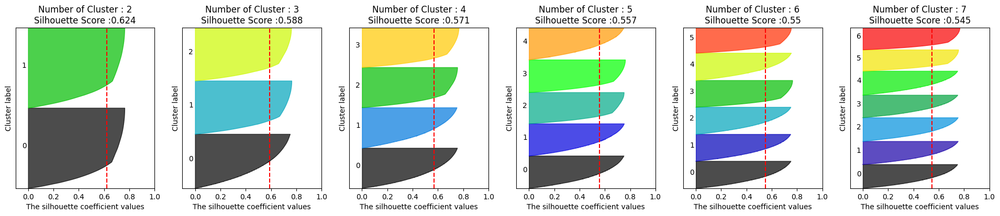

In [2091]:
visualize_silhouette([2, 3, 4, 5, 6, 7,], df_list_no_pca[4])

In [1536]:
for i in range(len(df_list_with_pca)):
  silhouette_method(df_list_with_pca[i], i)

Silhouette Method for DataFrame at 0
For cluster= 2, Silhouette Coefficient is 0.33230923776754584
For cluster= 3, Silhouette Coefficient is 0.2491370414027323
For cluster= 4, Silhouette Coefficient is 0.23287564724840115
For cluster= 5, Silhouette Coefficient is 0.177377575183805
For cluster= 6, Silhouette Coefficient is 0.17610837704449722
For cluster= 7, Silhouette Coefficient is 0.15664020818727295
- - - - - - - - - - - - - - - 
Silhouette Method for DataFrame at 1
For cluster= 2, Silhouette Coefficient is 0.6240401637516181
For cluster= 3, Silhouette Coefficient is 0.5883670830336017
For cluster= 4, Silhouette Coefficient is 0.5703813861805501
For cluster= 5, Silhouette Coefficient is 0.5567305107256135
For cluster= 6, Silhouette Coefficient is 0.5494239622319287
For cluster= 7, Silhouette Coefficient is 0.5458247474165965
- - - - - - - - - - - - - - - 
Silhouette Method for DataFrame at 2
For cluster= 2, Silhouette Coefficient is 0.6229676408178403
For cluster= 3, Silhouette Coef

KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

def visualize_silhouette(cluster_lists, X_features, index_of_df):
    print(f"Silhouette Plot for DataFrame at {index_of_df}")
    n_cols = len(cluster_lists)
    fig, axs = plt.subplots(figsize=(4*n_cols, 4), nrows=1, ncols=n_cols)

    for ind, n_cluster in enumerate(cluster_lists):
        clusterer = KMeans(n_clusters = n_cluster, max_iter=500, random_state=0, init = 'k-means++')
        cluster_labels = clusterer.fit_predict(X_features)

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)

        y_lower = 10
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n' \
                          'Silhouette Score :' + str(round(sil_avg,3)) )
        axs[ind].set_xlabel("The silhouette coefficient values")
        axs[ind].set_ylabel("Cluster label")
        axs[ind].set_xlim([-0.1, 1])
        axs[ind].set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        axs[ind].set_yticks([])  # Clear the yaxis labels / ticks
        axs[ind].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels==i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            axs[ind].fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                                facecolor=color, edgecolor=color, alpha=0.7)
            axs[ind].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        axs[ind].axvline(x=sil_avg, color="red", linestyle="--")

In [ ]:
for i in range(len(df_list_no_pca)):
  visualize_silhouette([2, 3, 4, 5, 6, 7,], df_list_no_pca[i])

In [ ]:
for i in range(len(df_list_with_pca)):
  visualize_silhouette([2, 3, 4, 5, 6, 7,], df_list_with_pca[i])

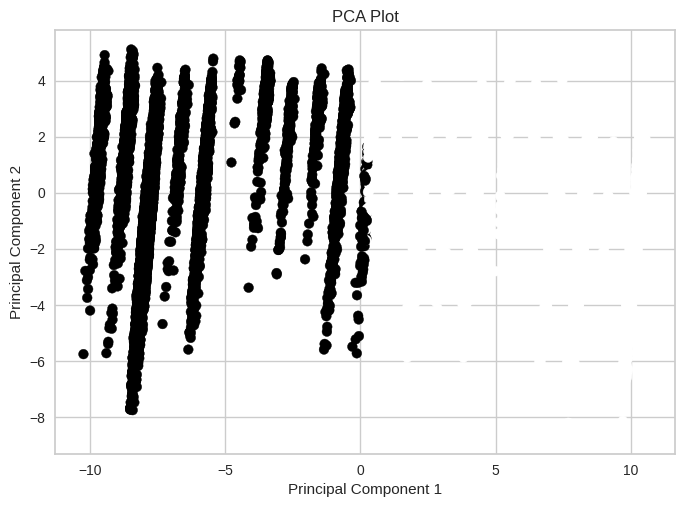

In [ ]:
# Plot PCA Model using Generated clusters
plt.scatter(df_orig_feature_pca[:, 0], df_orig_feature_pca[:, 1], c=kmeans.labels_)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.show()

# Profiling / Describing the Clusters

In [ ]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [ ]:
# Locate indices from df_non_outliers and store created clusters
df['Cluster'] = cluster_labels

In [ ]:
# Profiling columns
expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']

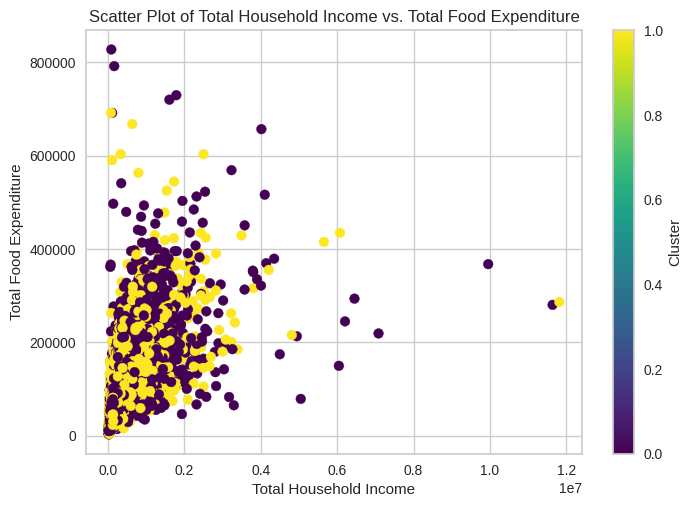

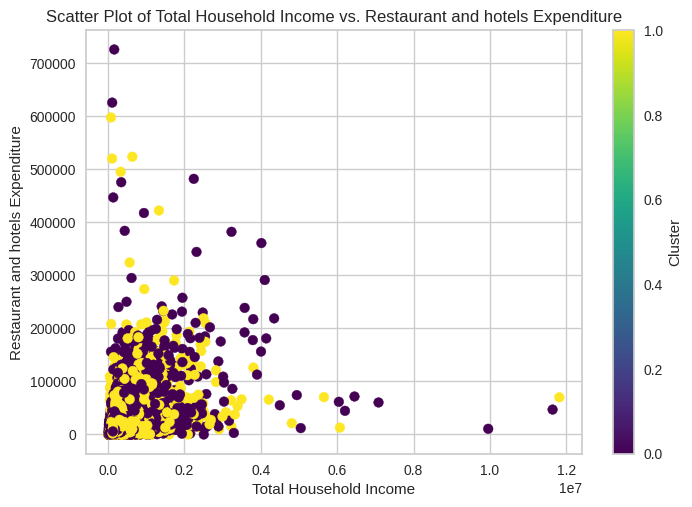

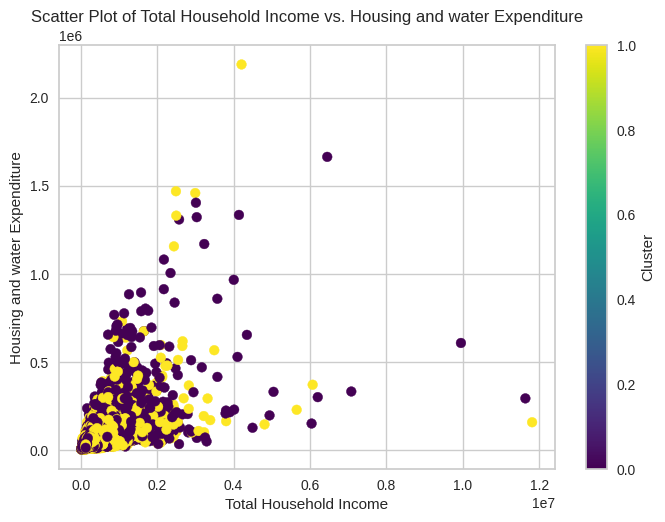

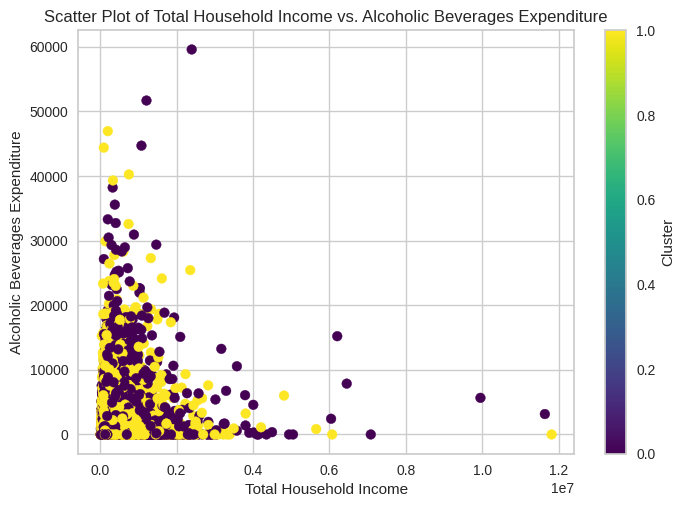

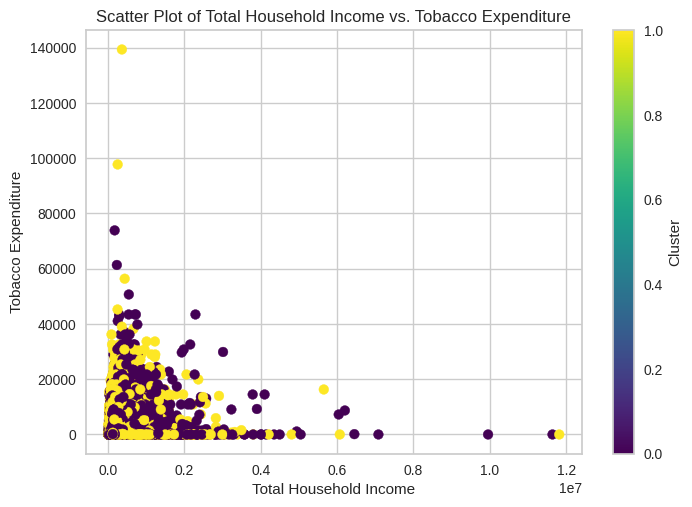

...

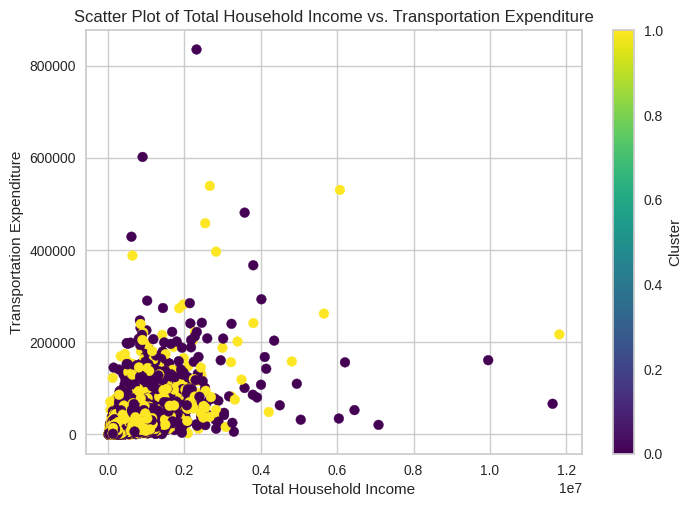

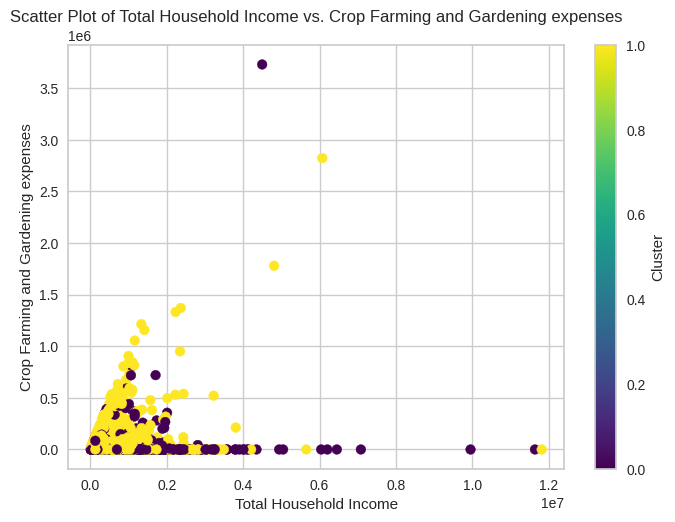

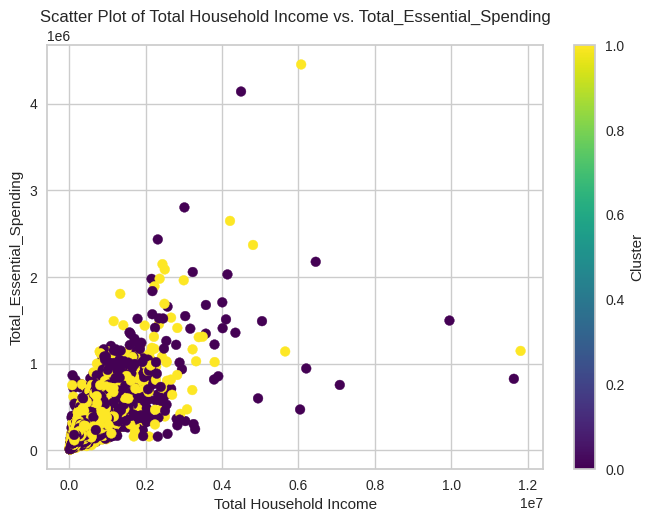

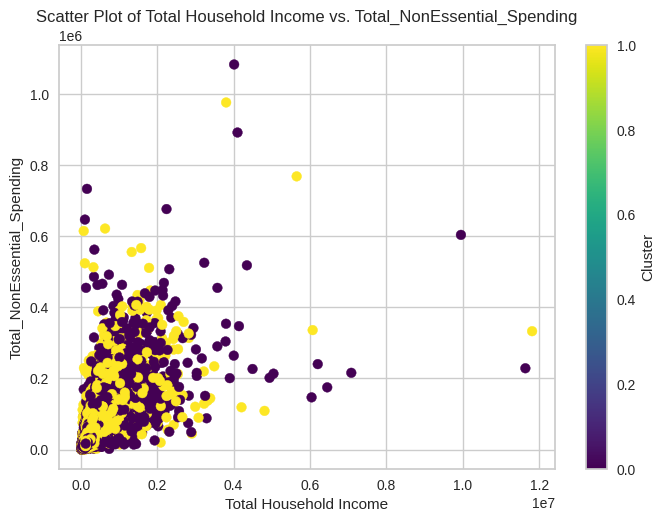

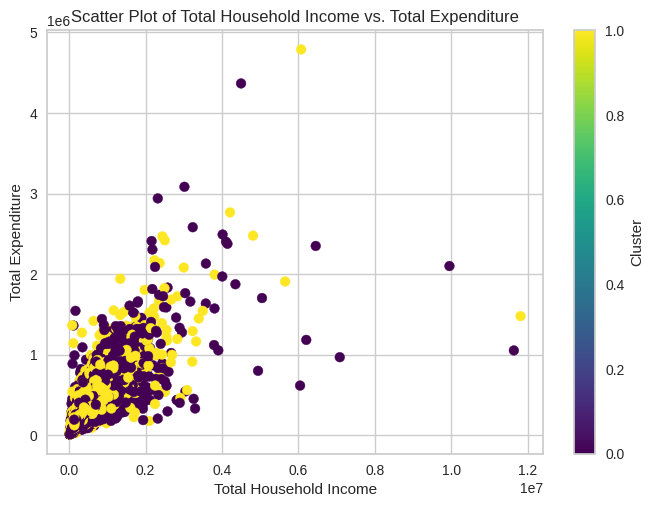

In [ ]:
# Scatter plot of Total Household Income versus each column in expenditure columns. Color code and label the dots based on 'Cluster' column
for column in expenditure_columns:
    plt.scatter(df['Total Household Income'], df[column], c=df['Cluster'], cmap='viridis')
    plt.xlabel('Total Household Income')
    plt.ylabel(column)
    plt.title(f'Scatter Plot of Total Household Income vs. {column}')
    plt.colorbar(label='Cluster')
    plt.show()

In [ ]:
# Display Mean values for each expenditure column, group by cluster
df.groupby('Cluster')[expenditure_columns].mean()

,Total Food Expenditure,Restaurant and hotels Expenditure,Housing and water Expenditure,Alcoholic Beverages Expenditure,Tobacco Expenditure,"Clothing, Footwear and Other Wear Expenditure",Miscellaneous Goods and Services Expenditure,Special Occasions Expenditure,Medical Care Expenditure,Education Expenditure,Communication Expenditure,Transportation Expenditure,Crop Farming and Gardening expenses,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure
Cluster,,,,,,,,,,,,,,,,
0,92095.422353,18906.127639,47345.230869,1048.898817,2194.836220,5486.215295,14217.780662,5818.931563,9303.720561,8543.273449,5176.426696,13686.412719,3850.754355,180001.241002,47672.790196,227674.031199
1,78600.636998,12202.478354,30029.529932,1118.926543,2387.208547,4462.312029,10950.994042,4754.020296,5168.672796,6485.425100,3091.817987,10062.912485,23128.456289,156567.451587,35875.939810,192443.391397


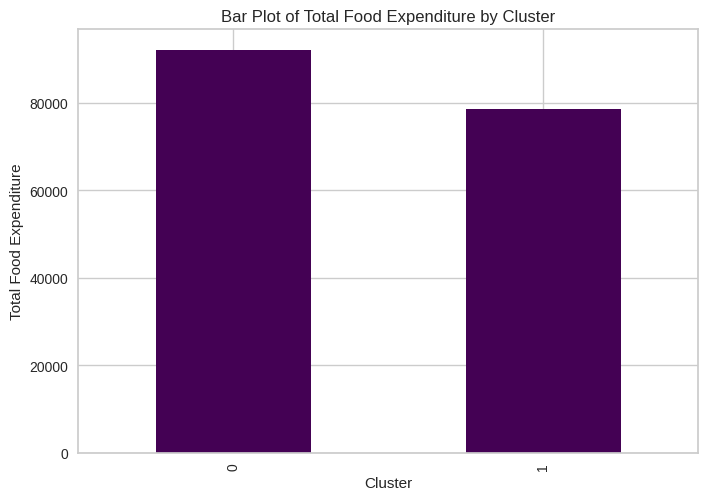

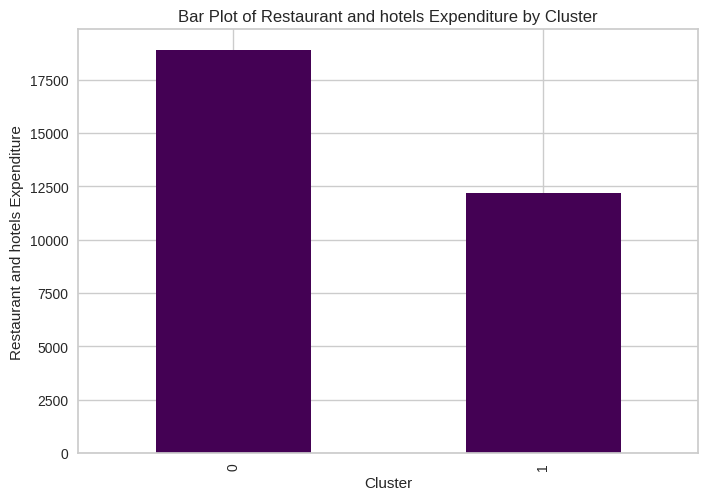

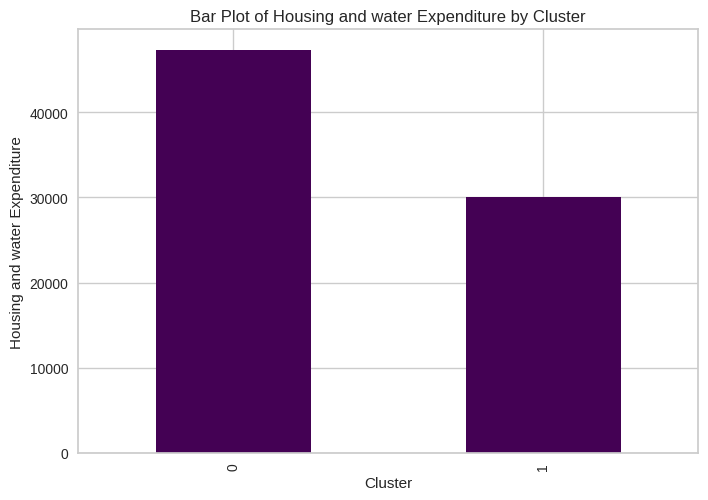

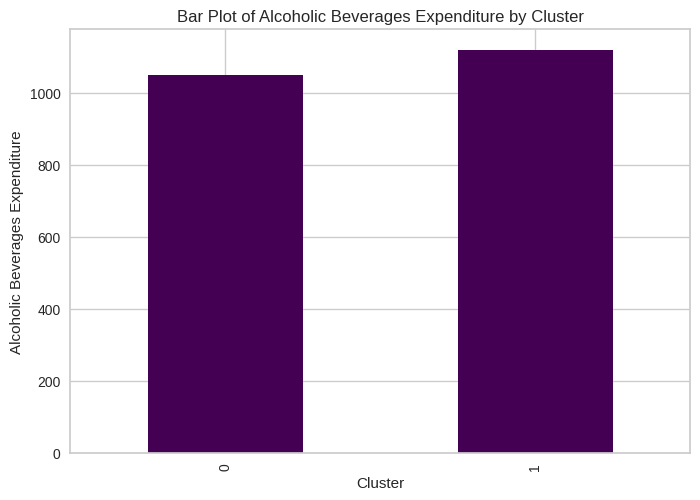

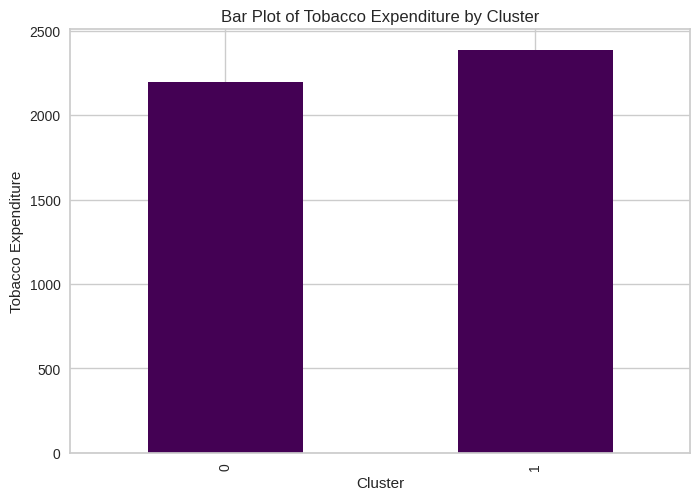

...

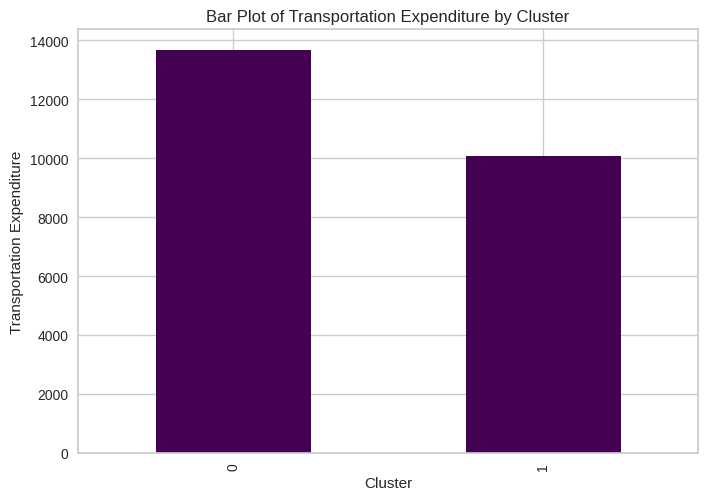

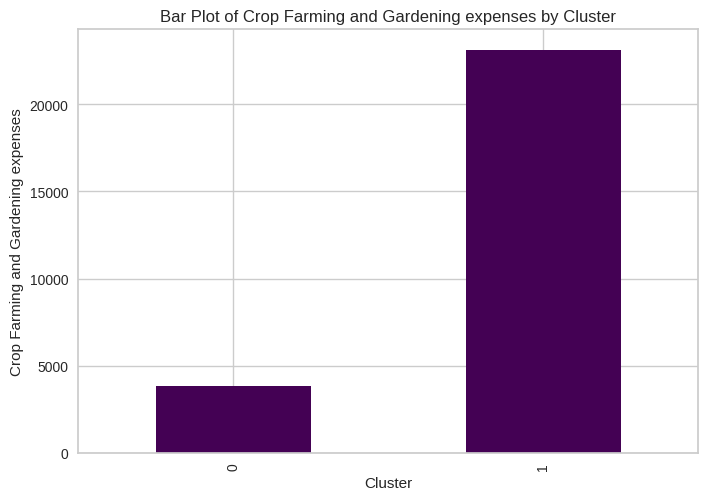

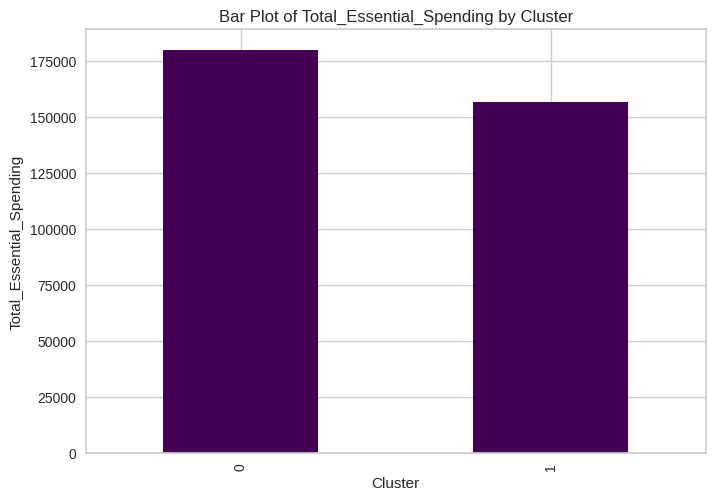

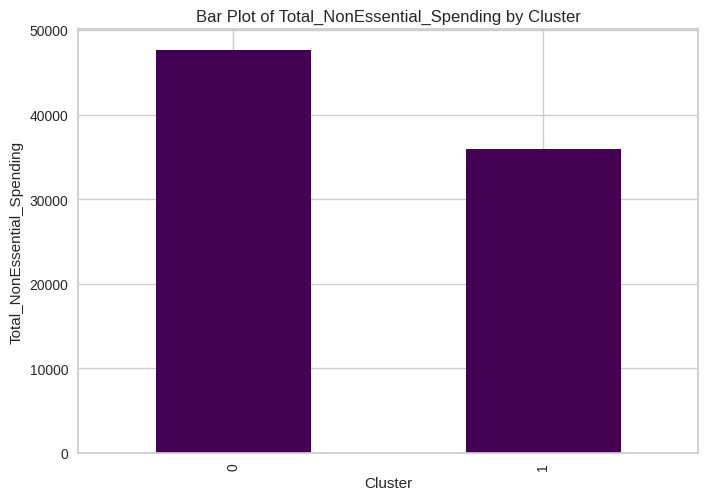

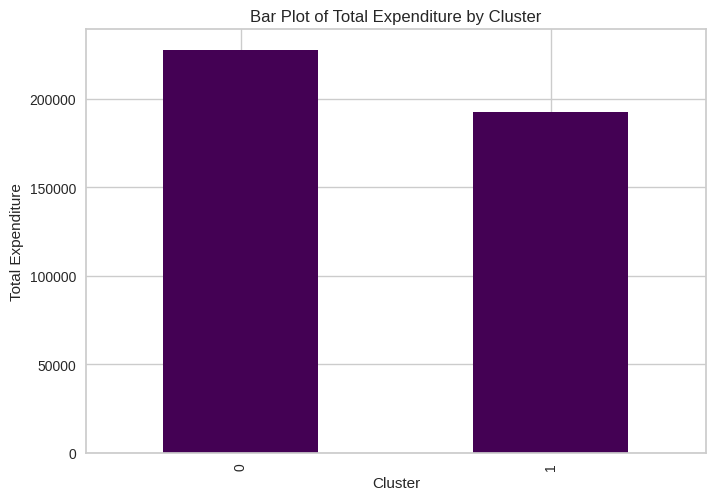

In [ ]:
# Bar Plot for Expenditure Columns, based on Cluster and color coded
for column in expenditure_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

In [ ]:
# Display Mean values for each income column, group by cluster
df.groupby('Cluster')[income_columns].mean()

,Total Household Income,Total Income from Entrepreneurial Acitivites,Remaining_Income,Amount_Outside_Income
Cluster,,,,
0,282099.593571,56485.744422,64312.307942,9886.745570
1,215511.243273,52419.814030,41447.372219,18379.520343


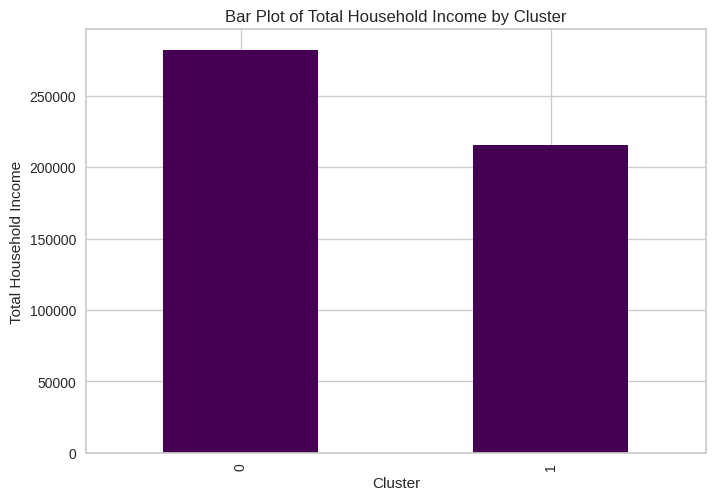

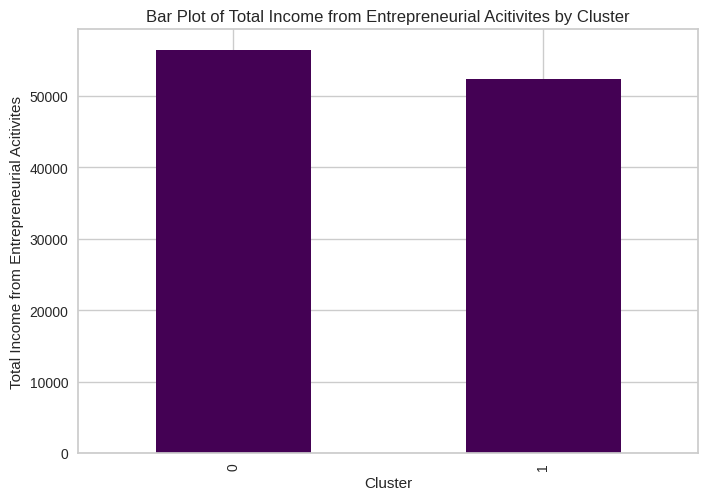

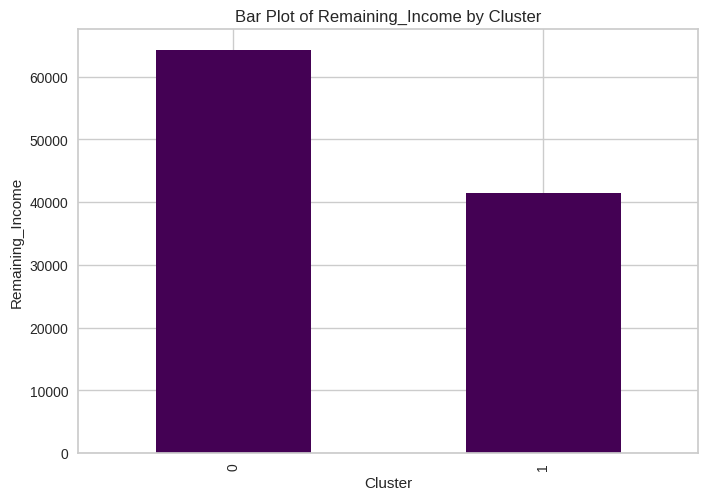

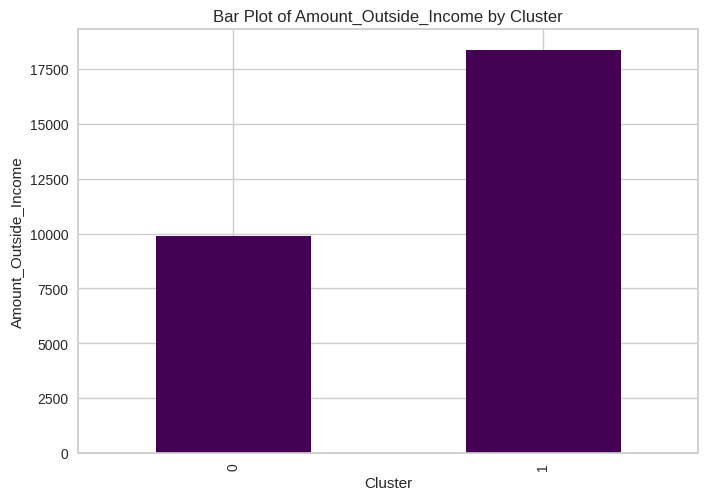

In [ ]:
# Bar Plot for Income Columns, based on Cluster and color coded
for column in income_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

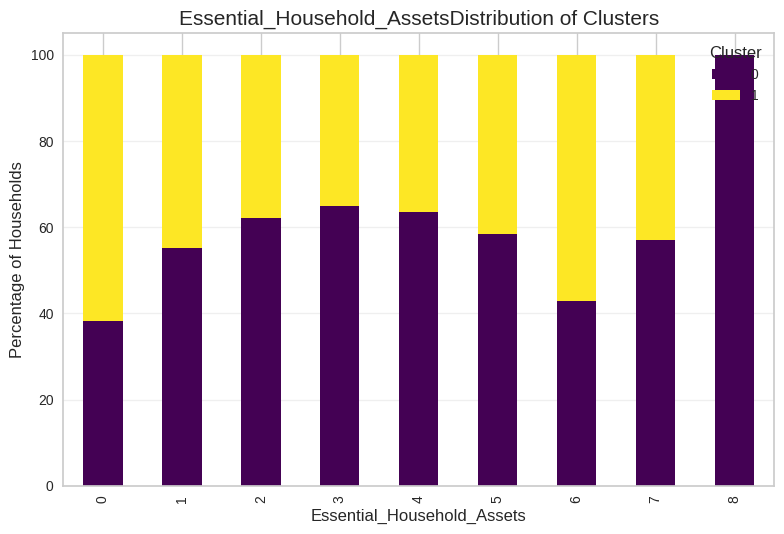

<Figure size 1400x800 with 0 Axes>

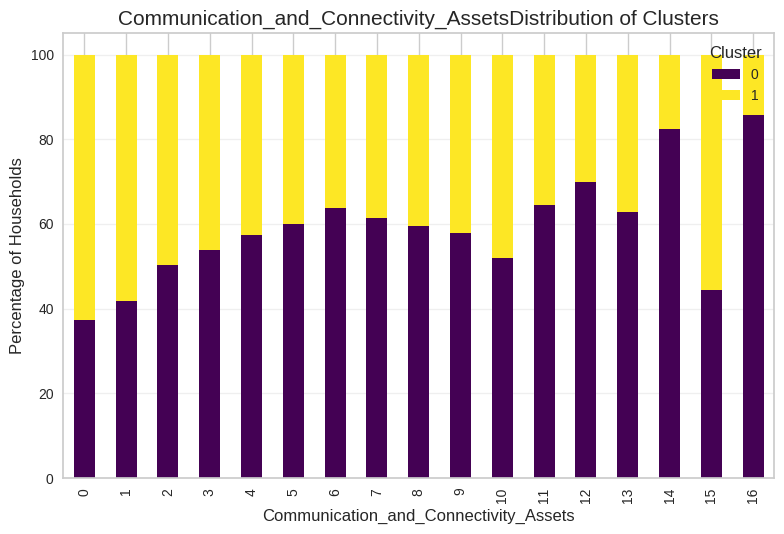

<Figure size 1400x800 with 0 Axes>

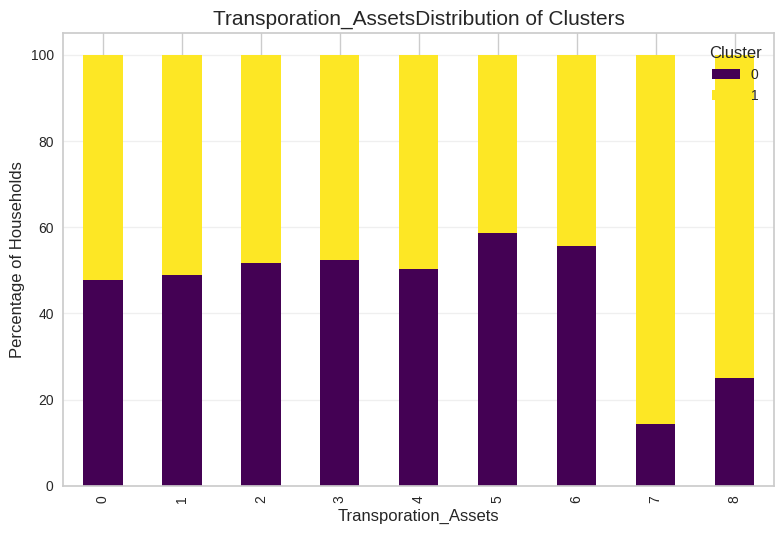

<Figure size 1400x800 with 0 Axes>

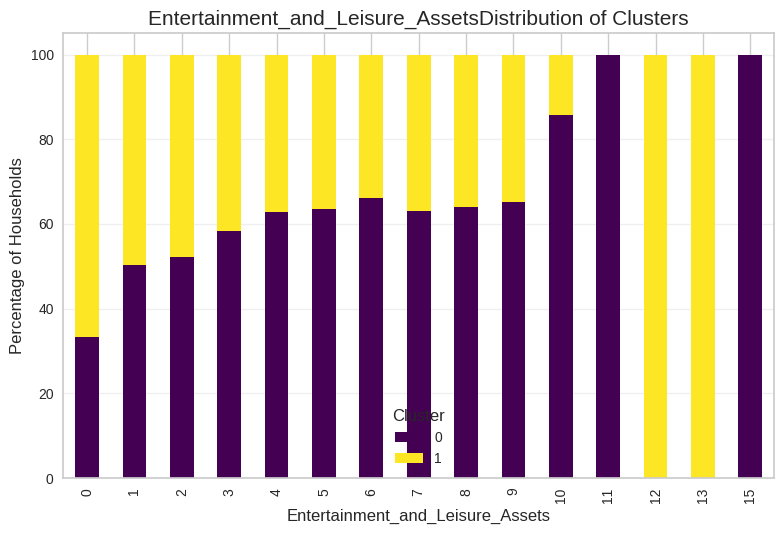

<Figure size 1400x800 with 0 Axes>

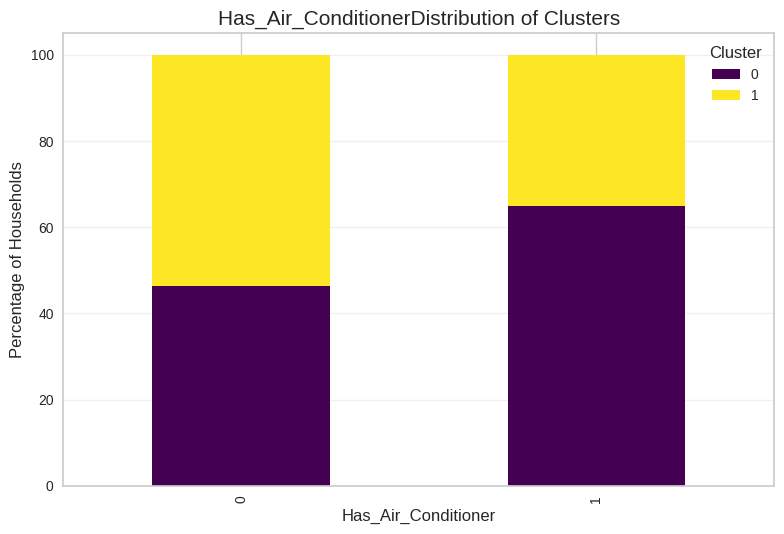

In [ ]:
# Show Distribution of columns per Household Assets per Cluster
for col in household_assets:
  region_cluster_distribution = pd.crosstab(
      df[col],
      df['Cluster'],
      normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col}Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel('Percentage of Households', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()


In [ ]:
# Display Counts per Region, group by cluster
df.groupby('Cluster')['Region'].value_counts()

Cluster  Region                   
0        NCR                          2867
         IVA - CALABARZON             2550
         III - Central Luzon          1968
         VI - Western Visayas         1317
         VII - Central Visayas        1266
         I - Ilocos Region            1213
         XI - Davao Region            1120
         V - Bicol Region             1059
         VIII - Eastern Visayas       1015
         XII - SOCCSKSARGEN            871
         X - Northern Mindanao         824
         Caraga                        779
         II - Cagayan Valley           774
         IX - Zasmboanga Peninsula     713
         CAR                           629
          ARMM                         603
         IVB - MIMAROPA                465
1         ARMM                        1643
         IVA - CALABARZON             1609
         VI - Western Visayas         1532
         II - Cagayan Valley          1445
         V - Bicol Region             1412
         XI - Davao Region            1324
         VIII - Eastern Visayas       1321
         VII - Central Visayas        1275
         III - Central Luzon          1268
         NCR                          1252
         XII - SOCCSKSARGEN           1248
         I - Ilocos Region            1133
         CAR                          1096
         IX - Zasmboanga Peninsula    1074
         X - Northern Mindanao        1063
         Caraga                       1003
         IVB - MIMAROPA                784
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

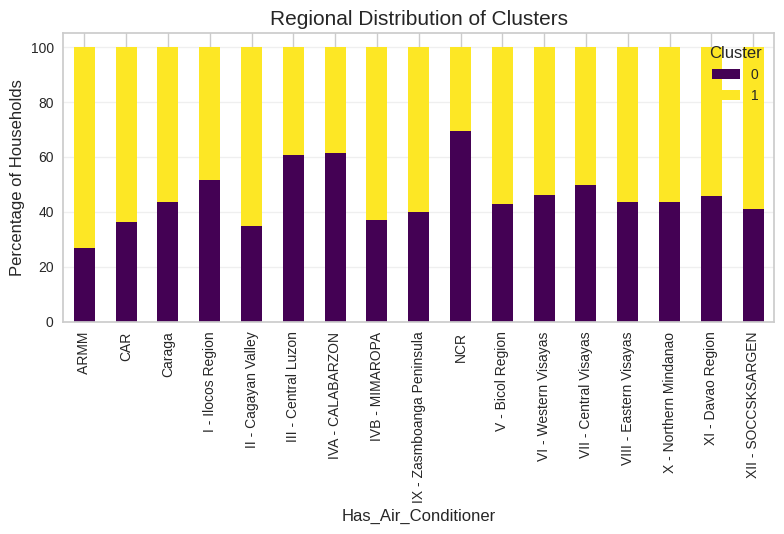

In [ ]:
region_cluster_distribution = pd.crosstab(
    df['Region'],
    df['Cluster'],
    normalize='index'
) * 100

plt.figure(figsize=(14, 8))
region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Regional Distribution of Clusters', fontsize=15)
plt.xlabel(col, fontsize=12)
plt.ylabel('Percentage of Households', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


In [ ]:
df.groupby('Cluster')['Household Head Highest Grade Completed'].value_counts()

Cluster  Household Head Highest Grade Completed
0        5                                         5313
         3                                         3329
         2                                         3171
         7                                         3137
         4                                         2381
         6                                         2238
         0                                          369
         8                                           92
         1                                            3
1        2                                         5643
         5                                         4309
         3                                         4306
         4                                         2508
         7                                         2303
         6                                         1389
         0                                          857
         8                                          155
         1                                           12
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

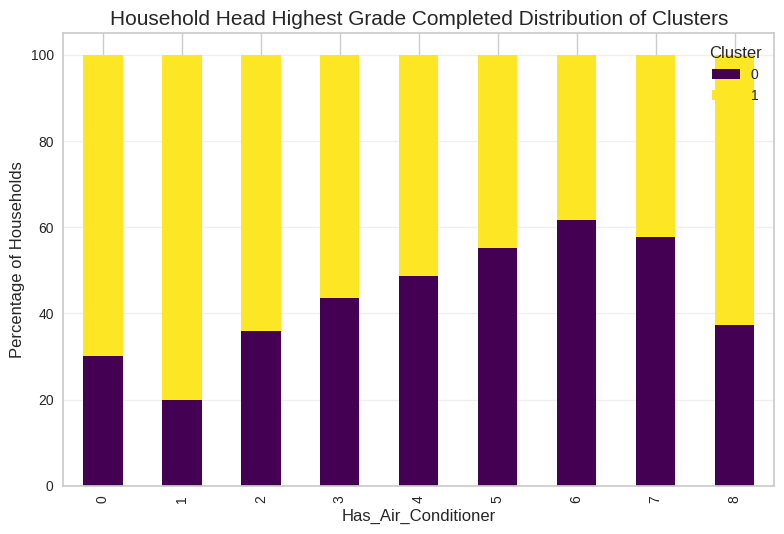

In [ ]:
region_cluster_distribution = pd.crosstab(
    df['Household Head Highest Grade Completed'],
    df['Cluster'],
    normalize='index'
) * 100

plt.figure(figsize=(14, 8))
region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Household Head Highest Grade Completed Distribution of Clusters', fontsize=15)
plt.xlabel(col, fontsize=12)
plt.ylabel('Percentage of Households', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


In [ ]:
df.groupby('Cluster')['Household Head Occupation'].value_counts()

Cluster  Household Head Occupation                                           
0        Uncategorized                                                            7536
         Wholesale and retail trade; repair of motor vehicles and motorcycles     4188
         Transportation and storage                                               4170
         Manufacturing                                                            2010
         Other service activities                                                 1227
         Professional, Scientific and Technical Activities                         279
         Human Health and Social Work Activities                                   276
         Mining and quarrying                                                      183
         Information and communication                                              92
         Real estate activities                                                     39
         Water supply, sewerage, waste management and remediation activities        33
1        Agriculture, forestry, and fishing                                      13543
         Construction                                                             2962
         Government and Public Service                                            1521
         Administrative and Support Service Activities                            1470
         Accommodation and food service activities                                 594
         Education                                                                 501
         Financial and insurance activities                                        300
         Electricity, gas, steam and air conditioning supply                       256
         Arts, Entertainment and Recreation                                        217
         Human Health and Social Work Activities                                    91
         Directors and chief executives of corporations                             27
Name: count, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41515 entries, 0 to 41543
Data columns (total 77 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41515 non-null  int64 
 1   Region                                         41515 non-null  object
 2   Total Food Expenditure                         41515 non-null  int64 
 3   Main Source of Income                          41515 non-null  object
 4   Agricultural Household indicator               41515 non-null  int64 
 5   Bread and Cereals Expenditure                  41515 non-null  int64 
 6   Total Rice Expenditure                         41515 non-null  int64 
 7   Meat Expenditure                               41515 non-null  int64 
 8   Total Fish and  marine products Expenditure    41515 non-null  int64 
 9   Fruit Expenditure                              41515 non-null  int

In [ ]:
# Family Columns
family_size_columns = ['Total Number of Family members', 'Members with age less than 5 year old',
                       'Members with age 5 - 17 years old', 'Total number of family members employed', 'Number of bedrooms',
                       'Number of Unemployed', 'Number of Kids', 'Number of Dependencies']

In [ ]:
# Facilities and House Desc
household_categorical_desc = ['Toilet Facilities', 'Tenure Status', 'Electricity', 'Main Source of Water Supply', 'Type of Walls',
                       'Type of Roof', 'Type of Building/House', 'Type of Household', 'Household Head Class of Worker',
                              'Household Head Highest Grade Completed', 'Household Head Occupation']

In [ ]:
house_numerical_columns = ['House Floor Area', 'House Age']

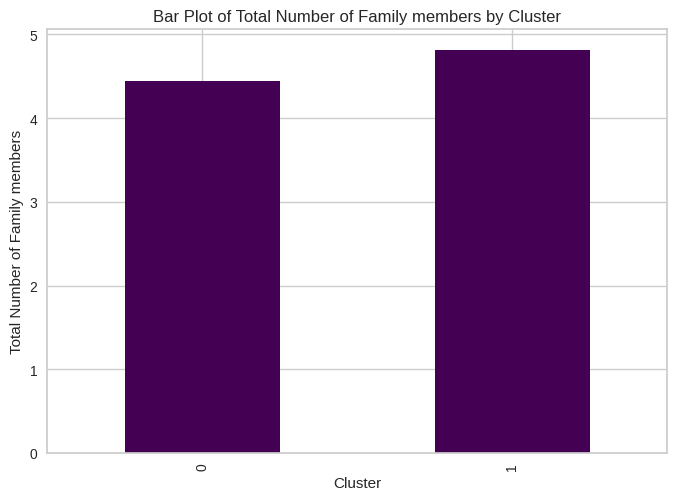

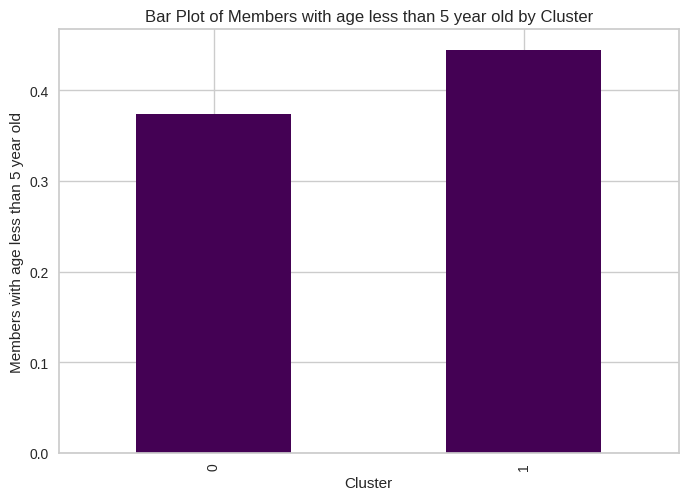

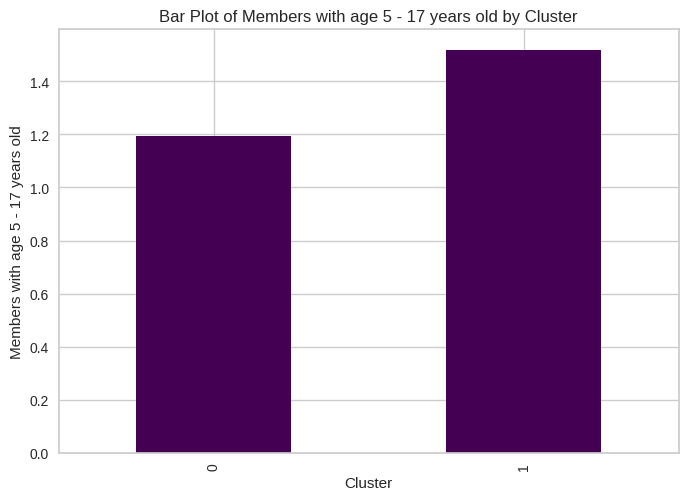

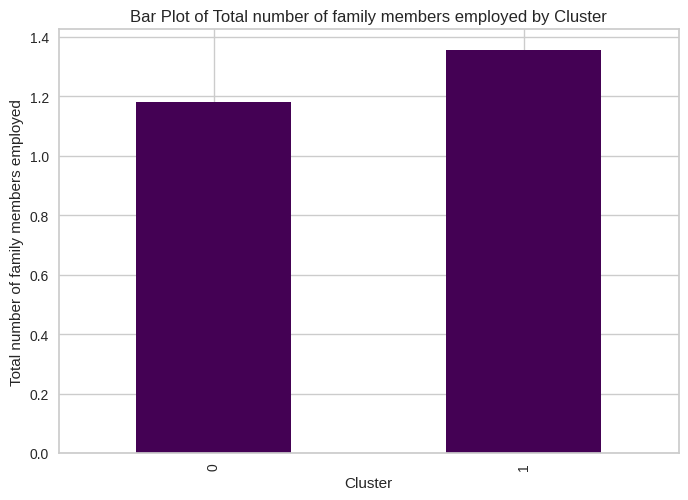

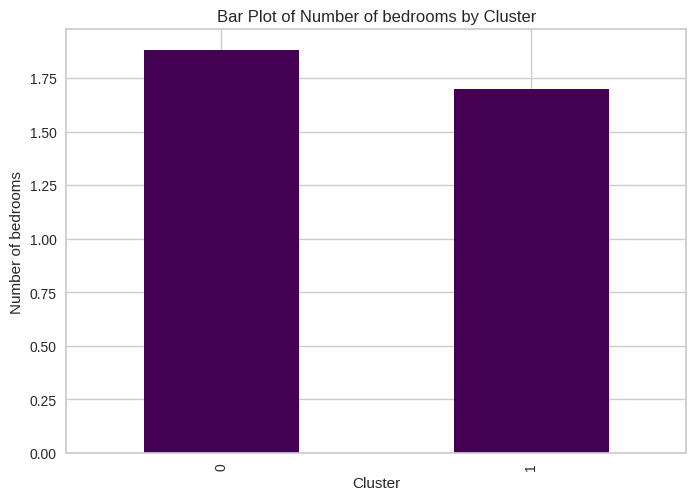

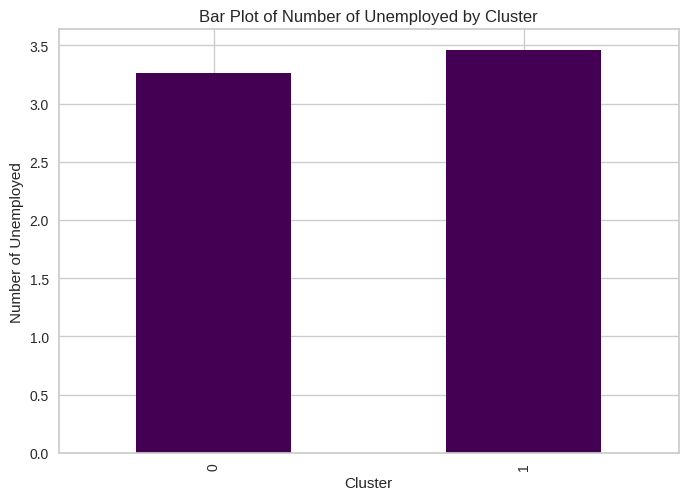

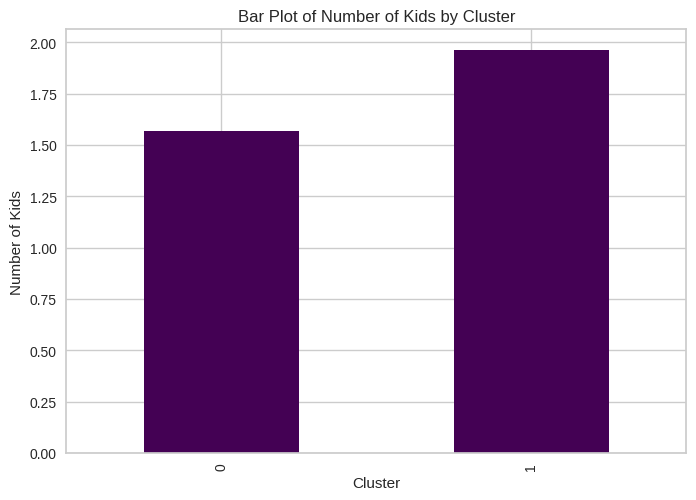

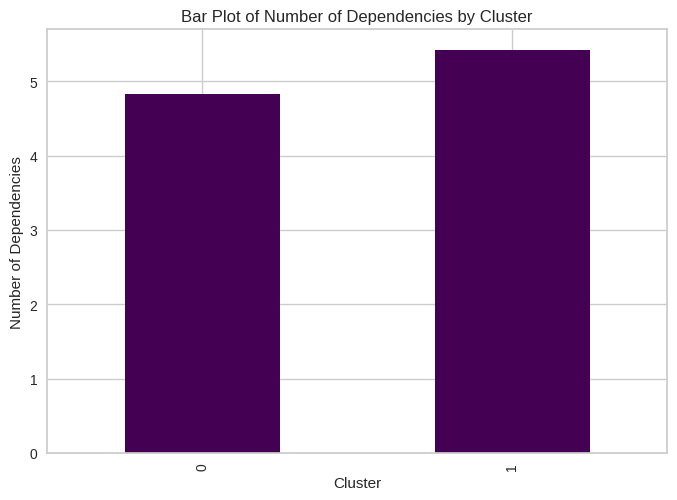

In [ ]:
# Bar Plot for family composition, based on Cluster and color coded
for column in family_size_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

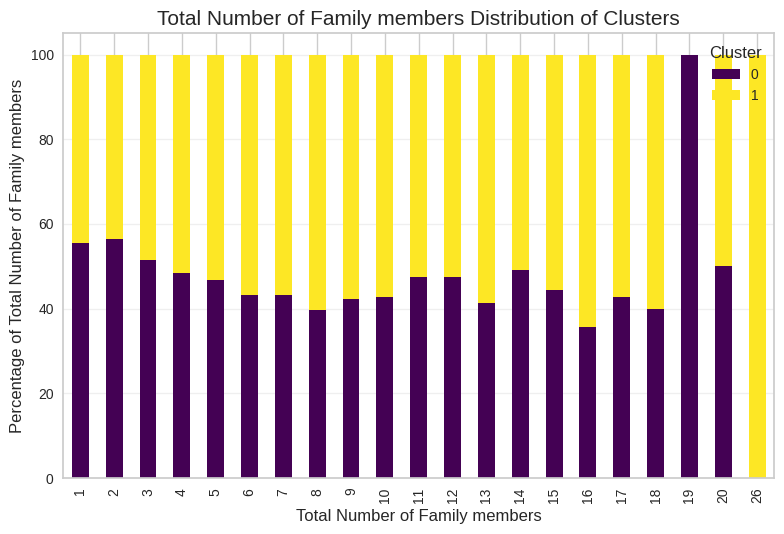

<Figure size 1400x800 with 0 Axes>

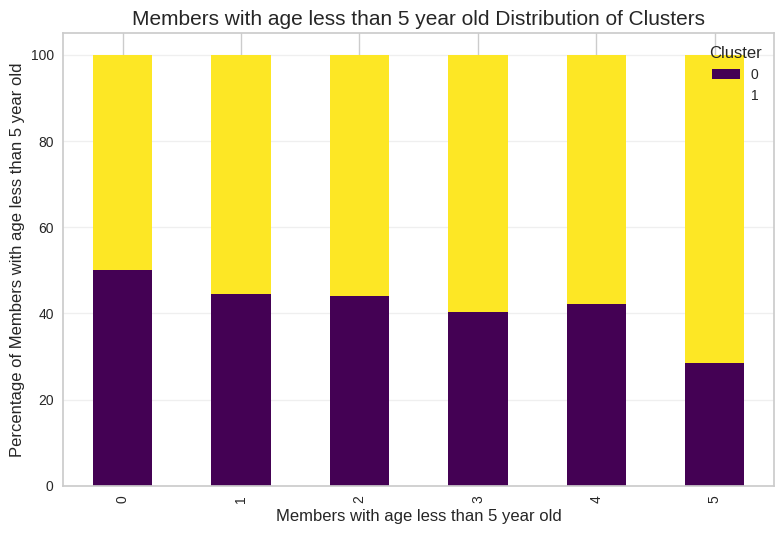

<Figure size 1400x800 with 0 Axes>

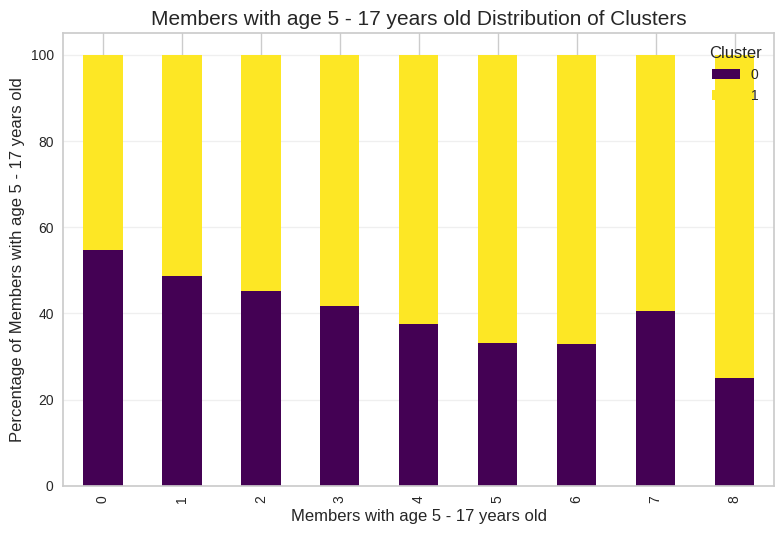

<Figure size 1400x800 with 0 Axes>

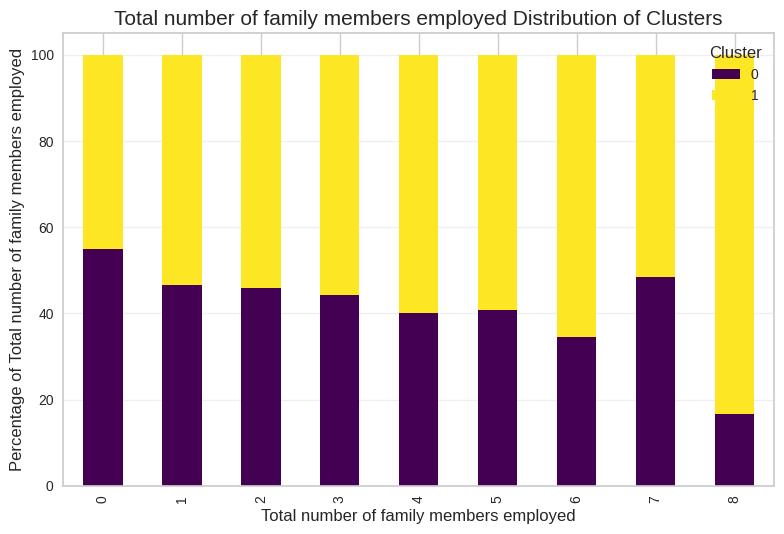

<Figure size 1400x800 with 0 Axes>

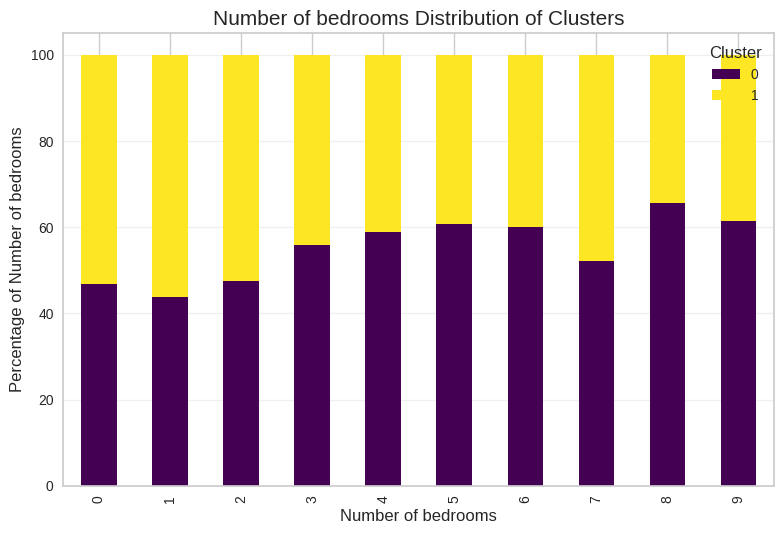

<Figure size 1400x800 with 0 Axes>

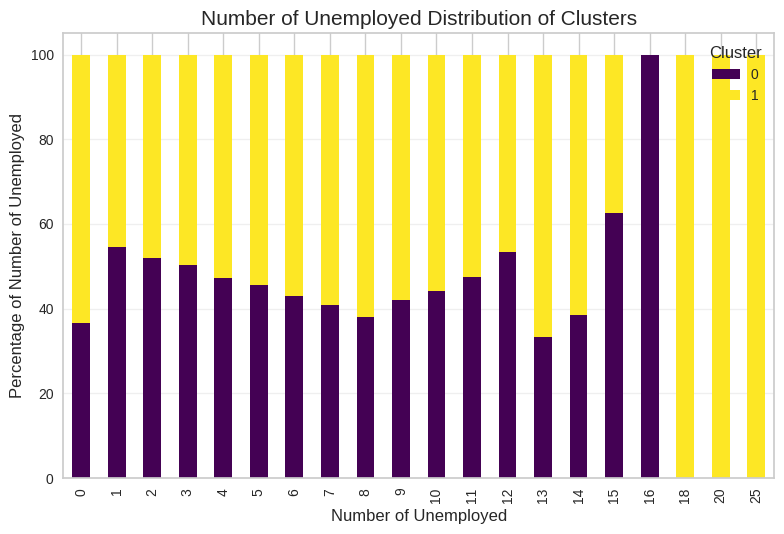

<Figure size 1400x800 with 0 Axes>

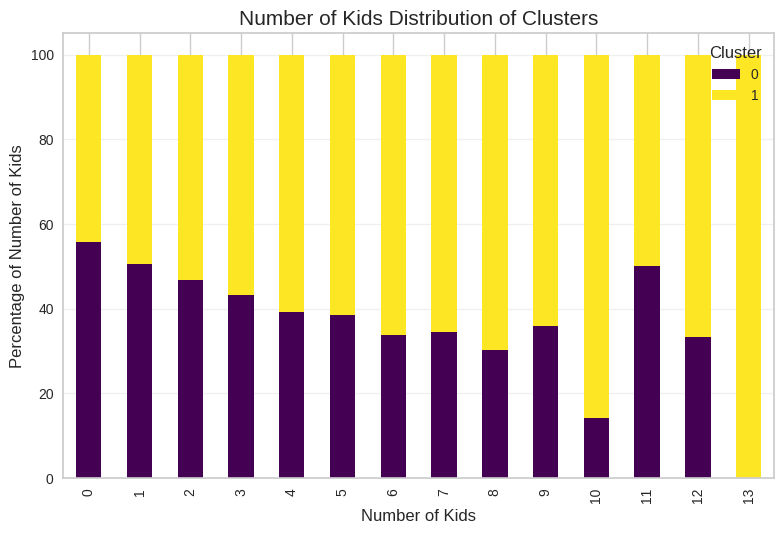

<Figure size 1400x800 with 0 Axes>

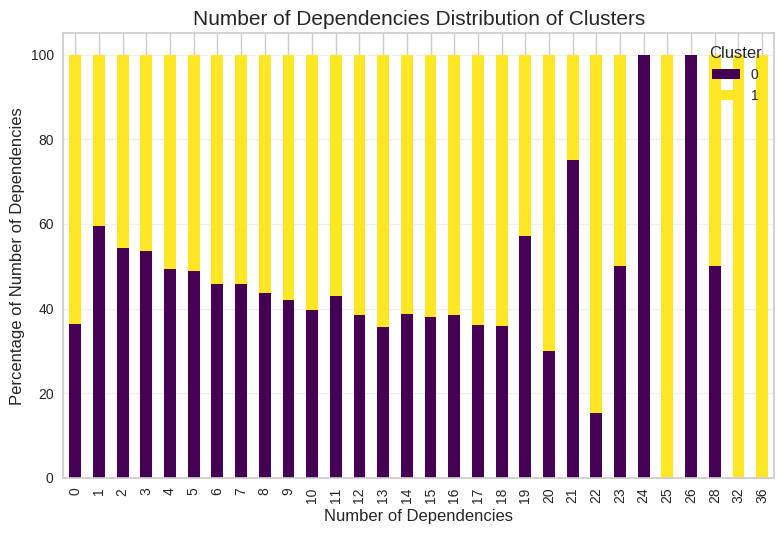

In [ ]:
for col in family_size_columns:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()

<Figure size 1400x800 with 0 Axes>

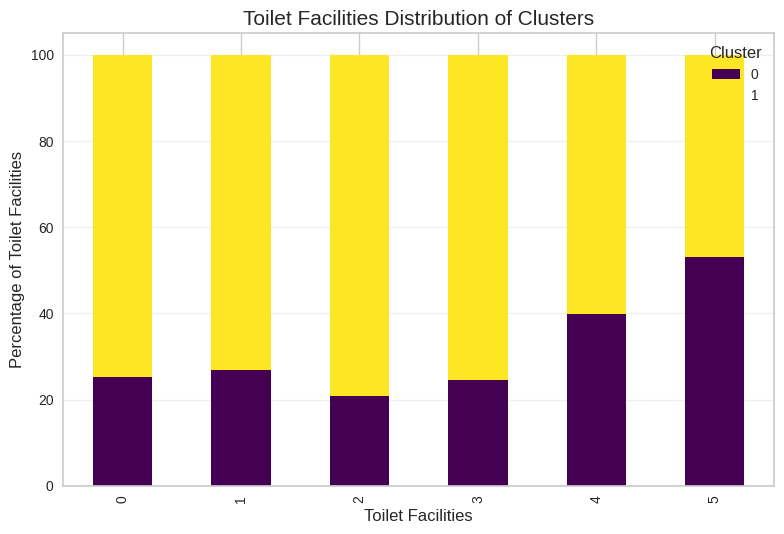

<Figure size 1400x800 with 0 Axes>

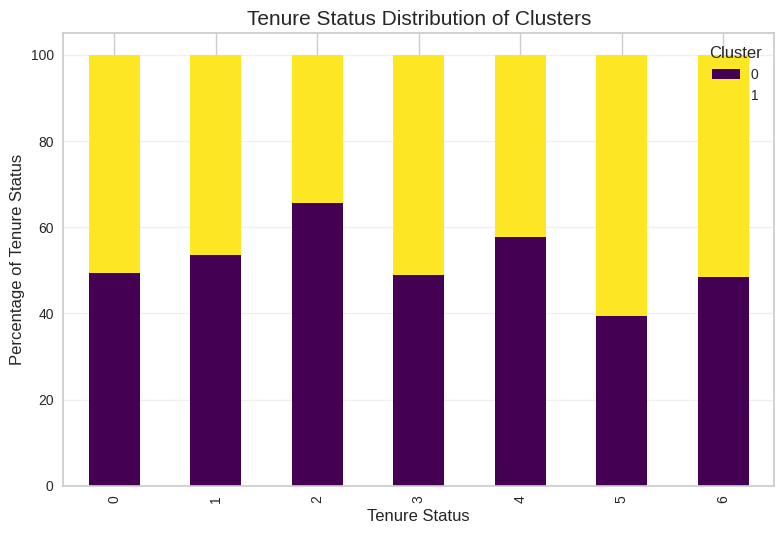

<Figure size 1400x800 with 0 Axes>

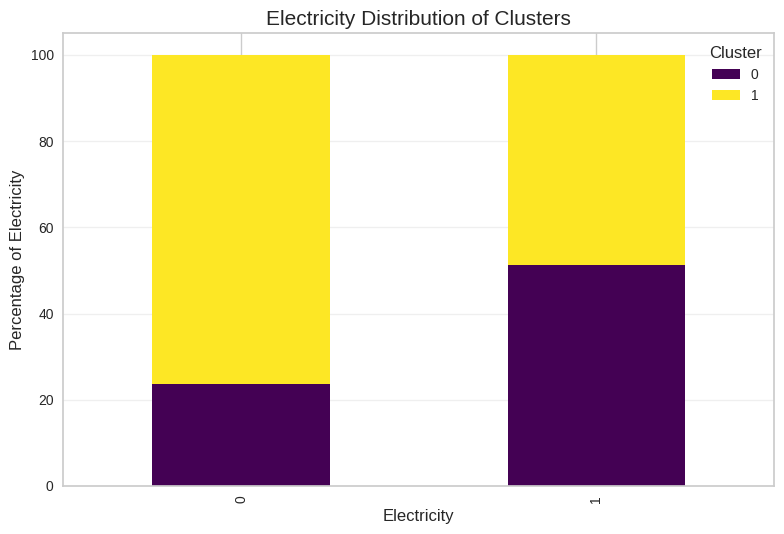

<Figure size 1400x800 with 0 Axes>

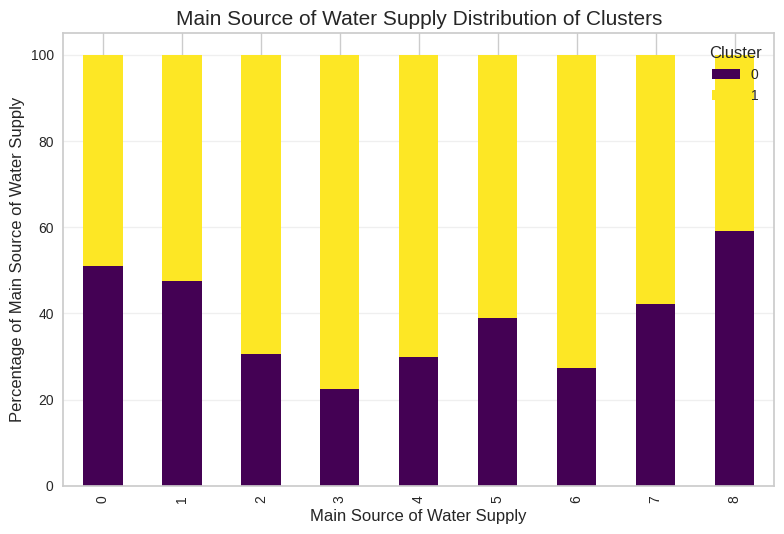

<Figure size 1400x800 with 0 Axes>

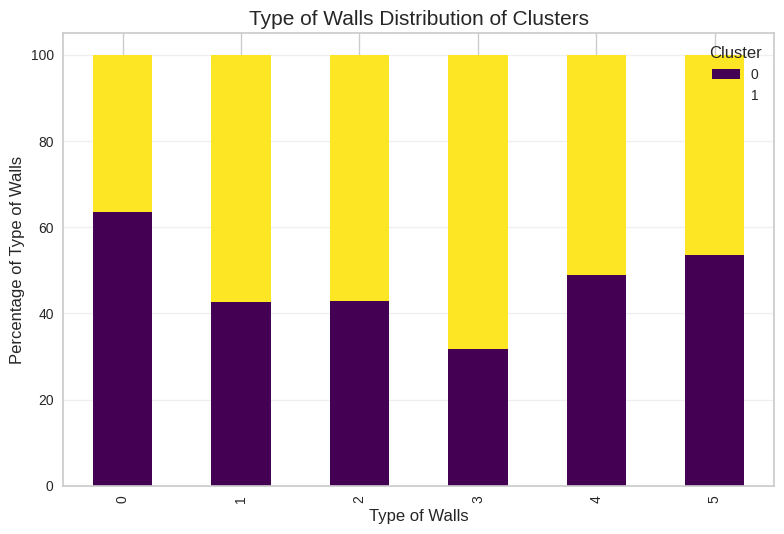

<Figure size 1400x800 with 0 Axes>

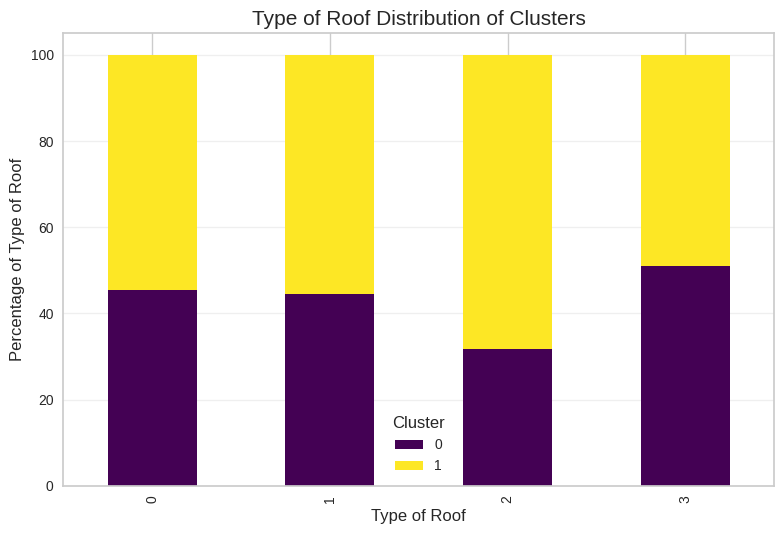

<Figure size 1400x800 with 0 Axes>

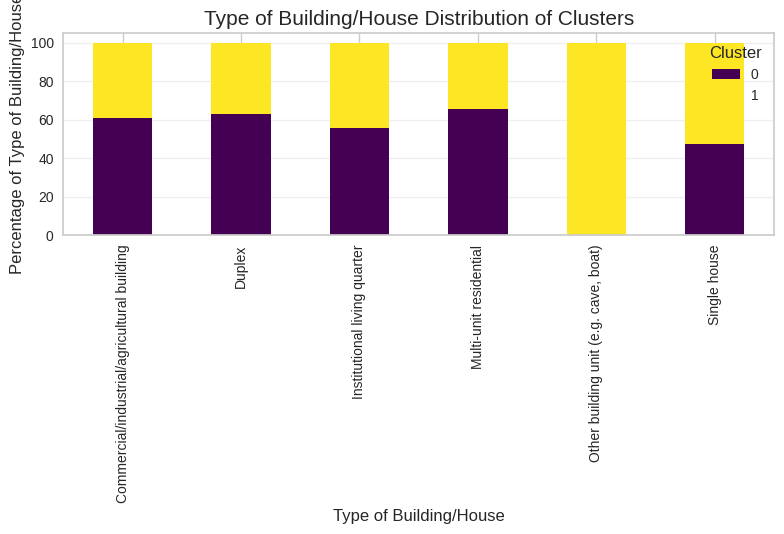

<Figure size 1400x800 with 0 Axes>

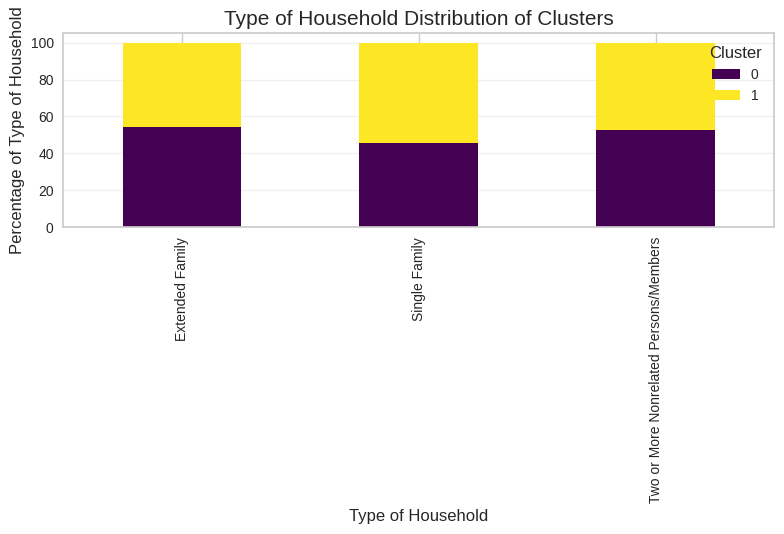

<Figure size 1400x800 with 0 Axes>

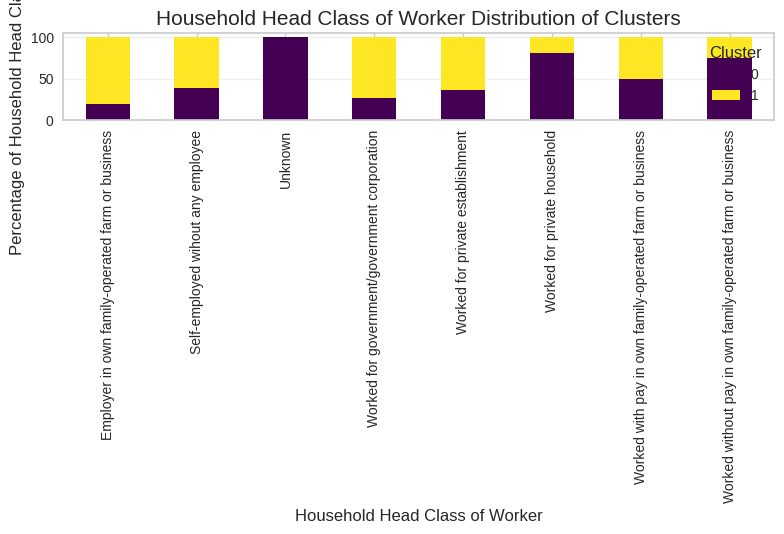

<Figure size 1400x800 with 0 Axes>

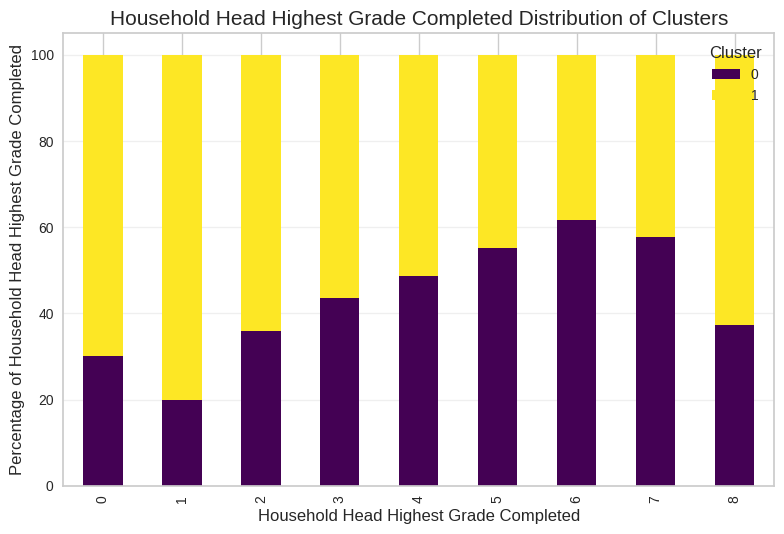

<Figure size 1400x800 with 0 Axes>

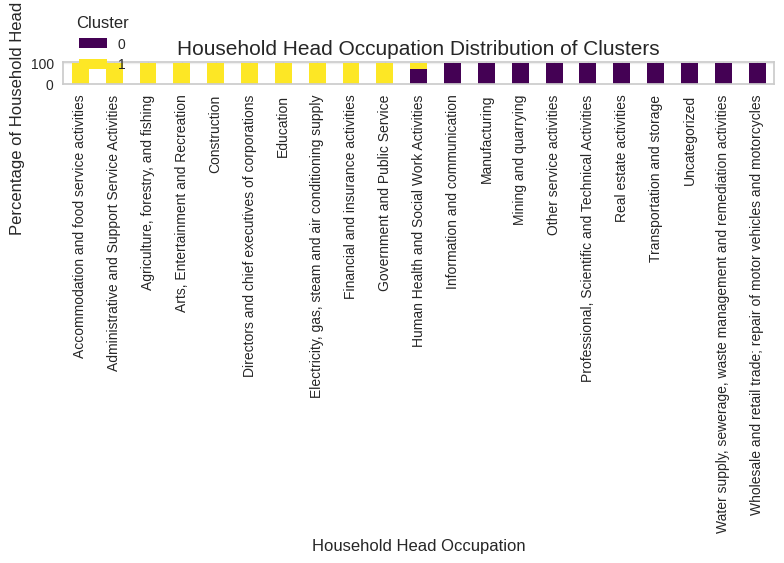

In [ ]:
for col in household_categorical_desc:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()